# GUC Clustering Project

**Objective:**
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student:
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional)
* How to evaluate clustering approachs
* How to display the output
* What is the effect of normalizing the data

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas




In [ ]:
# if plotnine is not installed in Jupter then use the following command to install it


## Libaries

Running this project require the following imports

In [8]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *
# StandardScaler is a function to normalize the data
# You may also check MinMaxScaler and MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from matplotlib.colors import LogNorm

from sklearn.metrics import silhouette_score

%matplotlib inline

In [ ]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using



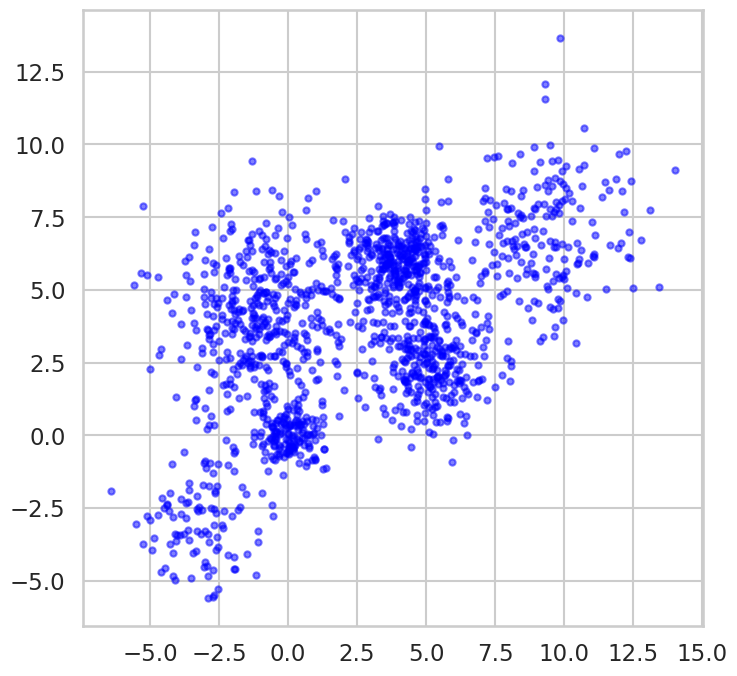

In [ ]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans
* Use Kmeans with different values of K to cluster the above data
* Display the outcome of each value of K
* Plot distortion function versus K and choose the approriate value of k
* Plot the silhouette_score versus K and use it to choose the best K
* Store the silhouette_score for the best K for later comparison with other clustering techniques.

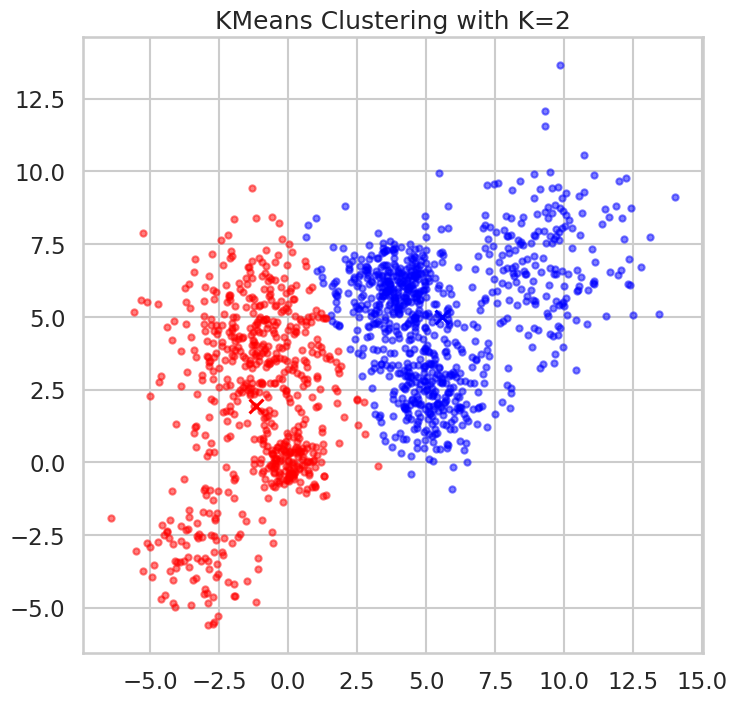

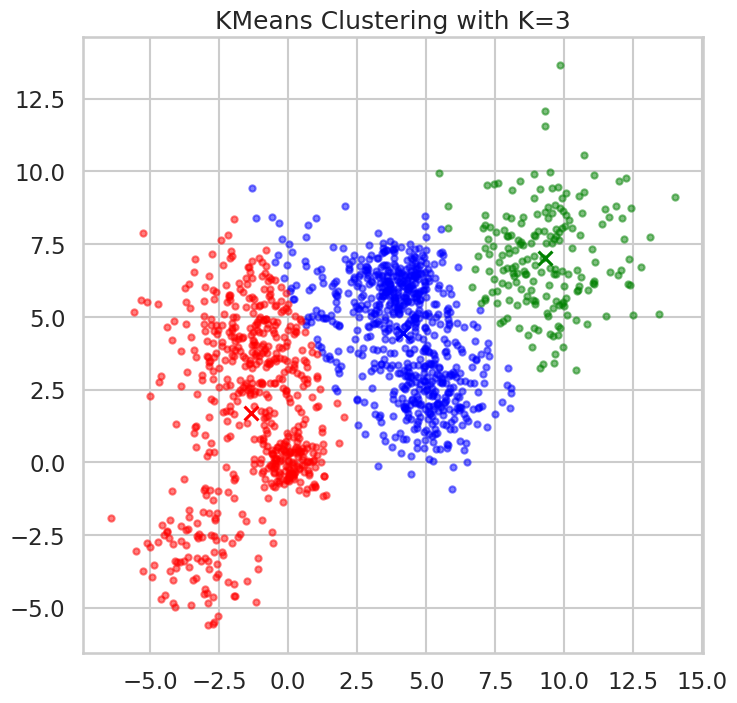

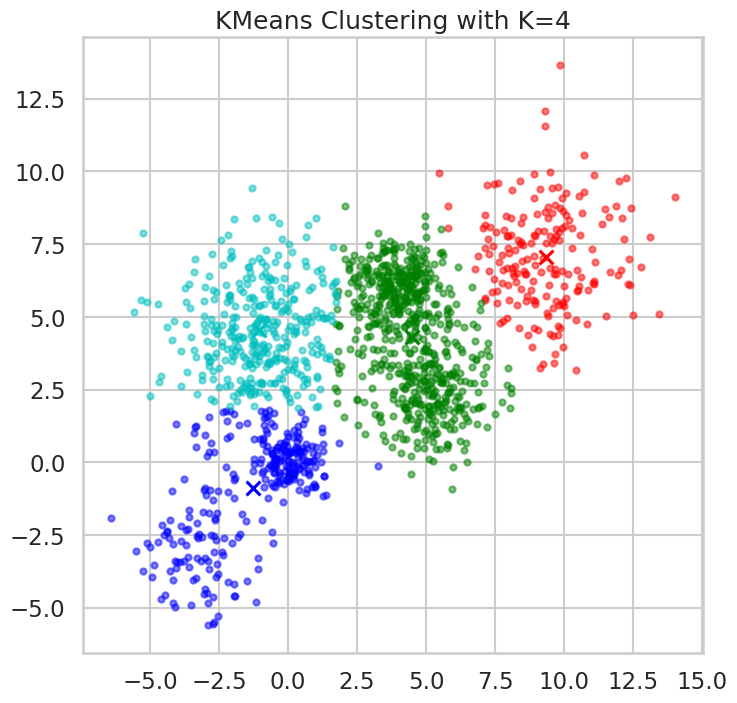

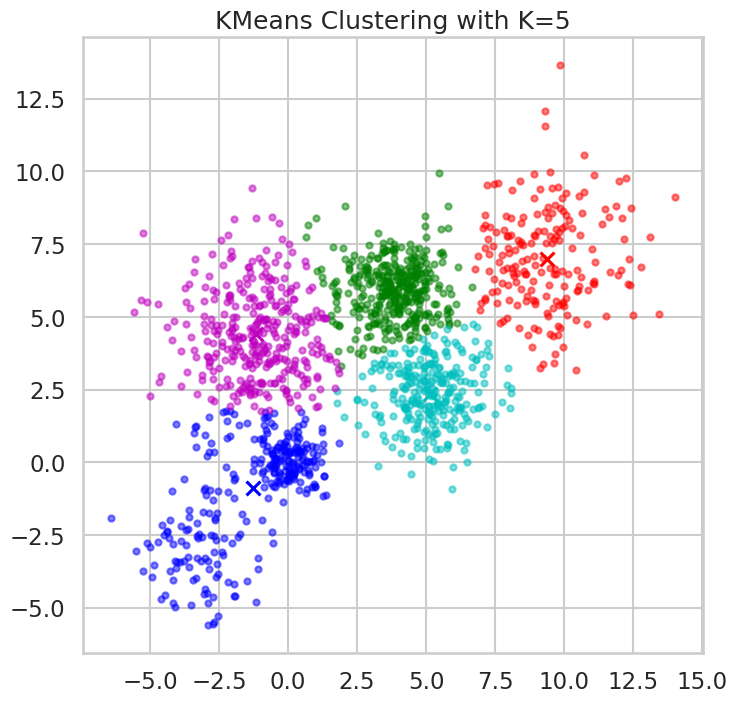

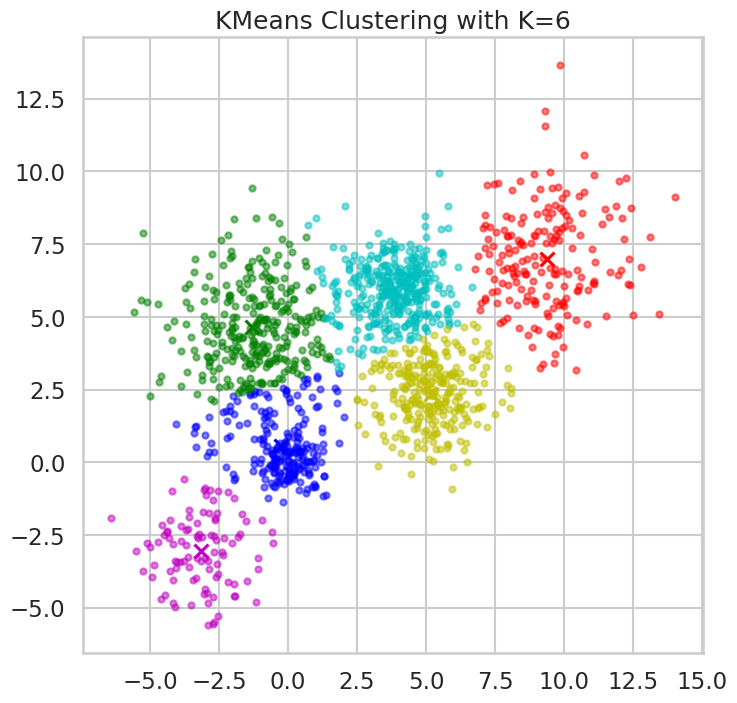

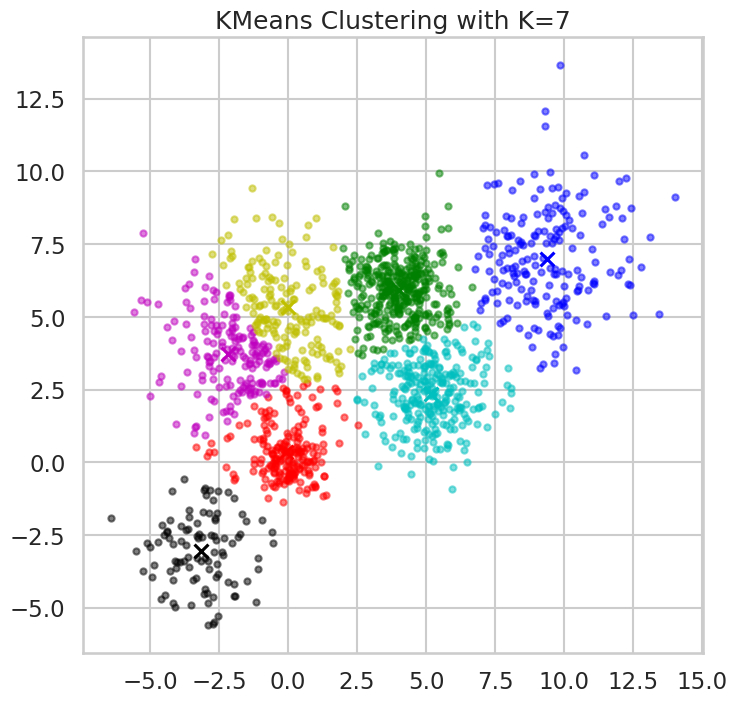

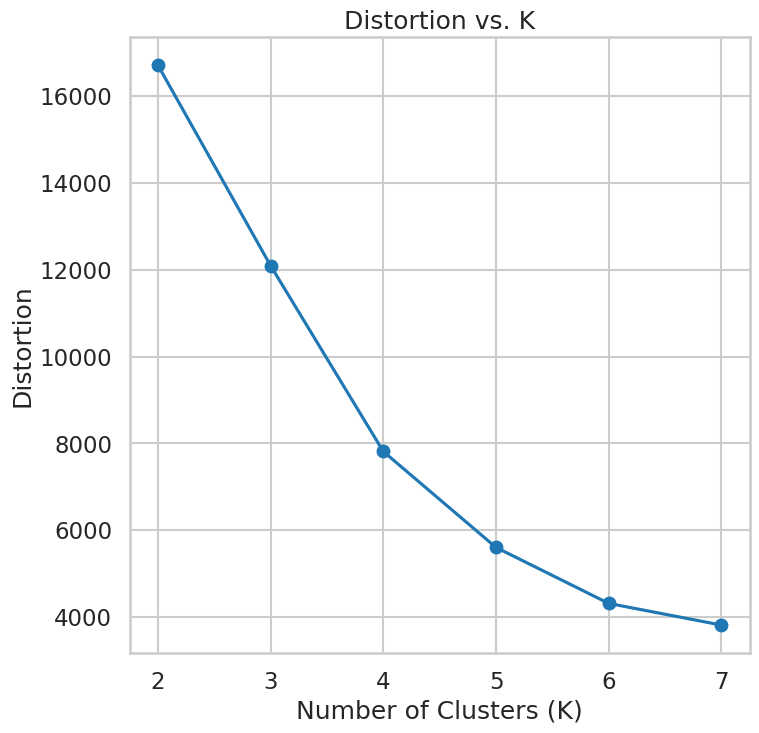

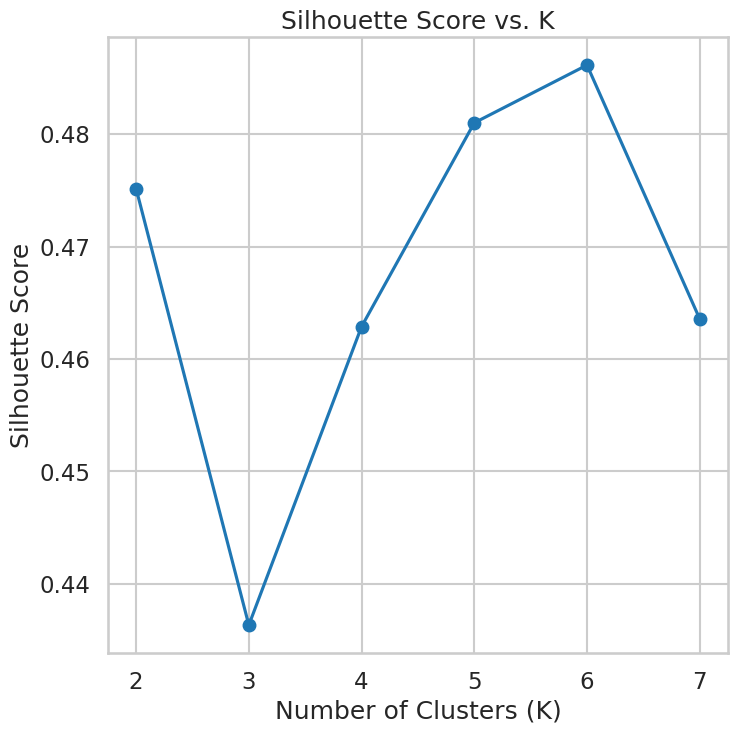

The best K based on silhouette score is: 6
Silhouette score for the best K: 0.48614459735646176


In [ ]:
# Applying KMeans with different values of K
k_values = range(2, 8)
distortions = []
silhouette_scores = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(Multi_blob_Data)

    # Display clusters for each K
    plt.figure()
    display_cluster(Multi_blob_Data, km=kmeans, num_clusters=k)
    plt.title(f"KMeans Clustering with K={k}")
    plt.show()

    # Compute distortion (inertia) for each K
    distortions.append(kmeans.inertia_)

    # Compute silhouette score for each K
    silhouette_avg = silhouette_score(Multi_blob_Data, kmeans.labels_)
    silhouette_scores.append(silhouette_avg)

# Plot the distortion function versus K
plt.figure()
plt.plot(k_values, distortions, marker='o')
plt.title('Distortion vs. K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.show()

# Plot the silhouette_score versus K
plt.figure()
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score vs. K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.show()

# Choose the best K based on silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
print(f"The best K based on silhouette score is: {best_k}")

# Store the silhouette_score for the best K for later comparison
best_k_silhouette_score = max(silhouette_scores)
print(f"Silhouette score for the best K: {best_k_silhouette_score}")

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data
* In the  AgglomerativeClustering change the following parameters
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* Record your observation

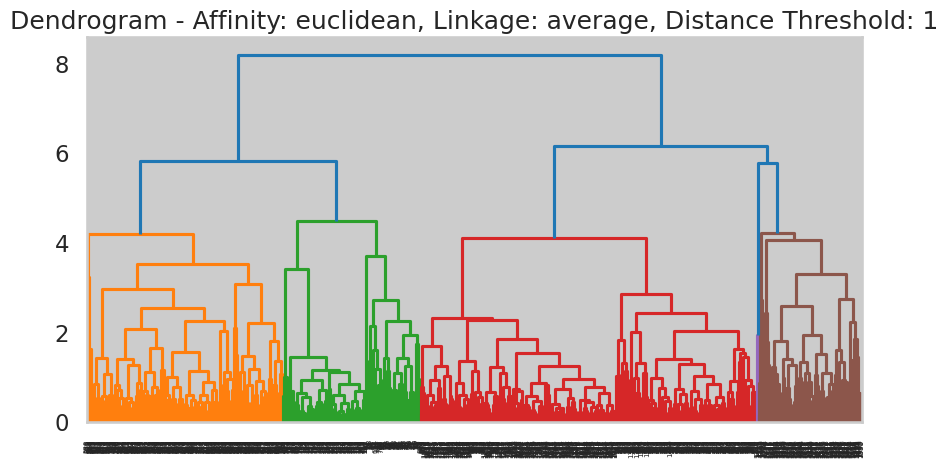

Silhouette score for Affinity: euclidean, Linkage: average, Distance Threshold: 1 is: 0.32384977908646284


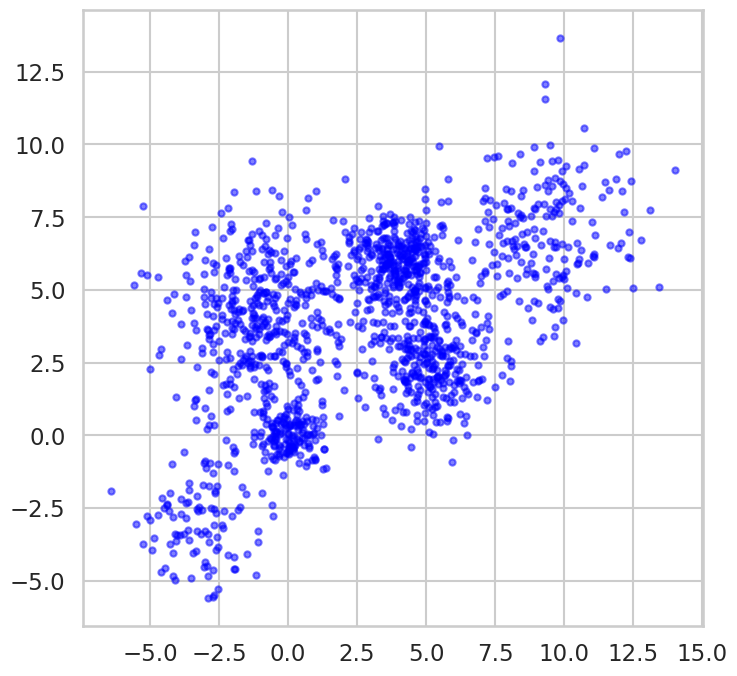

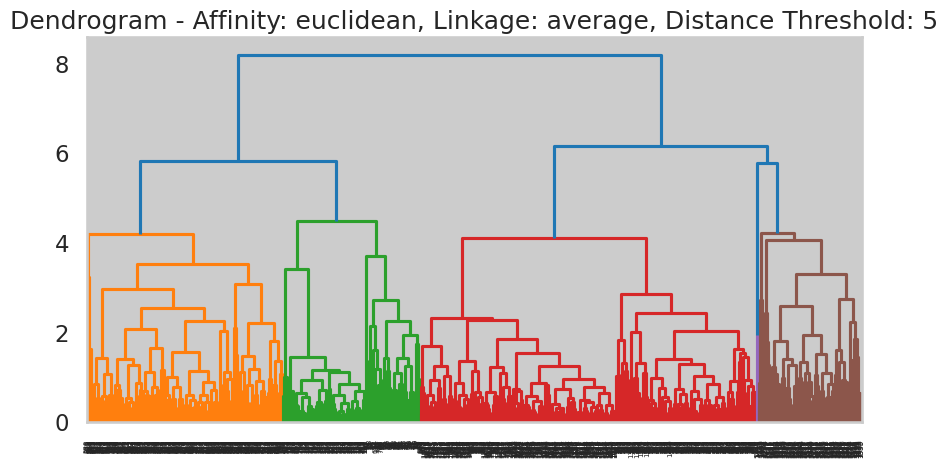

Silhouette score for Affinity: euclidean, Linkage: average, Distance Threshold: 5 is: 0.433187948807373


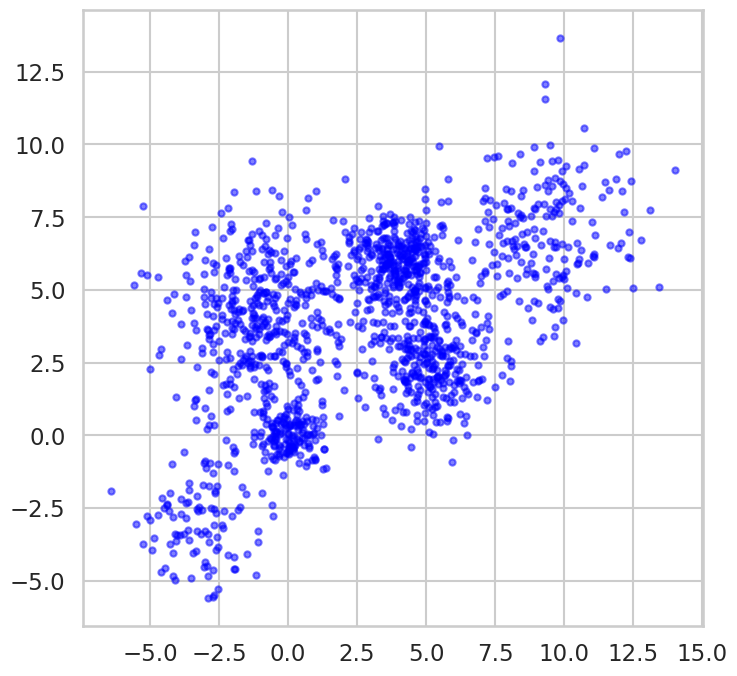

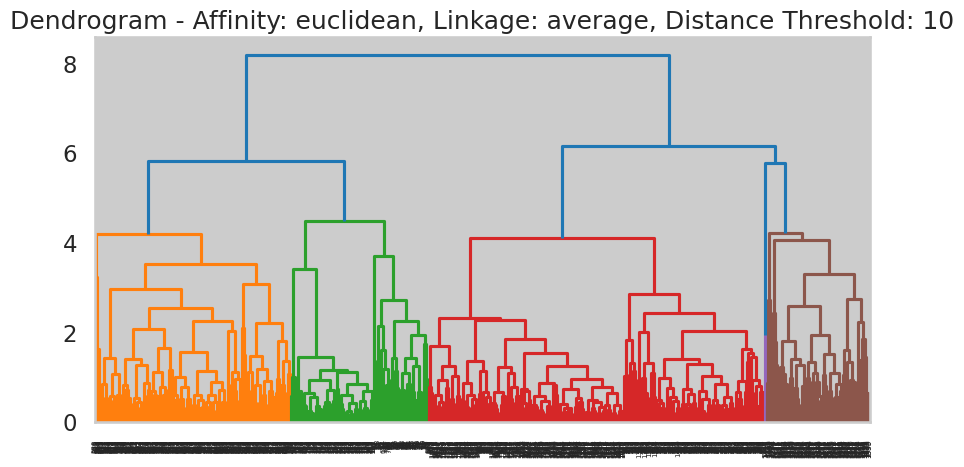

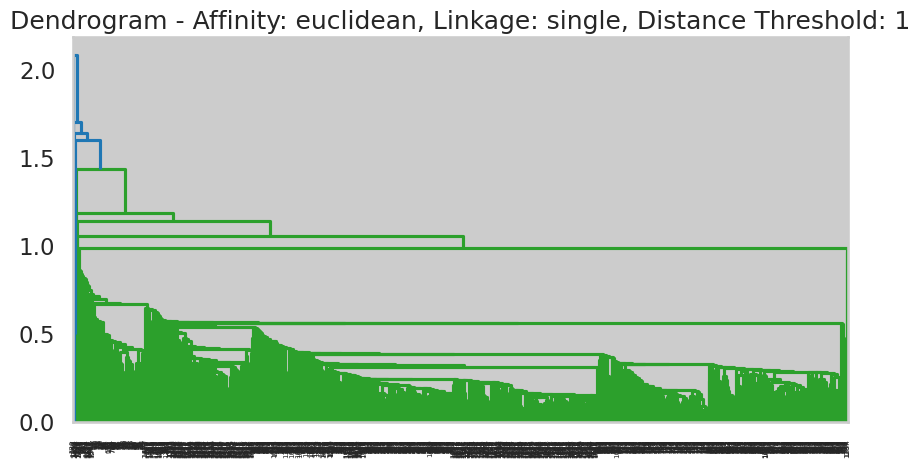

Silhouette score for Affinity: euclidean, Linkage: single, Distance Threshold: 1 is: -0.14944154607335855


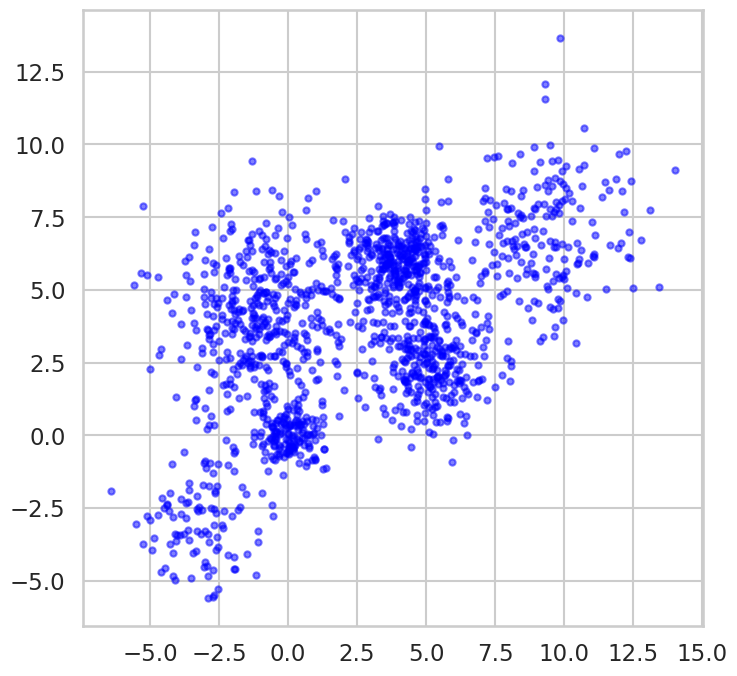

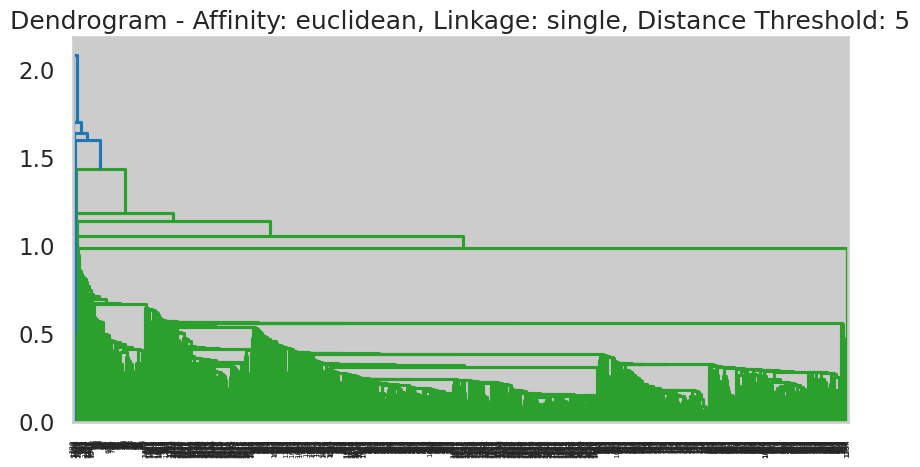

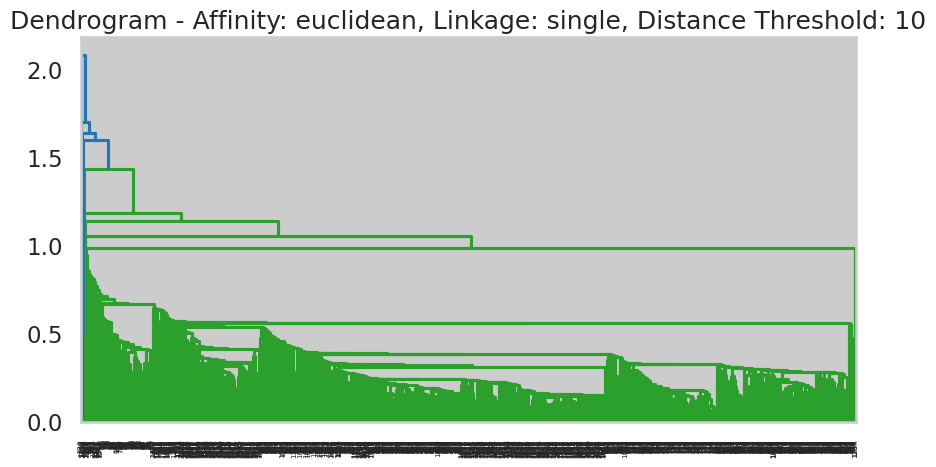

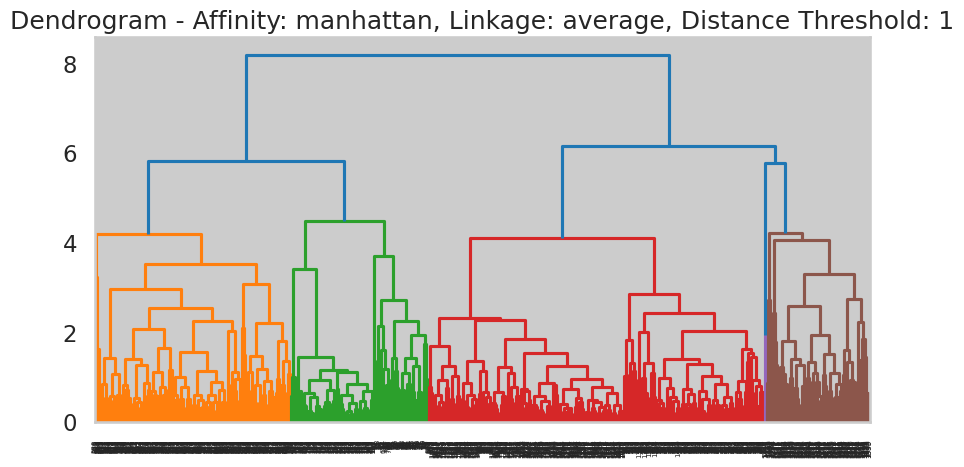

Silhouette score for Affinity: manhattan, Linkage: average, Distance Threshold: 1 is: 0.34093328073765305


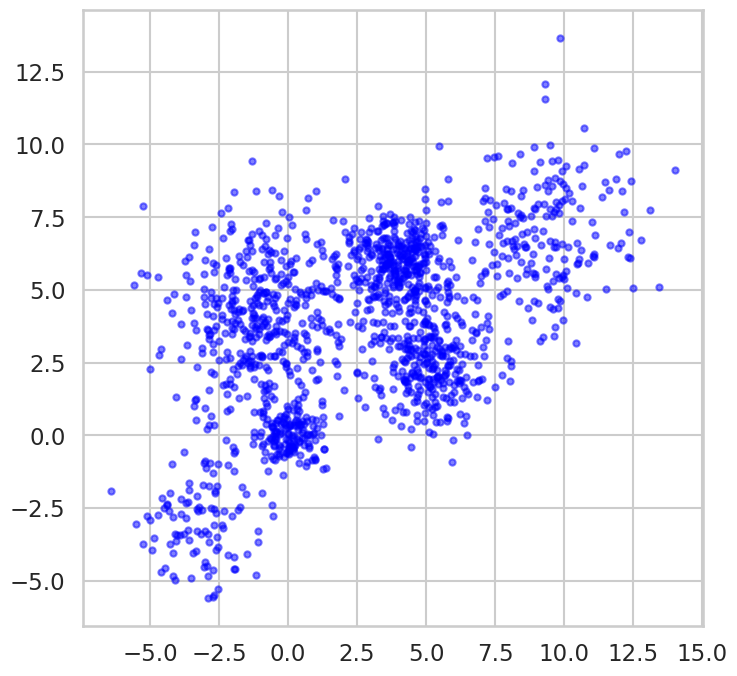

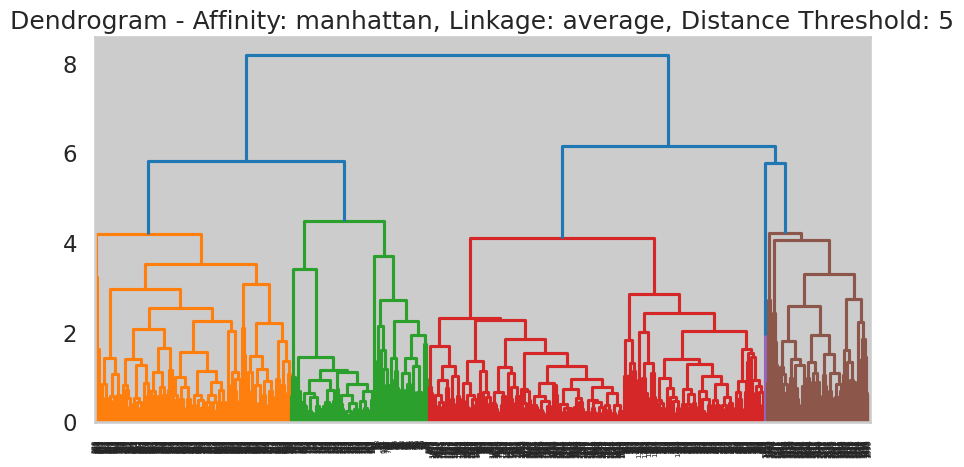

Silhouette score for Affinity: manhattan, Linkage: average, Distance Threshold: 5 is: 0.399558543983381


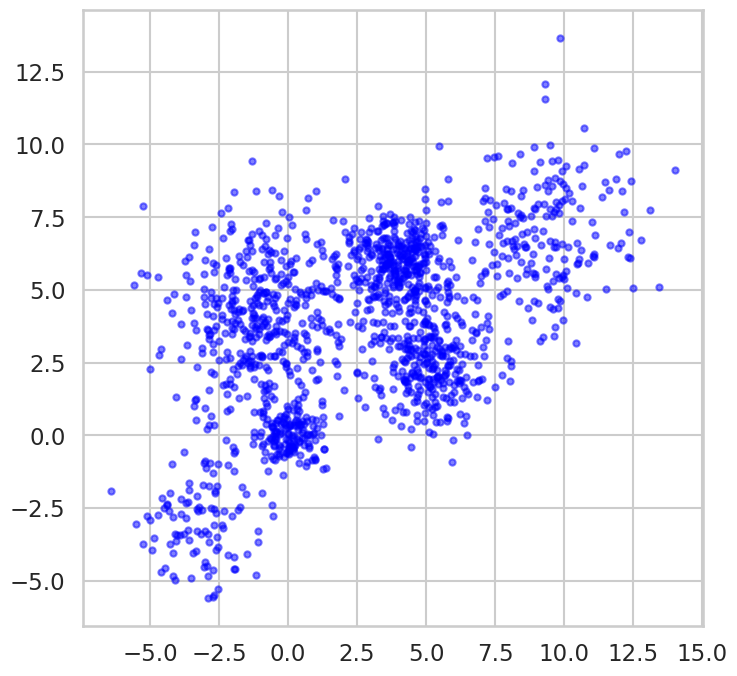

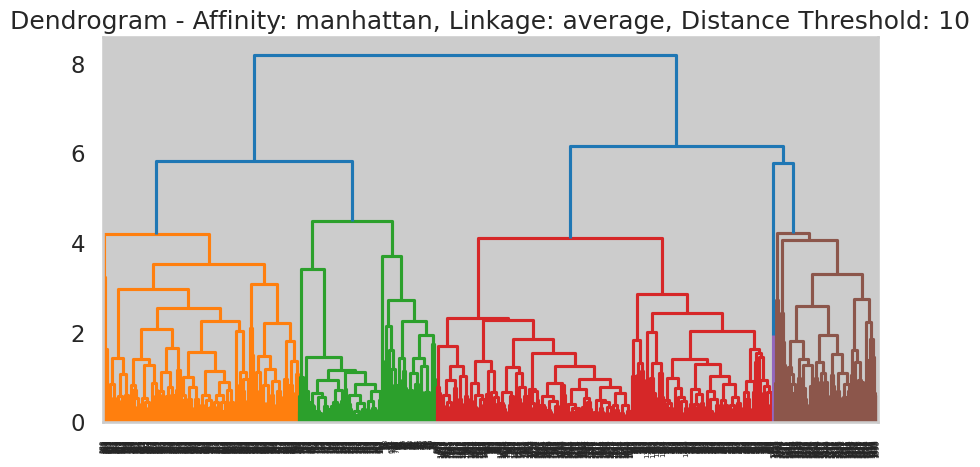

Silhouette score for Affinity: manhattan, Linkage: average, Distance Threshold: 10 is: 0.46762361386512785


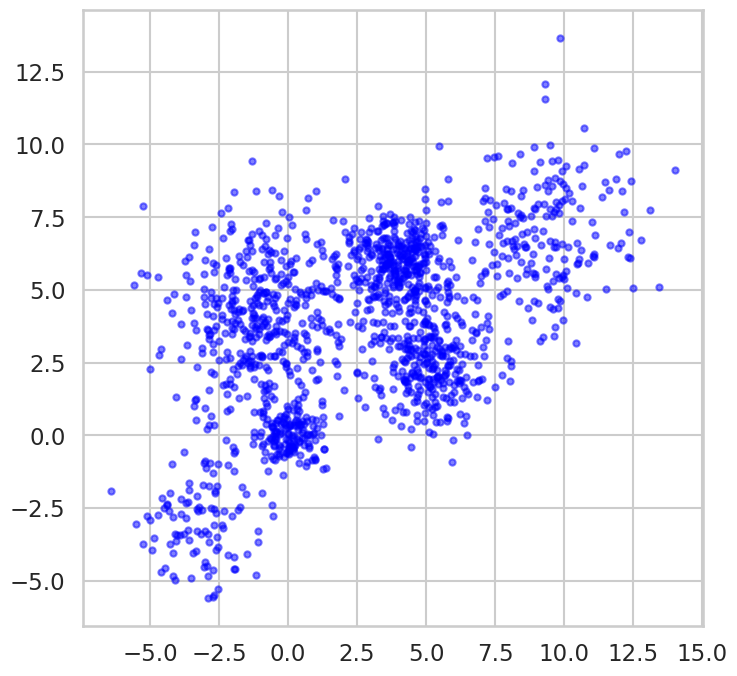

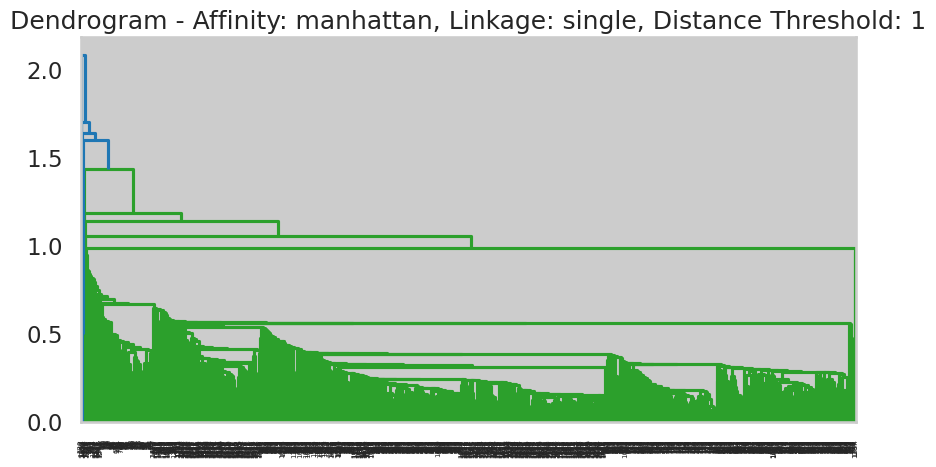

Silhouette score for Affinity: manhattan, Linkage: single, Distance Threshold: 1 is: -0.4080040507331309


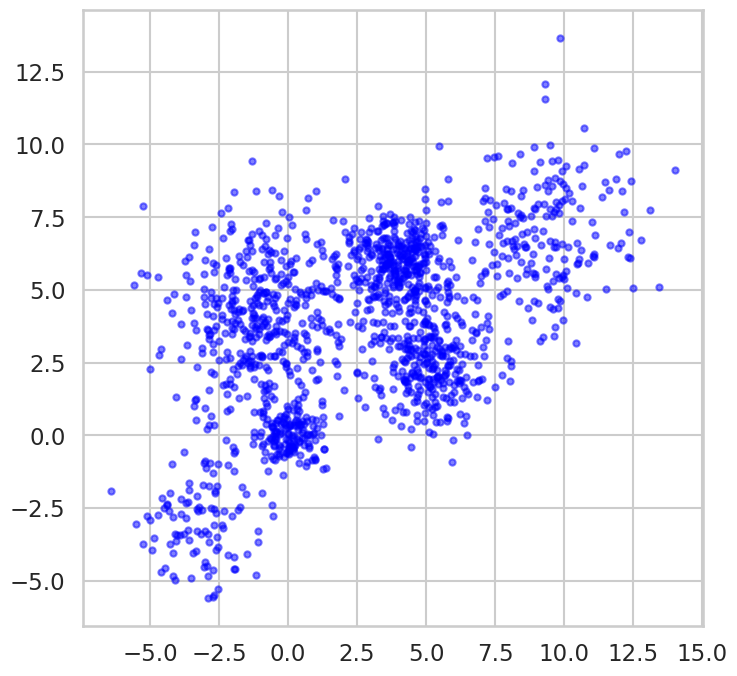

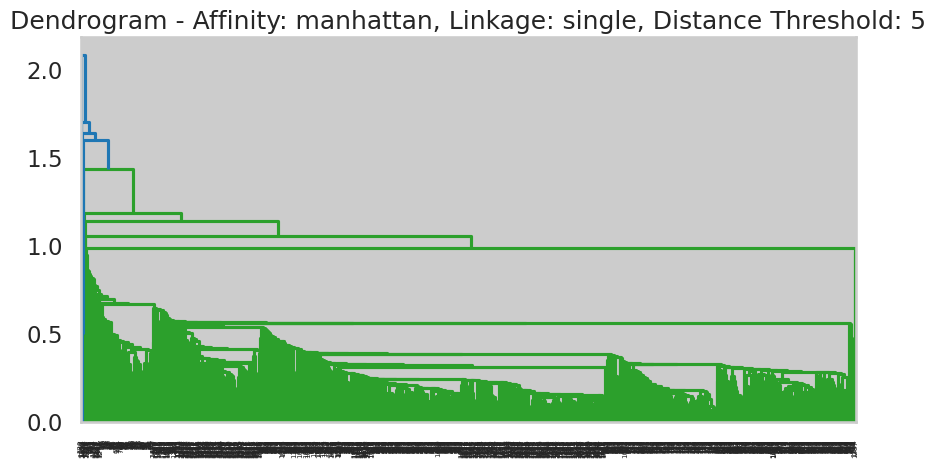

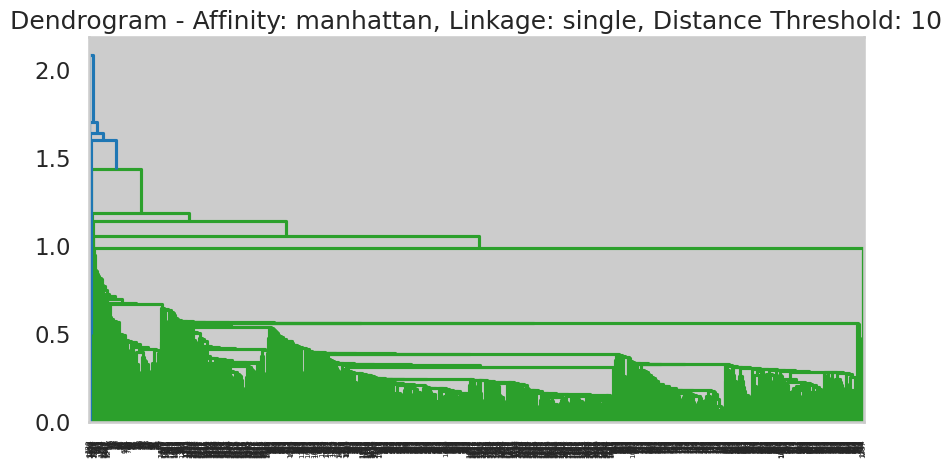

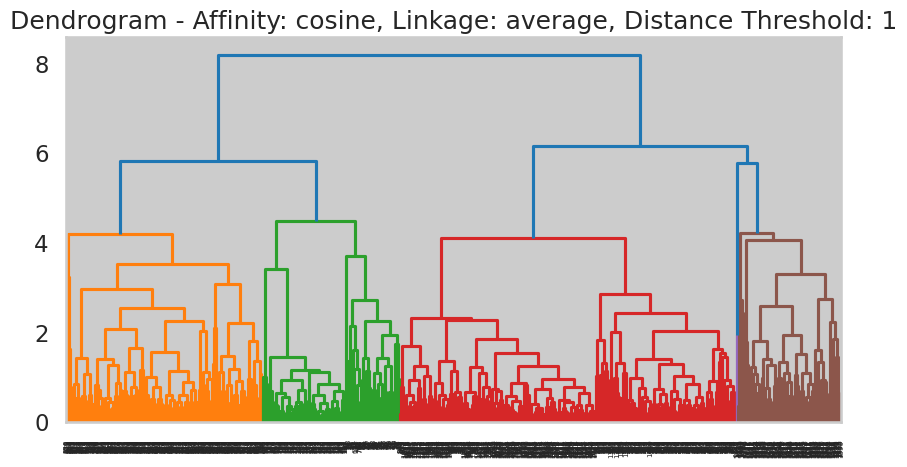

Silhouette score for Affinity: cosine, Linkage: average, Distance Threshold: 1 is: 0.35251834131557364


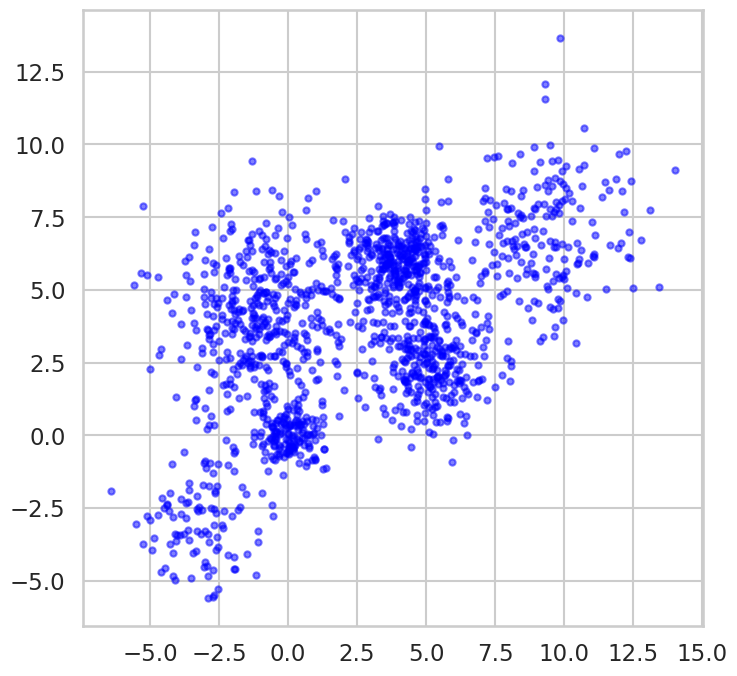

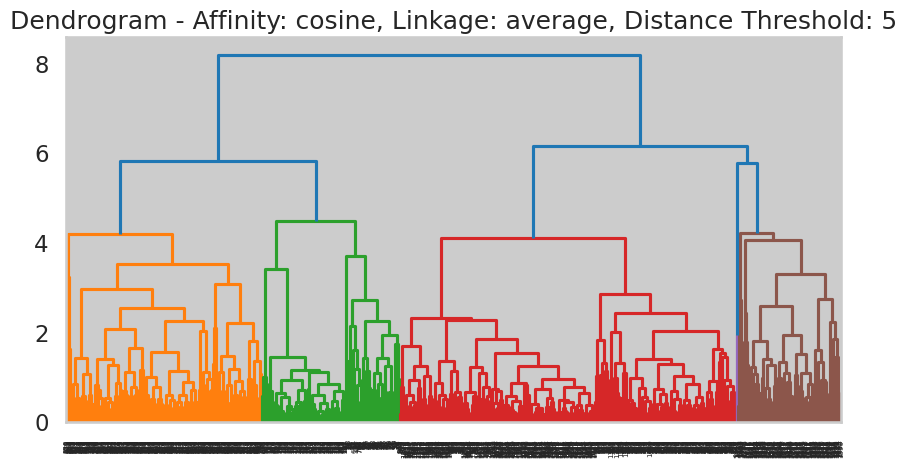

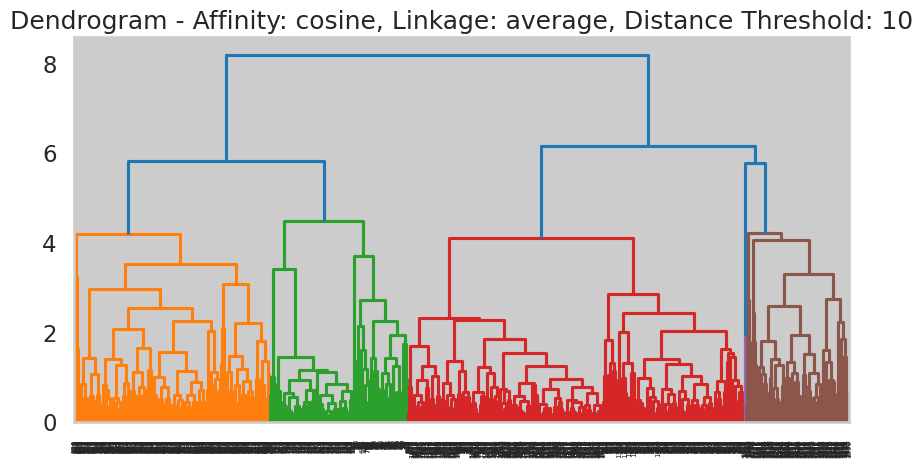

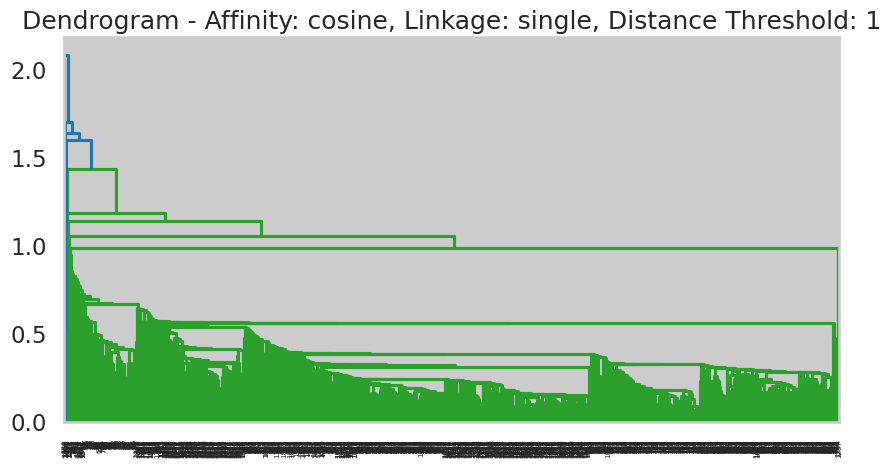

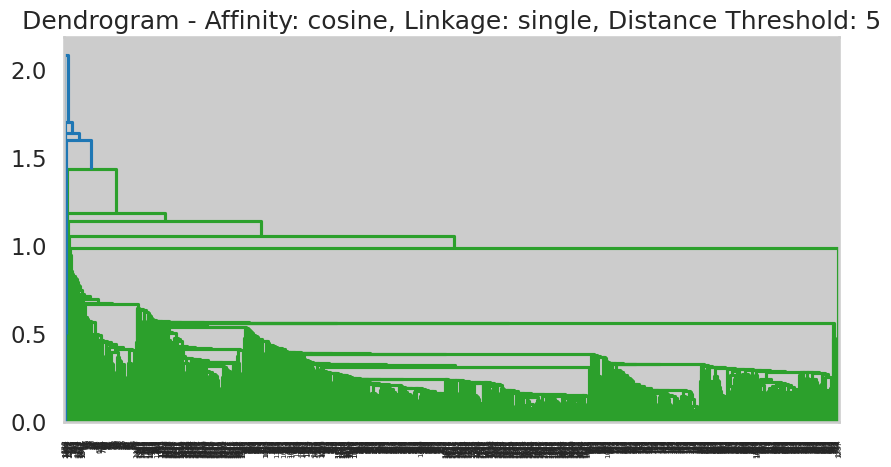

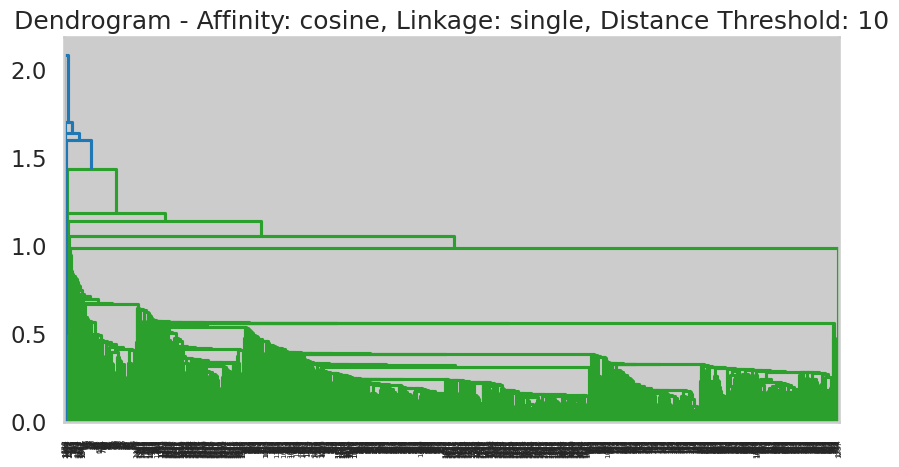


Best Parameters:
{'Affinity': 'manhattan', 'Linkage': 'average', 'Distance_Threshold': 10}
Best Silhouette Score: 0.46762361386512785


In [ ]:
# Parameters to experiment with
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['average', 'single']
distance_thresholds = [1, 5, 10]

best_silhouette_score = float('-inf')
best_params = {}

# Perform Agglomerative Clustering with different parameters
for affinity in affinities:
    for linkage_method in linkages:
        for distance_threshold in distance_thresholds:
            model = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage_method, distance_threshold=distance_threshold)
            labels = model.fit_predict(Multi_blob_Data)

            # Plot dendrogram
            plt.figure(figsize=(10, 5))
            dendrogram(linkage(Multi_blob_Data, method = linkage_method))
            plt.title(f'Dendrogram - Affinity: {affinity}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold}')
            plt.show()

            # Calculate silhouette score
            unique_labels = np.unique(labels)
            if len(unique_labels) > 1:
              silhouette_avg = silhouette_score(Multi_blob_Data, labels)
              print(f"Silhouette score for Affinity: {affinity}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold} is: {silhouette_avg}")

            # Display resulting clusters
              title = f'Agglomerative Clustering - Affinity: {affinity}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold}'
              display_cluster(Multi_blob_Data, labels)

            # Update best parameters if silhouette score is higher
              if silhouette_avg > best_silhouette_score:
                  best_silhouette_score = silhouette_avg
                  best_params['Affinity'] = affinity
                  best_params['Linkage'] = linkage_method
                  best_params['Distance_Threshold'] = distance_threshold

# Display the best parameters and silhouette score
print("\nBest Parameters:")
print(best_params)
print(f"Best Silhouette Score: {best_silhouette_score}")

### DBScan
* Use DBScan function to  to cluster the above data
* In the  DBscan change the following parameters
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* Record your observations and comments

Silhouette score for EPS: 0.1, Min_samples: 5 is: -0.5423348432605972
Silhouette score for EPS: 0.1, Min_samples: 6 is: -0.5008065260955386
Silhouette score for EPS: 0.2, Min_samples: 5 is: -0.3999643249301035
Silhouette score for EPS: 0.2, Min_samples: 6 is: -0.4180866874540623
Silhouette score for EPS: 0.2, Min_samples: 7 is: -0.48893307519972995
Silhouette score for EPS: 0.2, Min_samples: 8 is: -0.44633773926928655
Silhouette score for EPS: 0.2, Min_samples: 9 is: -0.44848274895257567
Silhouette score for EPS: 0.2, Min_samples: 10 is: -0.4342356562032568
Silhouette score for EPS: 0.2, Min_samples: 11 is: -0.44713367908702734
Silhouette score for EPS: 0.2, Min_samples: 12 is: -0.4406511275226322
Silhouette score for EPS: 0.2, Min_samples: 13 is: -0.44353913688654695
Silhouette score for EPS: 0.2, Min_samples: 14 is: -0.008351034682434994
Silhouette score for EPS: 0.2, Min_samples: 15 is: -0.008351034682434994
Silhouette score for EPS: 0.2, Min_samples: 16 is: -0.008351034682434994
Si

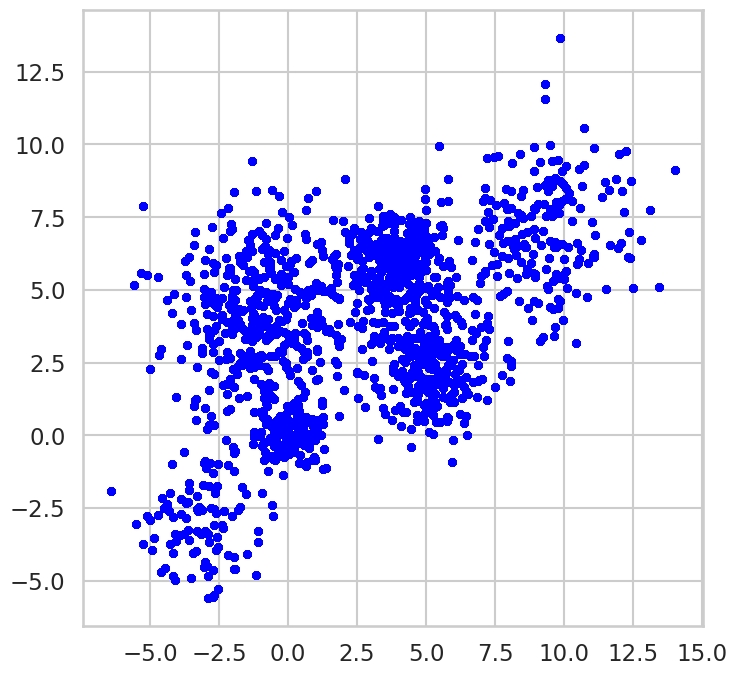

In [ ]:
# Parameters to experiment with
epsilons = np.arange(0.1, 3.1, 0.1)
min_samples_values = range(5, 26)

best_silhouette_score = float('-inf')
best_params = {}

# Perform DBSCAN Clustering with different parameters
for eps in epsilons:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(Multi_blob_Data)

        # Check if there are at least two unique labels for silhouette score
        unique_labels = np.unique(labels)
        if len(unique_labels) > 1:
            # Calculate silhouette score
            silhouette_avg = silhouette_score(Multi_blob_Data, labels)
            print(f"Silhouette score for EPS: {eps}, Min_samples: {min_samples} is: {silhouette_avg}")

            # Display resulting clusters
            title = f'DBSCAN Clustering - EPS: {eps}, Min_samples: {min_samples}'
            display_cluster(Multi_blob_Data, labels)

            # Update best parameters if silhouette score is higher
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_params['EPS'] = eps
                best_params['Min_Samples'] = min_samples

# Display the best parameters and silhouette score
print("\nBest Parameters:")
print(best_params)
print(f"Best Silhouette Score: {best_silhouette_score}")

### Gaussian Mixture
* Use GaussianMixture function to cluster the above data
* In GMM change the covariance_type and check the difference in the resulting proabability fit
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture

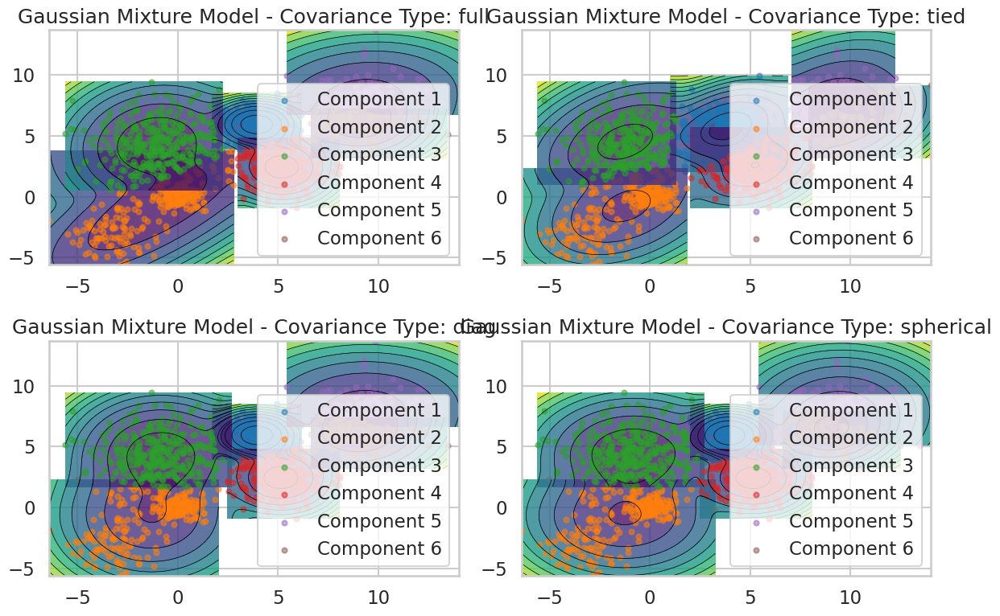

In [10]:
# Parameters to experiment with
covariance_types = ['full', 'tied', 'diag', 'spherical']

# Function to plot 2D contours of Gaussian mixture components
def plot_gaussian_mixture_contours(gmm, X, label, ax):
    x, y = np.meshgrid(np.linspace(np.min(X[:, 0]), np.max(X[:, 0]), 100), np.linspace(np.min(X[:, 1]), np.max(X[:, 1]), 100))
    xy = np.column_stack([x.flatten(), y.flatten()])
    z = -gmm.score_samples(xy)
    z = z.reshape(x.shape)
    ax.contour(x, y, z, levels=10, linewidths=0.5, colors='black', linestyles='solid')
    ax.contourf(x, y, z, levels=10, cmap='viridis', alpha=0.8)
    ax.scatter(X[:, 0], X[:, 1], label=label, s=20, alpha=0.5)

# Perform Gaussian Mixture Modeling with different covariance_types
plt.figure(figsize=(12, 8))

for cov_type in covariance_types:
    gmm = GaussianMixture(n_components=6, covariance_type=cov_type, random_state=42)
    gmm.fit(Multi_blob_Data)

    # Plot 2D contours for each Gaussian mixture component
    ax = plt.subplot(2, 2, covariance_types.index(cov_type) + 1)
    for i in range(gmm.n_components):
        plot_gaussian_mixture_contours(gmm, Multi_blob_Data[gmm.predict(Multi_blob_Data) == i], f'Component {i + 1}', ax)

    plt.title(f'Gaussian Mixture Model - Covariance Type: {cov_type}')
    plt.legend()

plt.tight_layout()
plt.show()

## iris data set
The iris data set is test data set that is part of the Sklearn module
which contains 150 records each with 4 features. All the features are represented by real numbers

The data represents three classes


In [22]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']
x = iris_data.data


* Repeat all the above clustering approaches and steps on the above data
* Normalize the data then repeat all the above steps
* Compare between the different clustering approaches

### Original data

#### `Kmeans:`

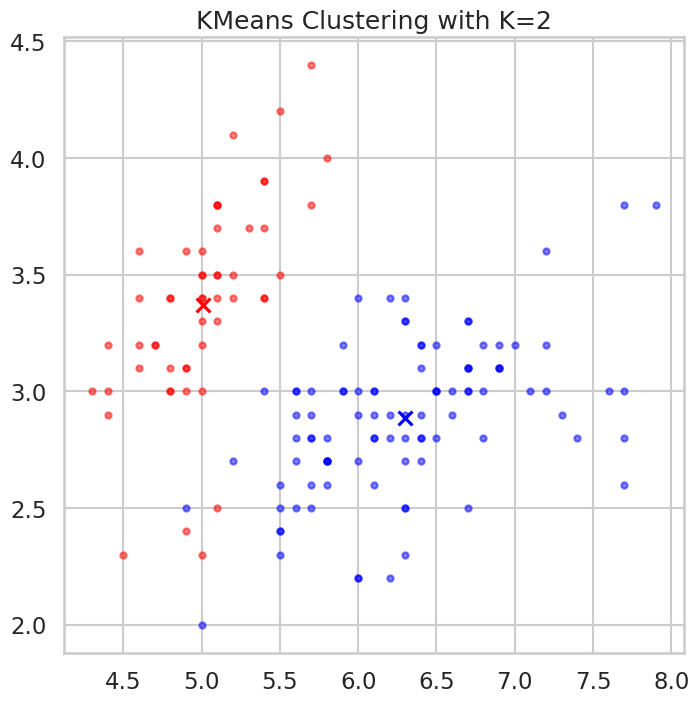

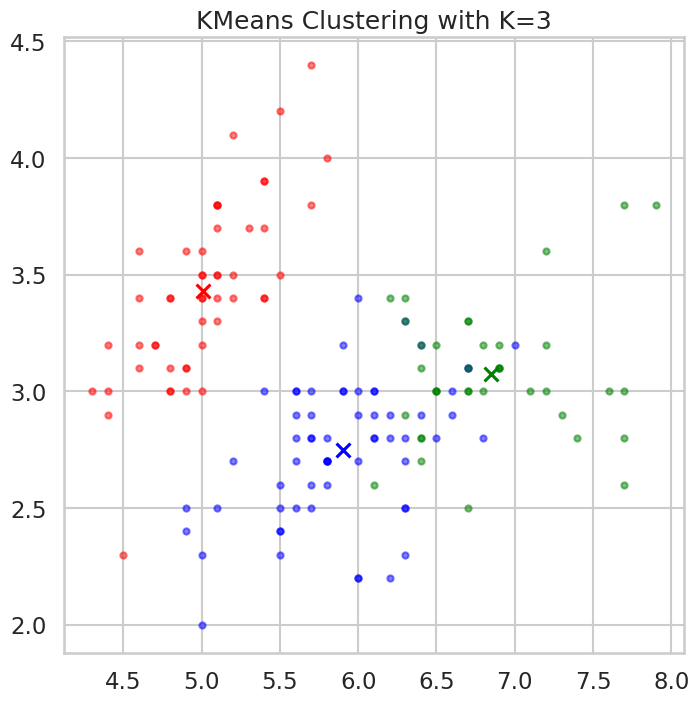

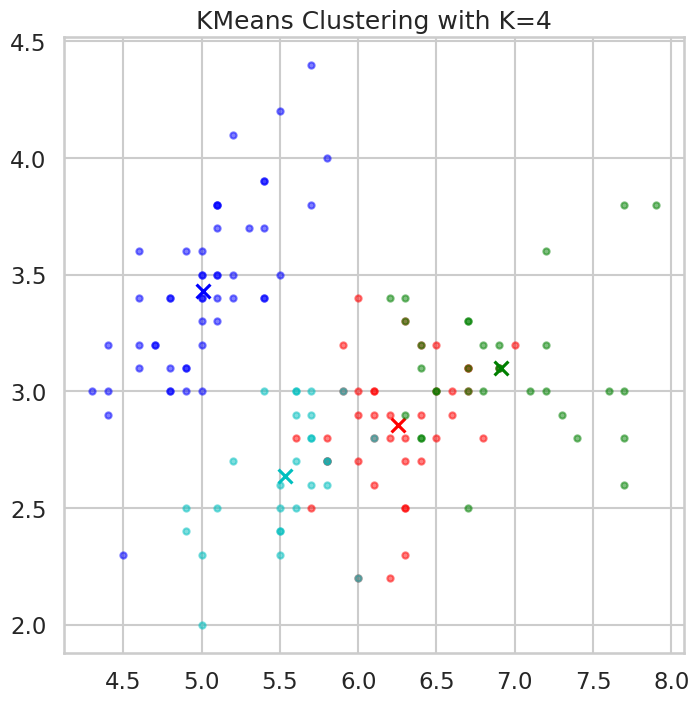

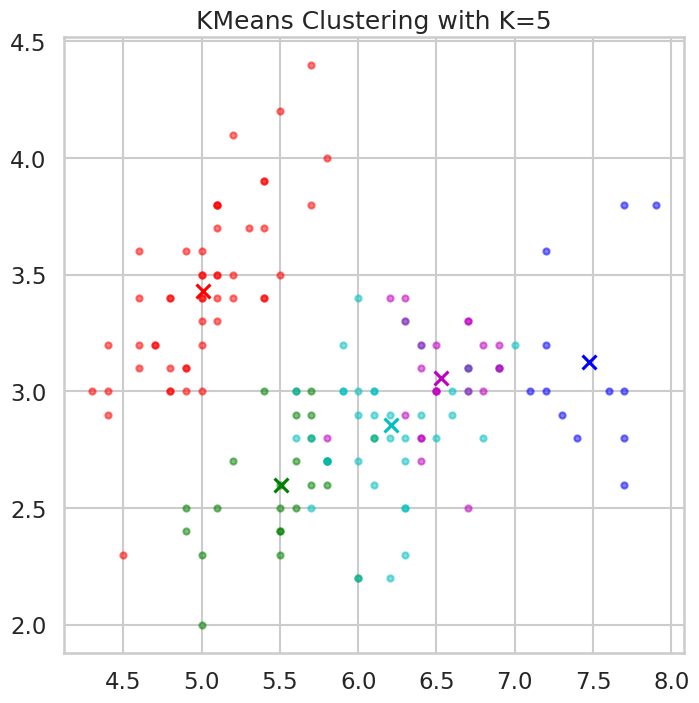

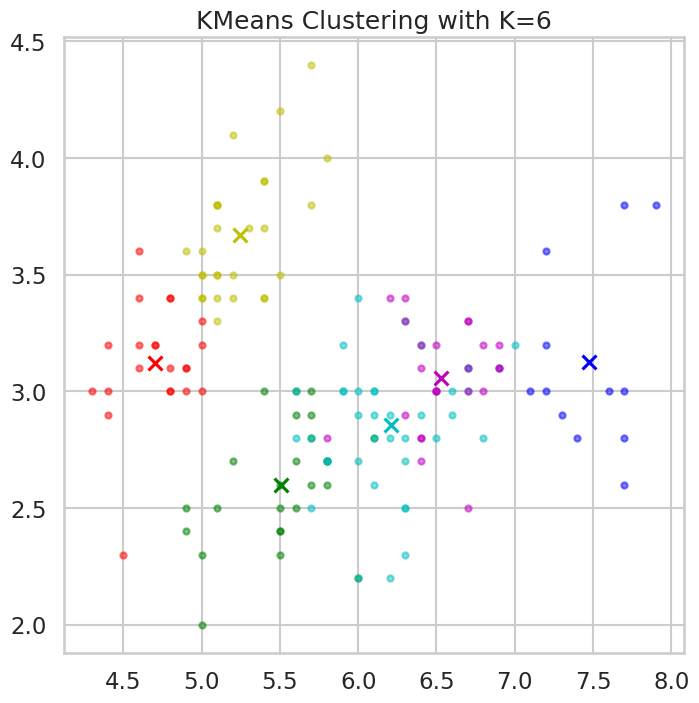

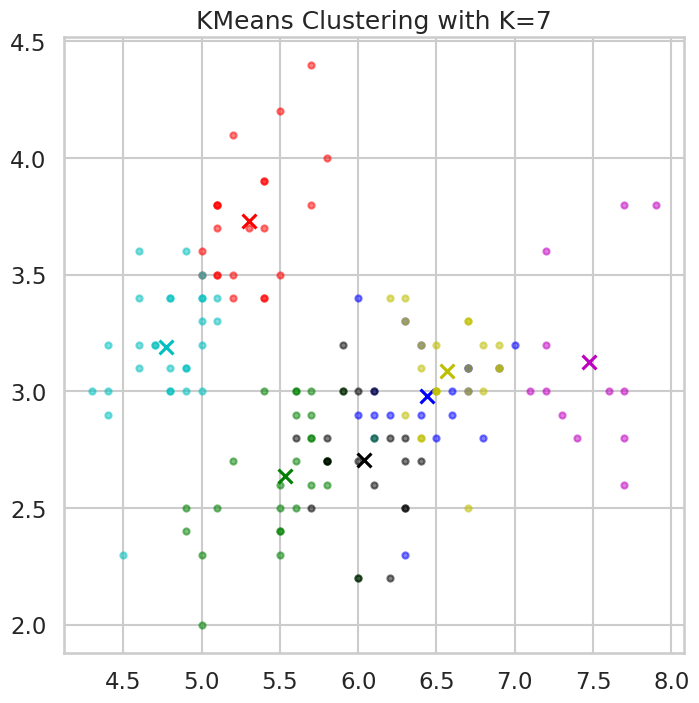

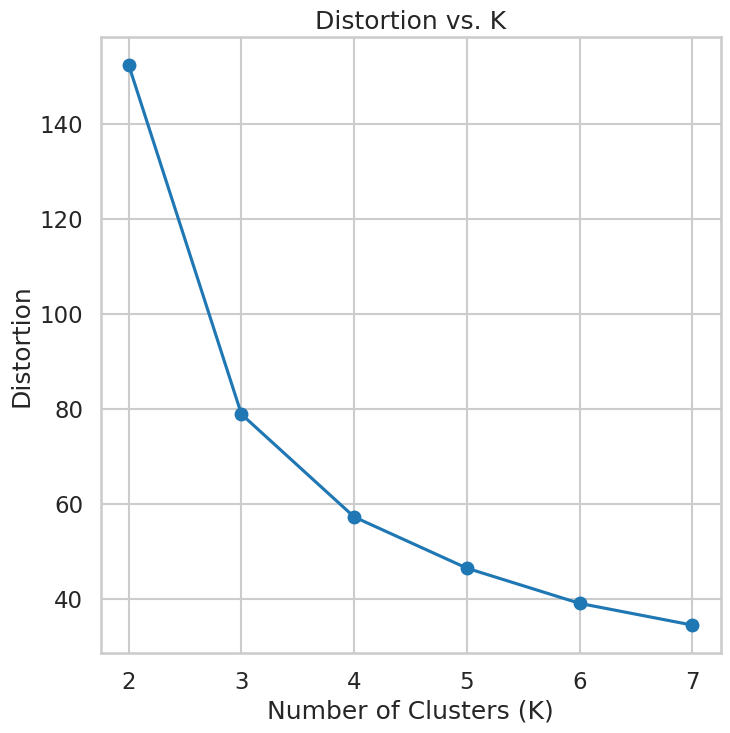

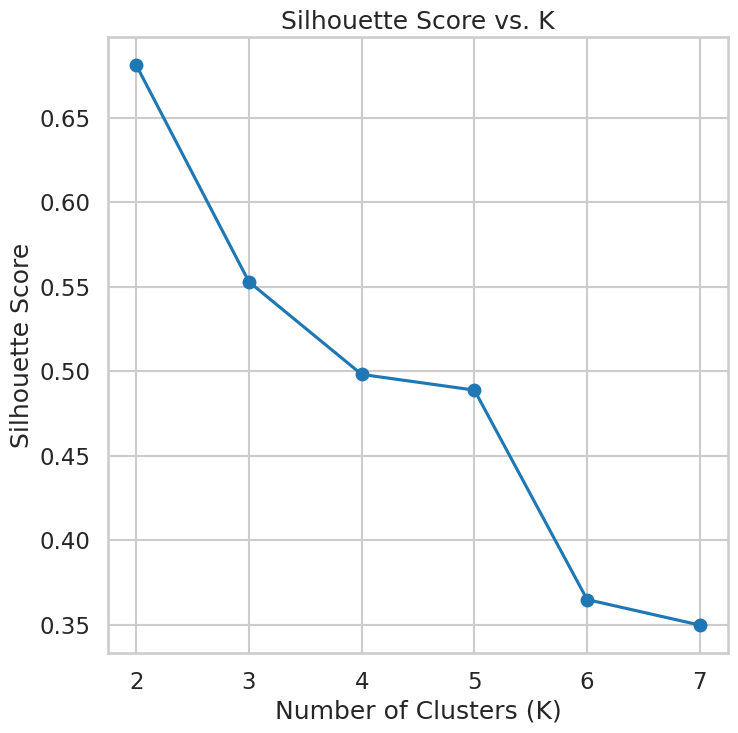

The best K based on silhouette score is: 2
Silhouette score for the best K: 0.6810461692117462


In [ ]:
# Applying KMeans with different values of K
k_values = range(2, 8)
distortions = []
silhouette_scores = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(x)

    # Display clusters for each K
    plt.figure()
    display_cluster(x, km=kmeans, num_clusters=k)
    plt.title(f"KMeans Clustering with K={k}")
    plt.show()

    # Compute distortion (inertia) for each K
    distortions.append(kmeans.inertia_)

    # Compute silhouette score for each K
    silhouette_avg = silhouette_score(x, kmeans.labels_)
    silhouette_scores.append(silhouette_avg)

# Plot the distortion function versus K
plt.figure()
plt.plot(k_values, distortions, marker='o')
plt.title('Distortion vs. K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.show()

# Plot the silhouette_score versus K
plt.figure()
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score vs. K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.show()

# Choose the best K based on silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
print(f"The best K based on silhouette score is: {best_k}")

# Store the silhouette_score for the best K for later comparison
best_k_silhouette_score = max(silhouette_scores)
print(f"Silhouette score for the best K: {best_k_silhouette_score}")

#### Hierarchal Clustering:





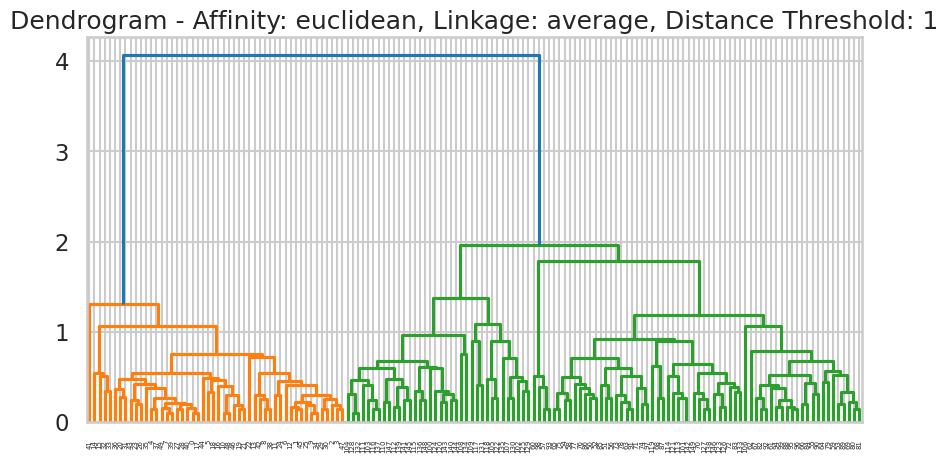

Silhouette score for Affinity: euclidean, Linkage: average, Distance Threshold: 1 is: 0.30828513418773884


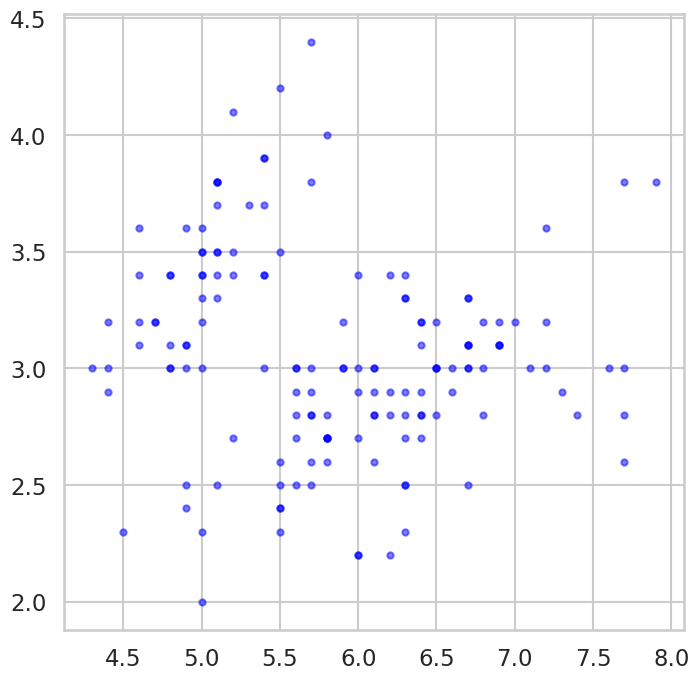

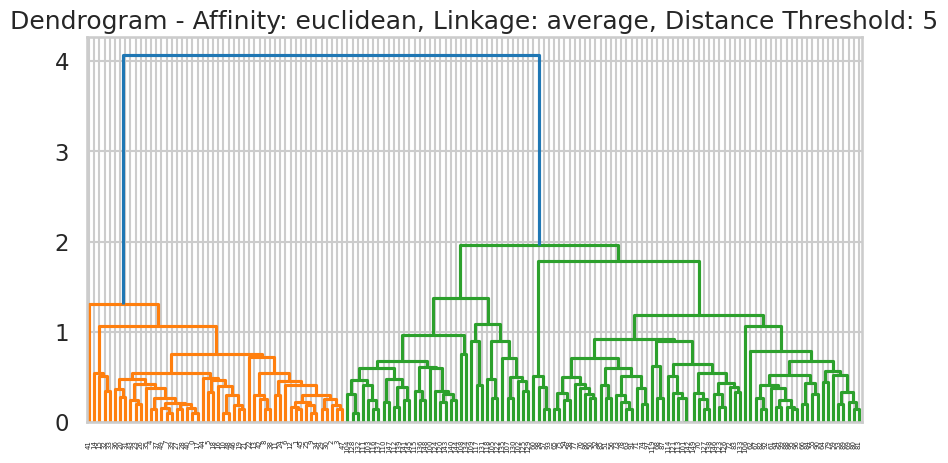

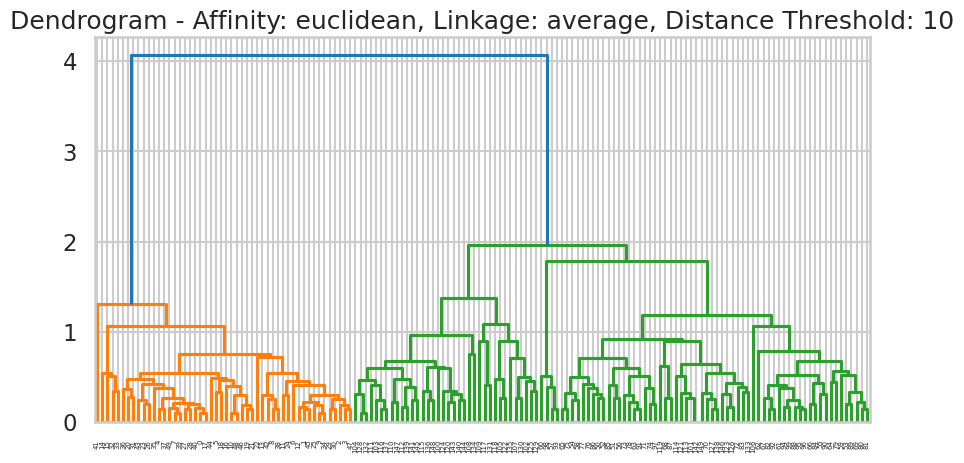

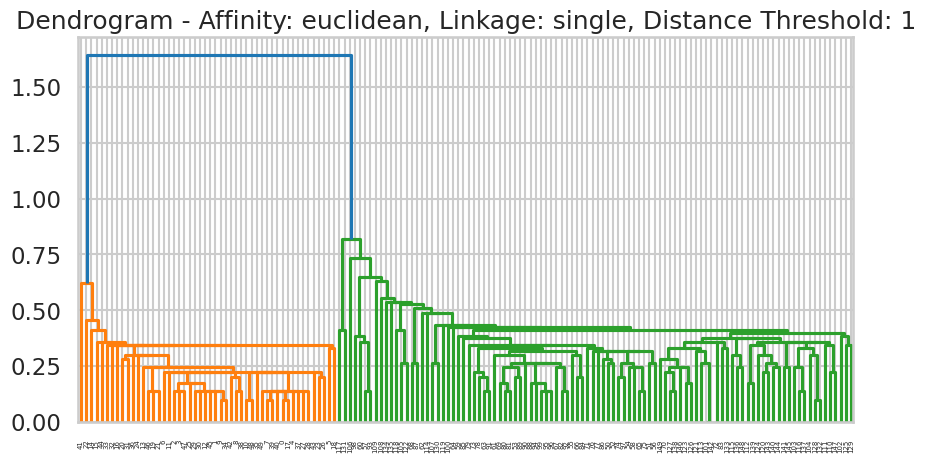

Silhouette score for Affinity: euclidean, Linkage: single, Distance Threshold: 1 is: 0.6867350732769777


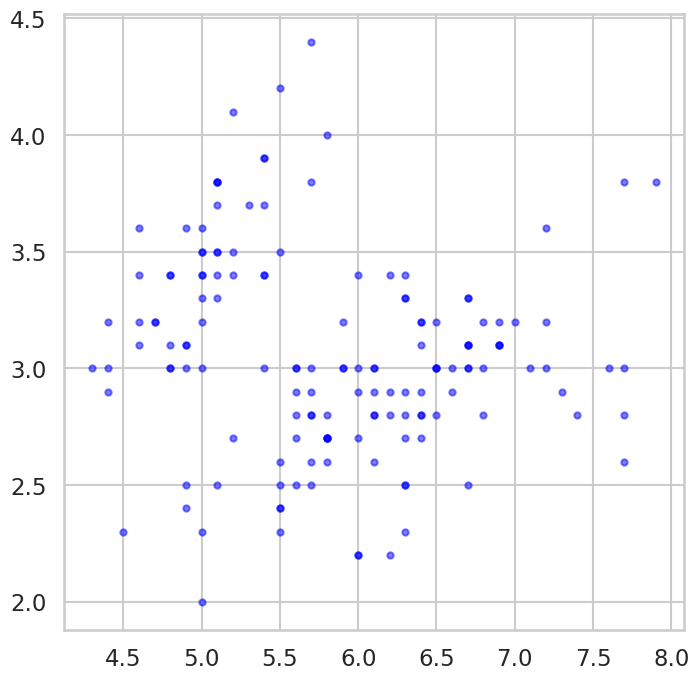

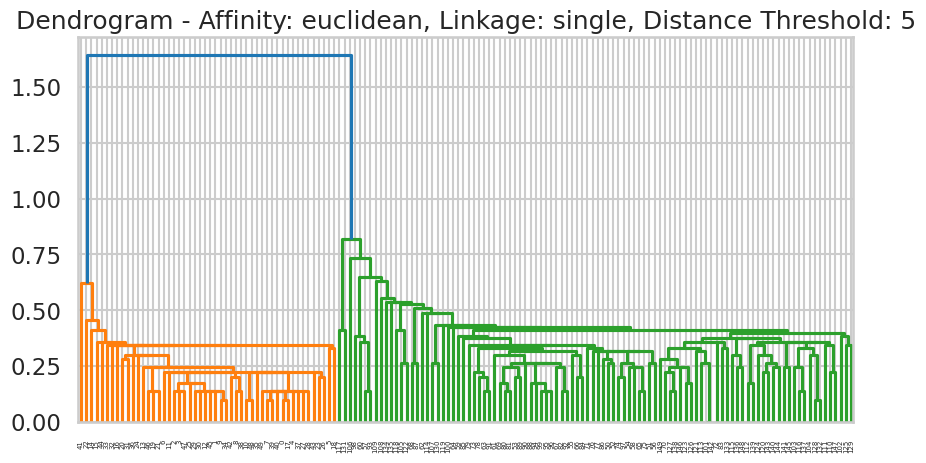

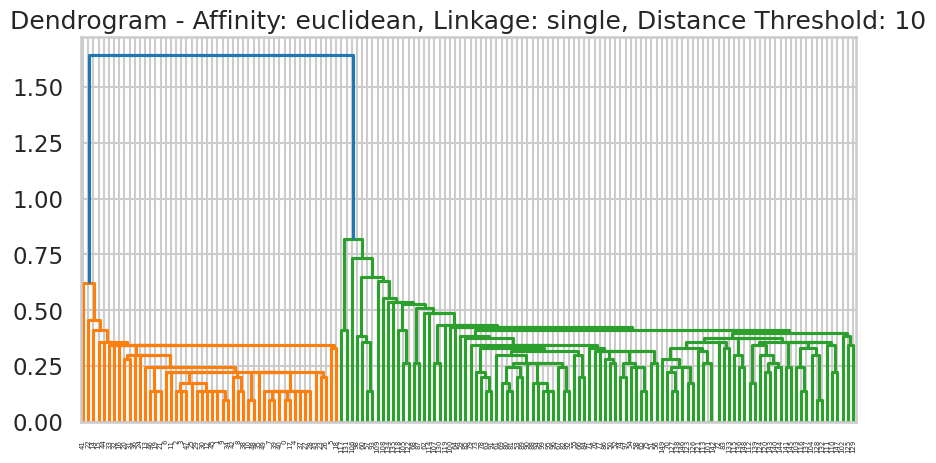

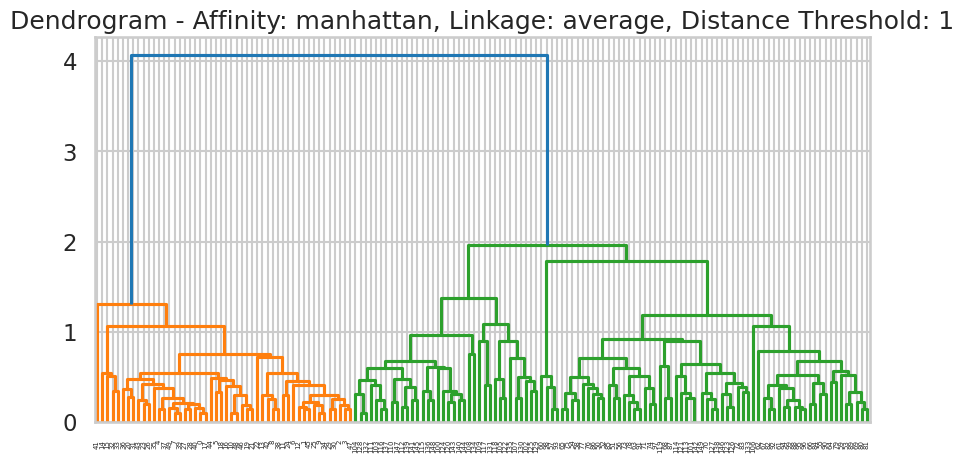

Silhouette score for Affinity: manhattan, Linkage: average, Distance Threshold: 1 is: 0.26306030563698024


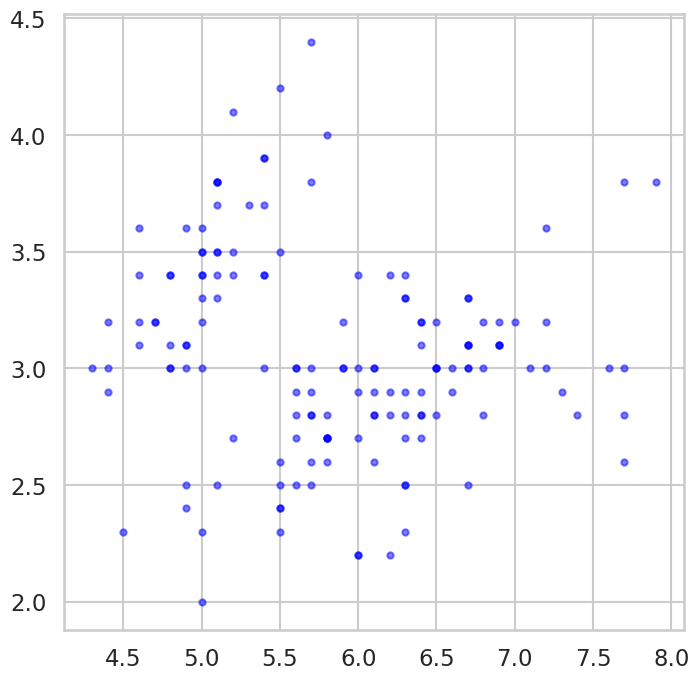

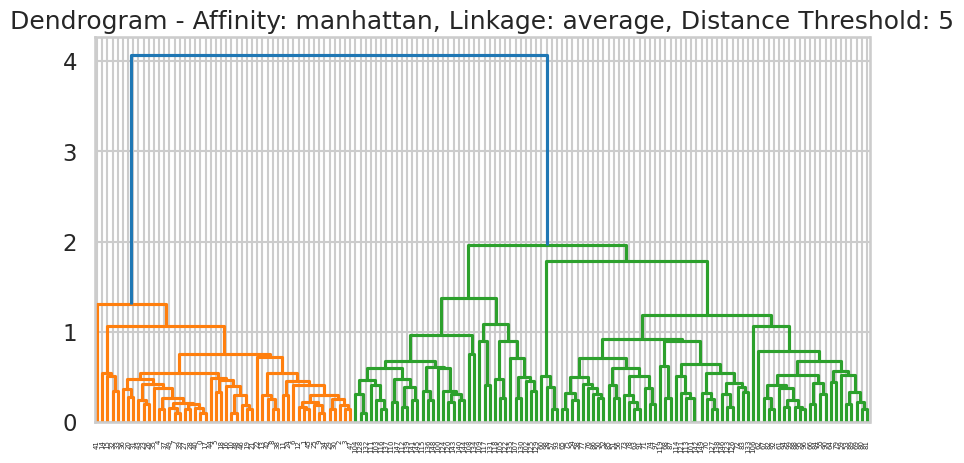

Silhouette score for Affinity: manhattan, Linkage: average, Distance Threshold: 5 is: 0.6867350732769777


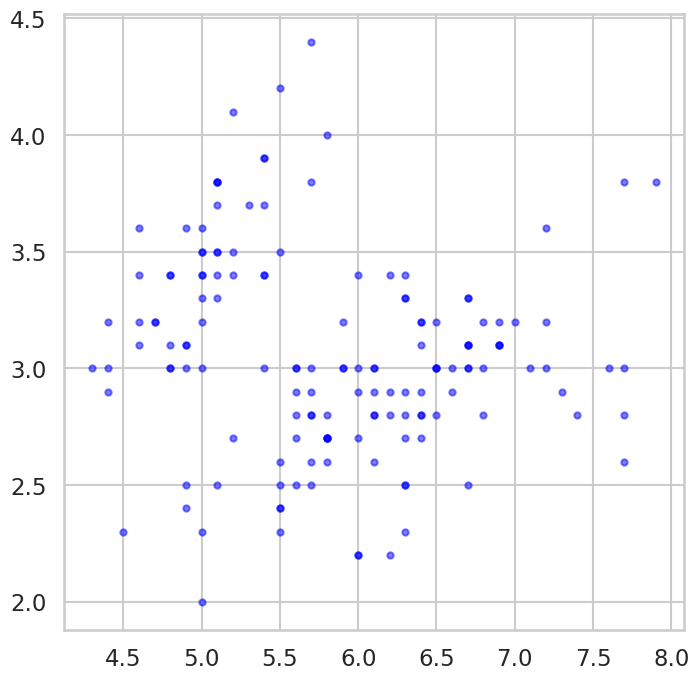

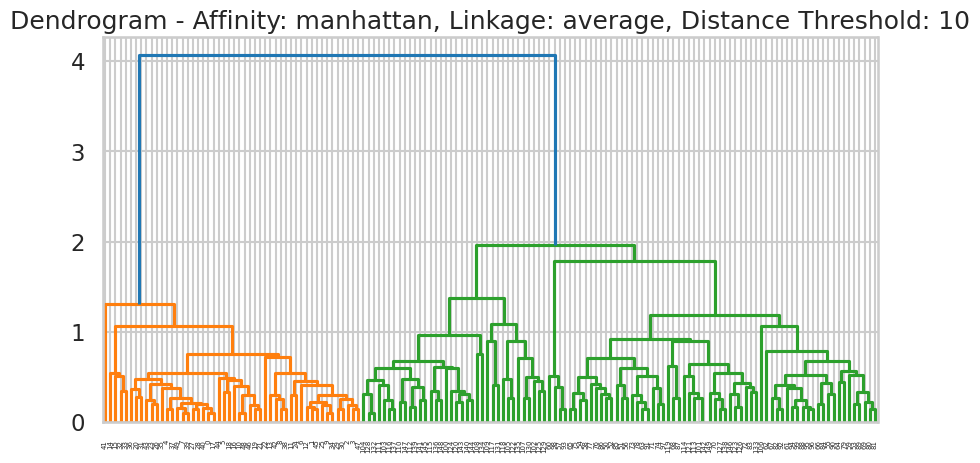

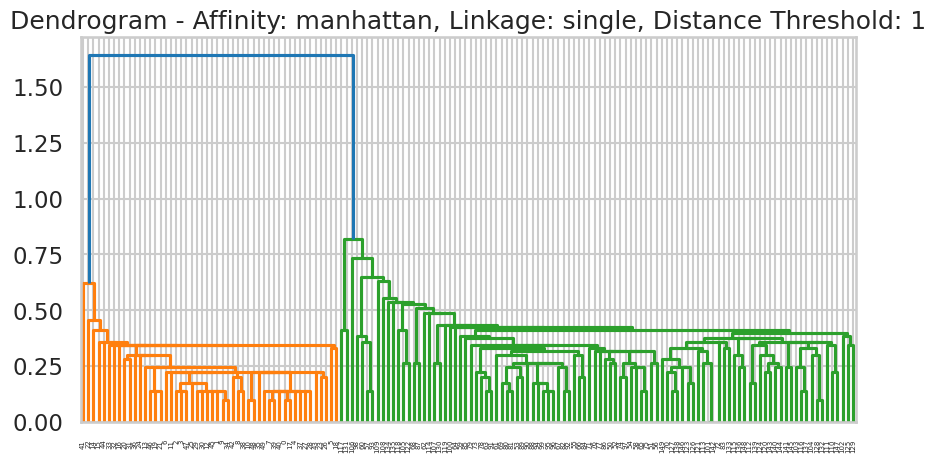

Silhouette score for Affinity: manhattan, Linkage: single, Distance Threshold: 1 is: 0.14738244260973818


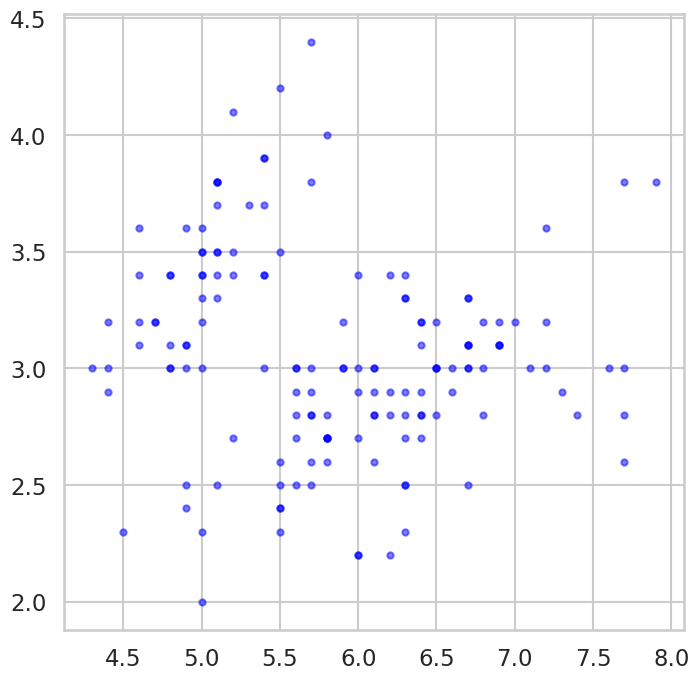

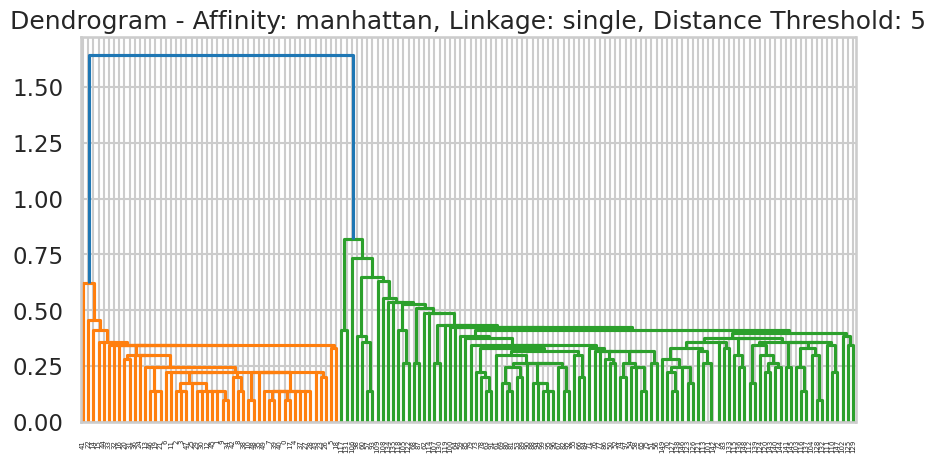

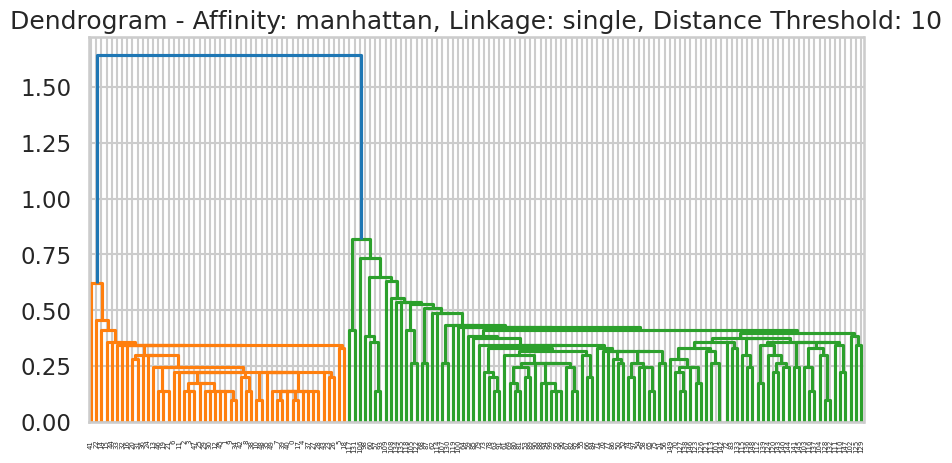

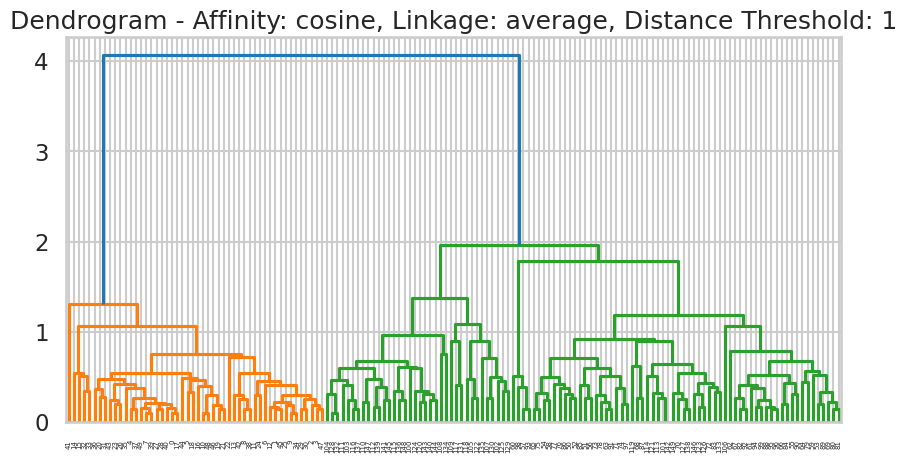

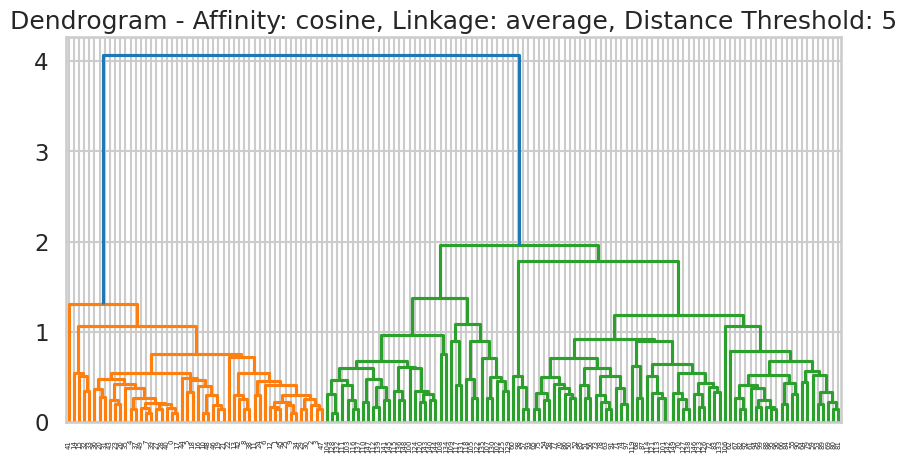

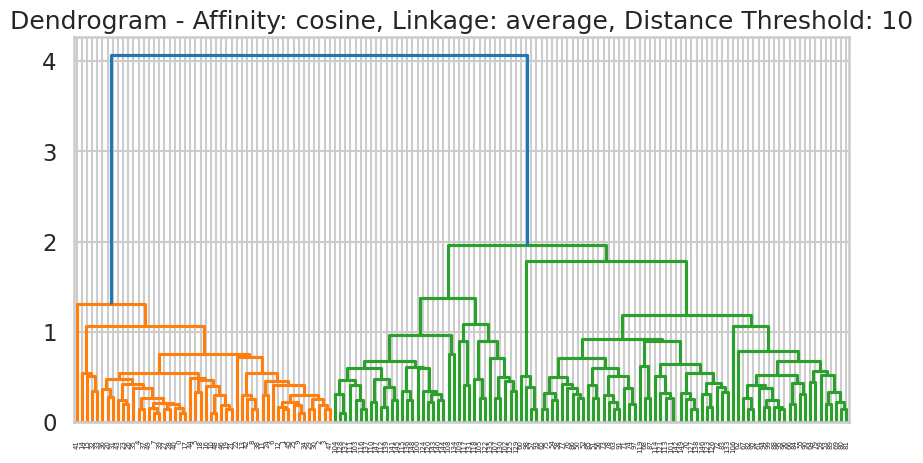

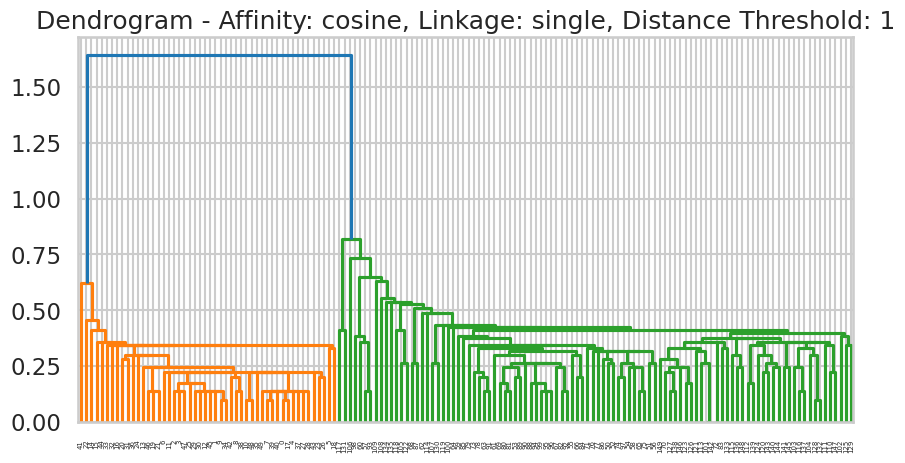

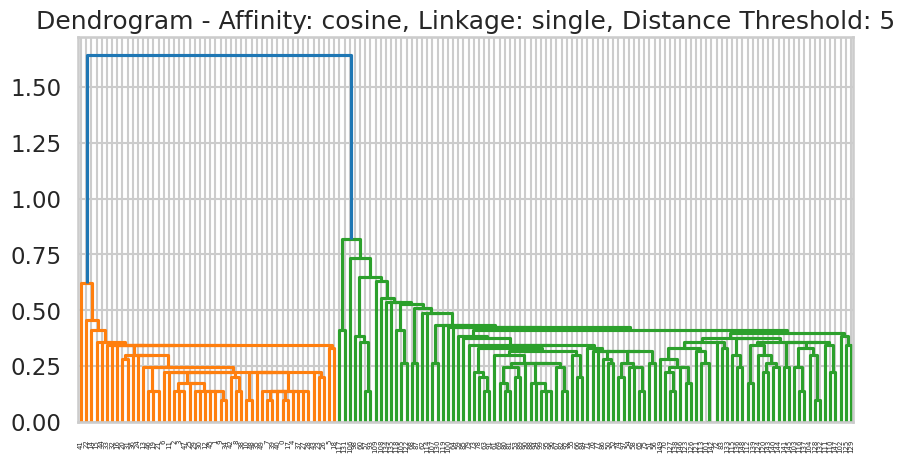

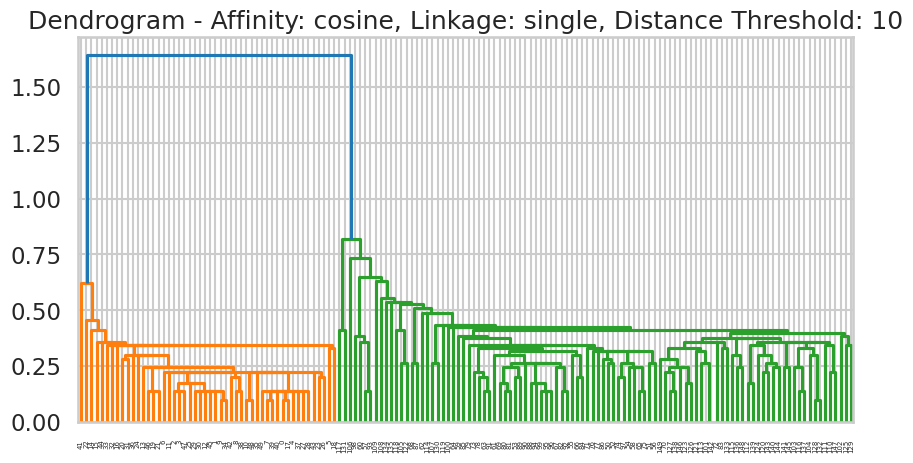


Best Parameters:
{'Affinity': 'euclidean', 'Linkage': 'single', 'Distance_Threshold': 1}
Best Silhouette Score: 0.6867350732769777


In [ ]:
# Parameters to experiment with
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['average', 'single']
distance_thresholds = [1, 5, 10]

best_silhouette_score = float('-inf')
best_params = {}

# Perform Agglomerative Clustering with different parameters
for affinity in affinities:
    for linkage_method in linkages:
        for distance_threshold in distance_thresholds:
            model = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage_method, distance_threshold=distance_threshold)
            labels = model.fit_predict(x)

            # Plot dendrogram
            plt.figure(figsize=(10, 5))
            dendrogram(linkage(x, method = linkage_method))
            plt.title(f'Dendrogram - Affinity: {affinity}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold}')
            plt.show()

            # Calculate silhouette score
            unique_labels = np.unique(labels)
            if len(unique_labels) > 1:
              silhouette_avg = silhouette_score(x, labels)
              print(f"Silhouette score for Affinity: {affinity}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold} is: {silhouette_avg}")

            # Display resulting clusters
              title = f'Agglomerative Clustering - Affinity: {affinity}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold}'
              display_cluster(x, labels)

            # Update best parameters if silhouette score is higher
              if silhouette_avg > best_silhouette_score:
                  best_silhouette_score = silhouette_avg
                  best_params['Affinity'] = affinity
                  best_params['Linkage'] = linkage_method
                  best_params['Distance_Threshold'] = distance_threshold

# Display the best parameters and silhouette score
print("\nBest Parameters:")
print(best_params)
print(f"Best Silhouette Score: {best_silhouette_score}")

#### DBScan:

Silhouette score for EPS: 0.2, Min_samples: 5 is: 0.1825642832387007
Silhouette score for EPS: 0.2, Min_samples: 6 is: 0.1584293948698756
Silhouette score for EPS: 0.2, Min_samples: 7 is: 0.12266342750596138
Silhouette score for EPS: 0.2, Min_samples: 8 is: 0.10857339363040983
Silhouette score for EPS: 0.30000000000000004, Min_samples: 5 is: -0.05206429641095576
Silhouette score for EPS: 0.30000000000000004, Min_samples: 6 is: 0.04061668477577547
Silhouette score for EPS: 0.30000000000000004, Min_samples: 7 is: 0.008293473378023327
Silhouette score for EPS: 0.30000000000000004, Min_samples: 8 is: 0.45482579868215905
Silhouette score for EPS: 0.30000000000000004, Min_samples: 9 is: 0.4396583254525768
Silhouette score for EPS: 0.30000000000000004, Min_samples: 10 is: 0.30775028041821995
Silhouette score for EPS: 0.30000000000000004, Min_samples: 11 is: 0.20333150250366042
Silhouette score for EPS: 0.30000000000000004, Min_samples: 12 is: 0.20333150250366042
Silhouette score for EPS: 0.4,

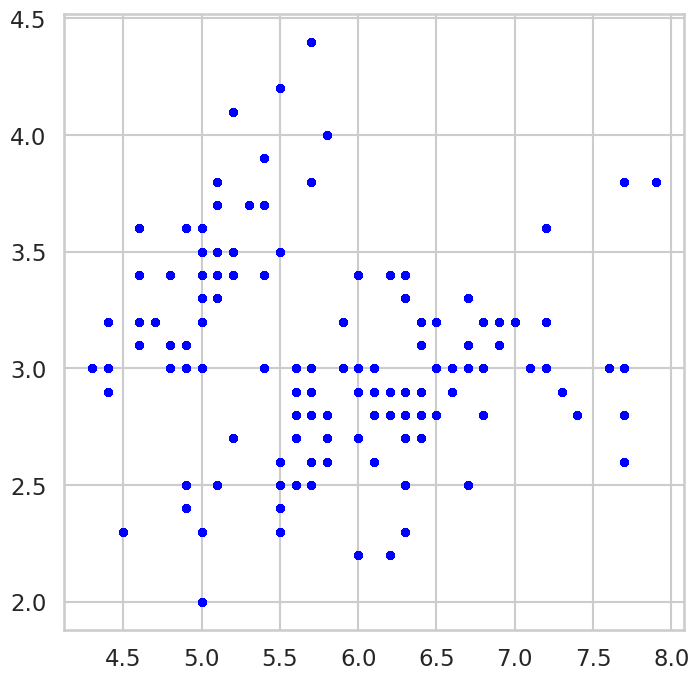

In [ ]:
# Parameters to experiment with
epsilons = np.arange(0.1, 3.1, 0.1)
min_samples_values = range(5, 26)

best_silhouette_score = float('-inf')
best_params = {}

# Perform DBSCAN Clustering with different parameters
for eps in epsilons:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(x)

        # Check if there are at least two unique labels for silhouette score
        unique_labels = np.unique(labels)
        if len(unique_labels) > 1:
            # Calculate silhouette score
            silhouette_avg = silhouette_score(x, labels)
            print(f"Silhouette score for EPS: {eps}, Min_samples: {min_samples} is: {silhouette_avg}")

            # Display resulting clusters
            title = f'DBSCAN Clustering - EPS: {eps}, Min_samples: {min_samples}'
            display_cluster(x, labels)

            # Update best parameters if silhouette score is higher
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_params['EPS'] = eps
                best_params['Min_Samples'] = min_samples

# Display the best parameters and silhouette score
print("\nBest Parameters:")
print(best_params)
print(f"Best Silhouette Score: {best_silhouette_score}")

#### Gaussian Mixture:

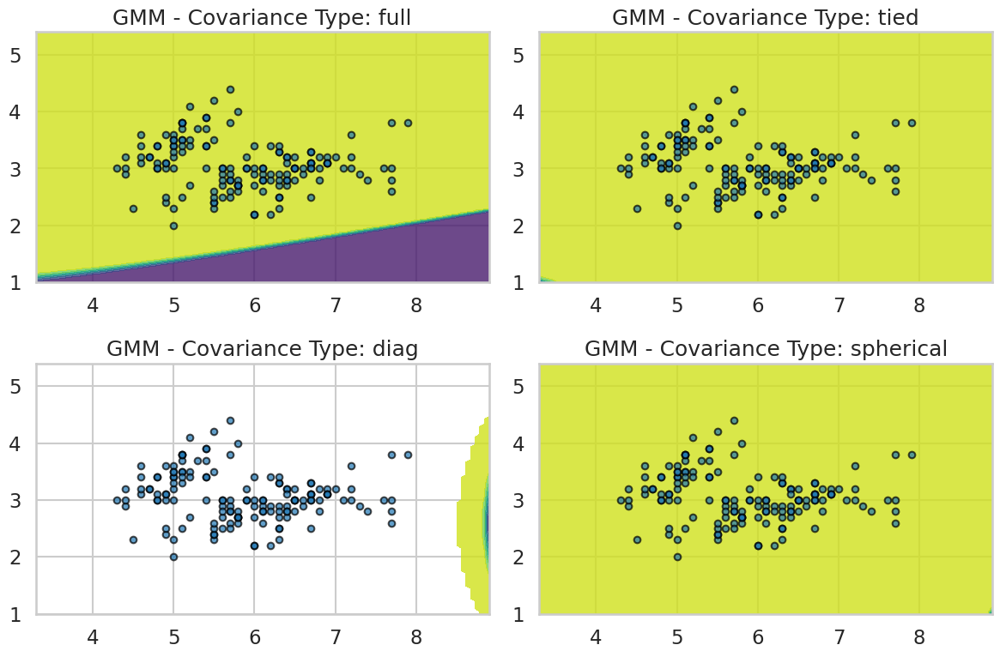

In [23]:
def plot_gmm_probabilities(gmm, X, title, ax):
    # Create a meshgrid for visualization
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

    # Extend the meshgrid for 8 features
    xy = np.column_stack([xx.ravel(), yy.ravel()] + [np.zeros_like(xx.ravel()) for _ in range(X.shape[1] - 2)])

    probabilities = gmm.predict_proba(xy)

    # Reshape the probabilities to match the meshgrid shape
    probabilities = probabilities[:, 1].reshape(xx.shape)

    # Plot the filled contours based on probabilities
    ax.contourf(xx, yy, probabilities, cmap='viridis', alpha=0.8)

    # Scatter plot of the input data points
    ax.scatter(X[:, 0], X[:, 1], s=30, edgecolor='k', alpha=0.7)

    ax.set_title(title)

# Perform Gaussian Mixture Modeling with different covariance_types
plt.figure(figsize=(12, 8))

for i, cov_type in enumerate(covariance_types, 1):
    # Fit Gaussian Mixture Model
    gmm = GaussianMixture(n_components=4, covariance_type=cov_type, random_state=42)
    gmm.fit(x)

    # Visualize the probability fits
    ax = plt.subplot(2, 2, i)
    plot_gmm_probabilities(gmm, x, f'GMM - Covariance Type: {cov_type}', ax)

plt.tight_layout()
plt.show()



### Normalize:

In [24]:
scaler = StandardScaler()
x_normalized = scaler.fit_transform(x)

#### Kmeans:

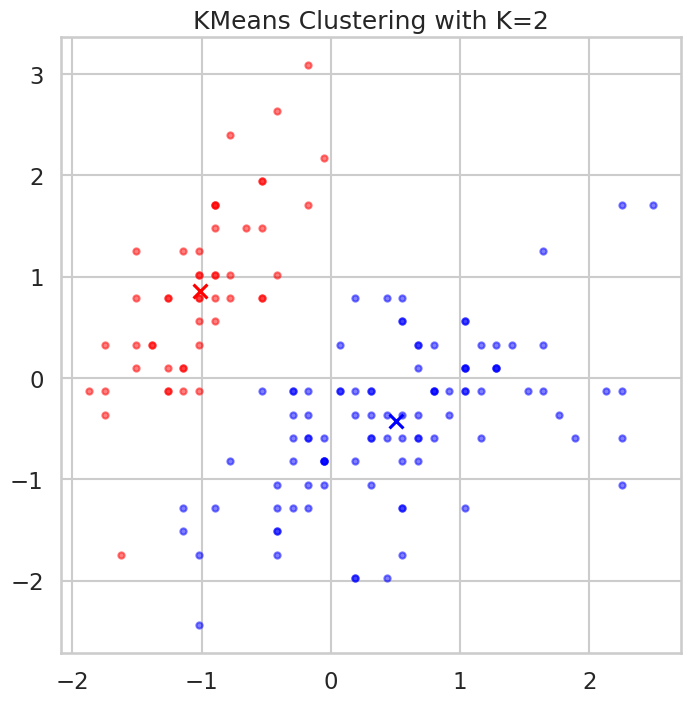

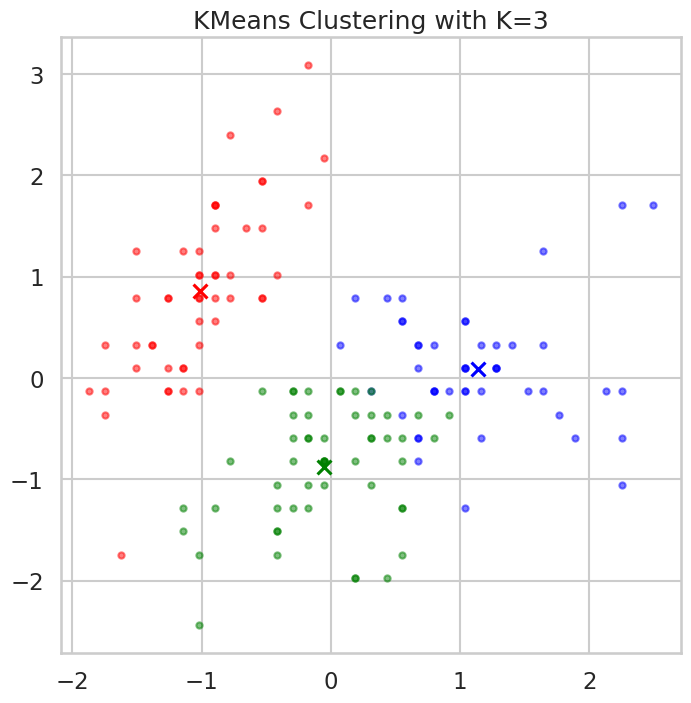

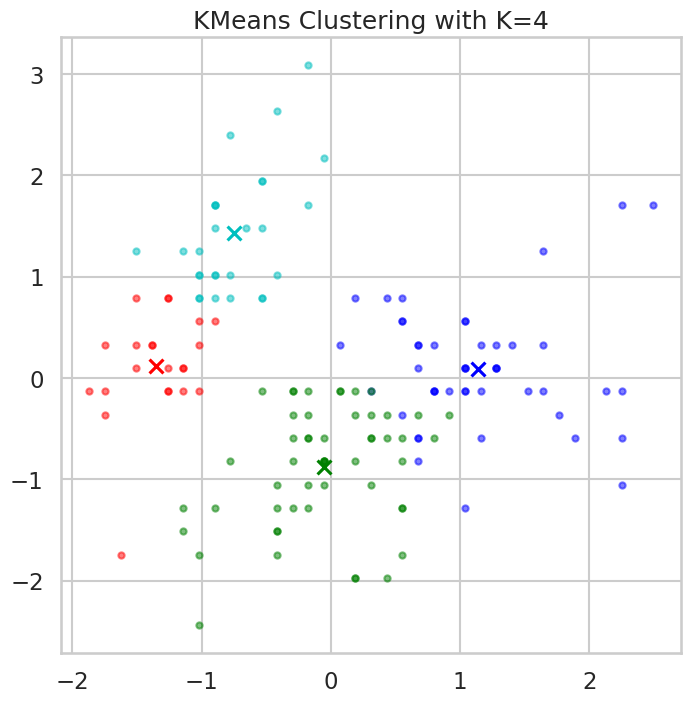

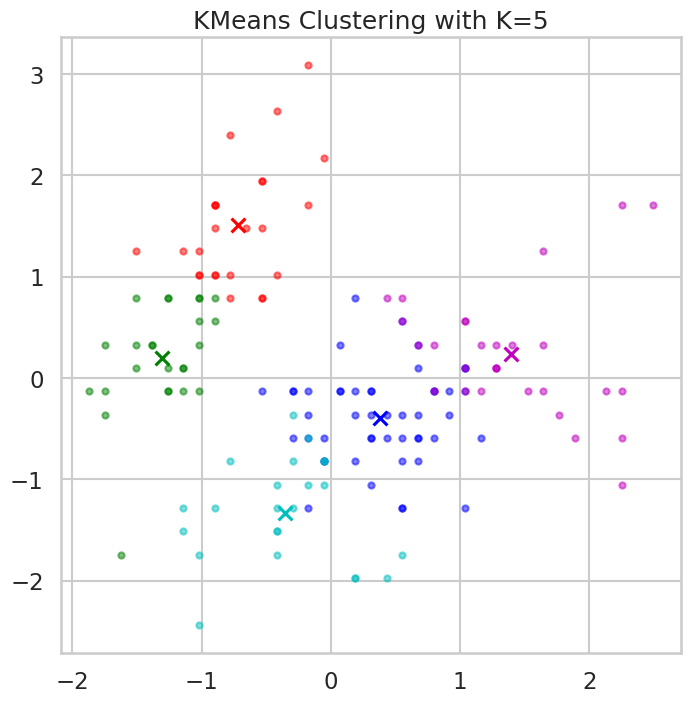

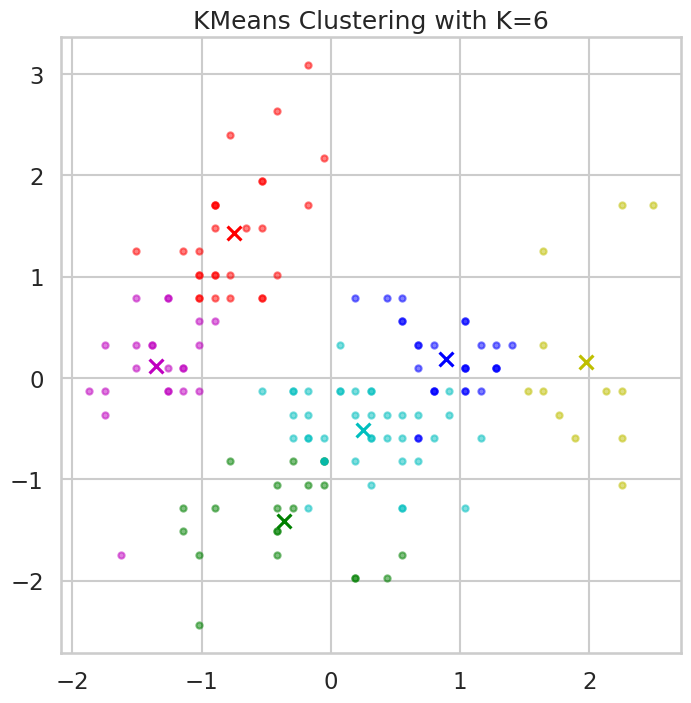

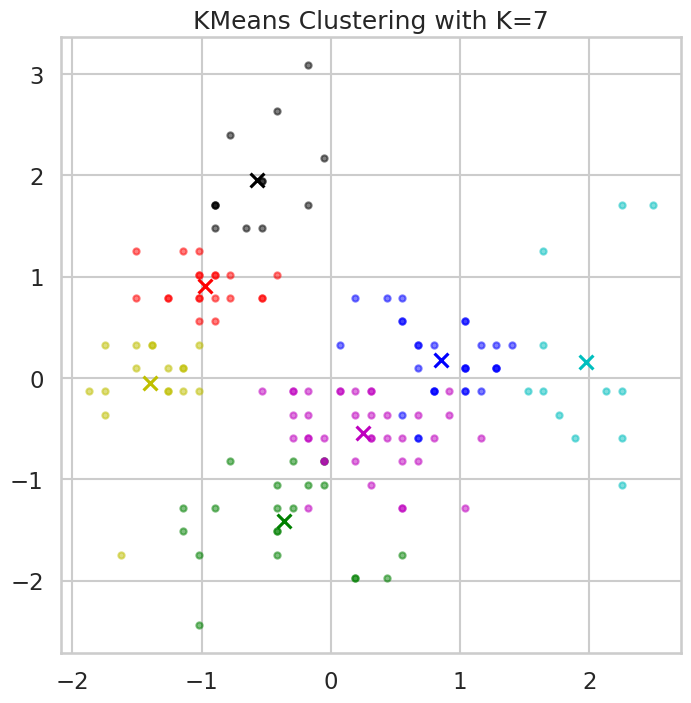

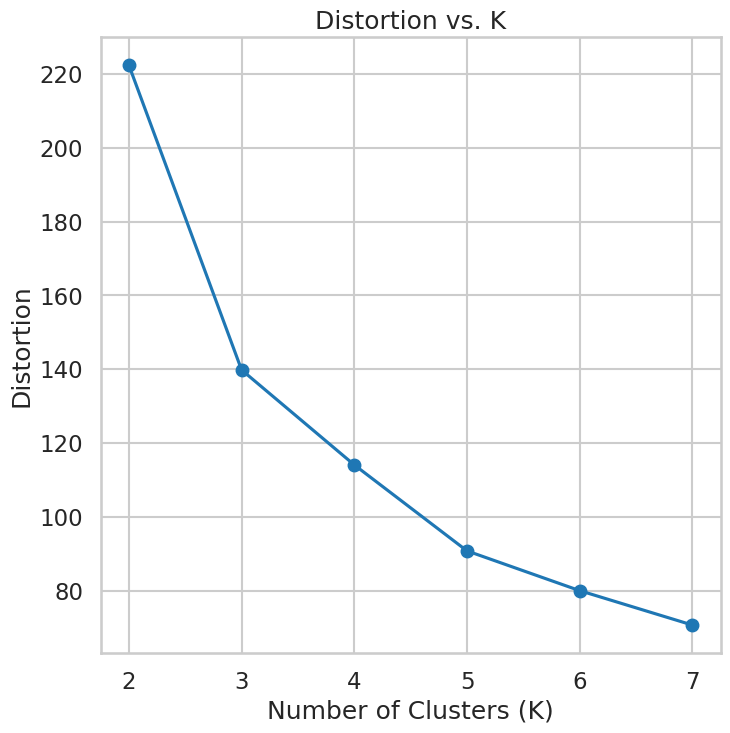

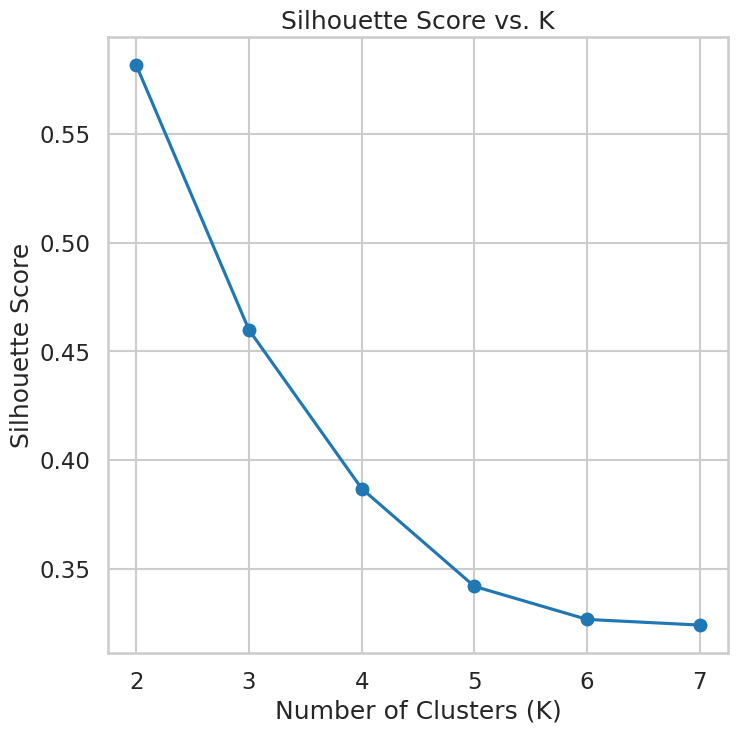

The best K based on silhouette score is: 2
Silhouette score for the best K: 0.5817500491982808


In [ ]:
# Applying KMeans with different values of K
k_values = range(2, 8)
distortions = []
silhouette_scores = []


for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(x_normalized)

    # Display clusters for each K
    plt.figure()
    display_cluster(x_normalized, km=kmeans, num_clusters=k)
    plt.title(f"KMeans Clustering with K={k}")
    plt.show()

    # Compute distortion (inertia) for each K
    distortions.append(kmeans.inertia_)

    # Compute silhouette score for each K
    silhouette_avg = silhouette_score(x_normalized, kmeans.labels_)
    silhouette_scores.append(silhouette_avg)

# Plot the distortion function versus K
plt.figure()
plt.plot(k_values, distortions, marker='o')
plt.title('Distortion vs. K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.show()

# Plot the silhouette_score versus K
plt.figure()
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score vs. K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.show()

# Choose the best K based on silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
print(f"The best K based on silhouette score is: {best_k}")

# Store the silhouette_score for the best K for later comparison
best_k_silhouette_score = max(silhouette_scores)
print(f"Silhouette score for the best K: {best_k_silhouette_score}")

#### Hierarchial Clustering:

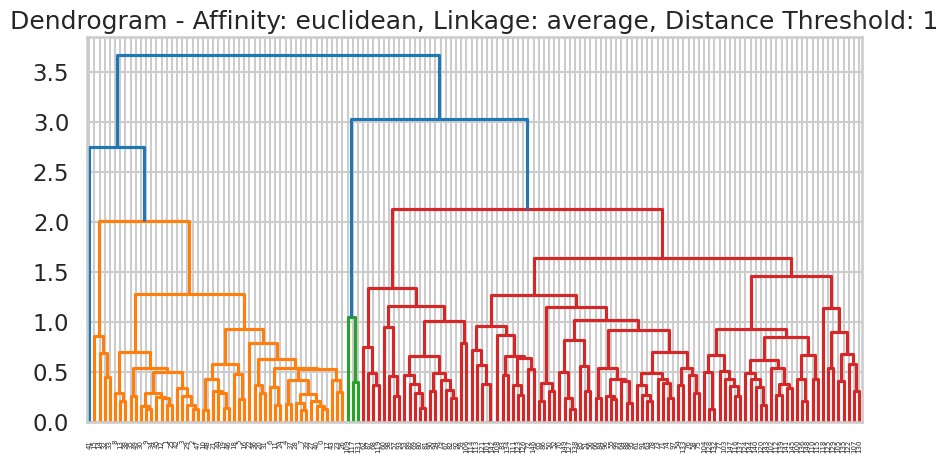

Silhouette score for Affinity: euclidean, Linkage: average, Distance Threshold: 1 is: 0.30087506250740886


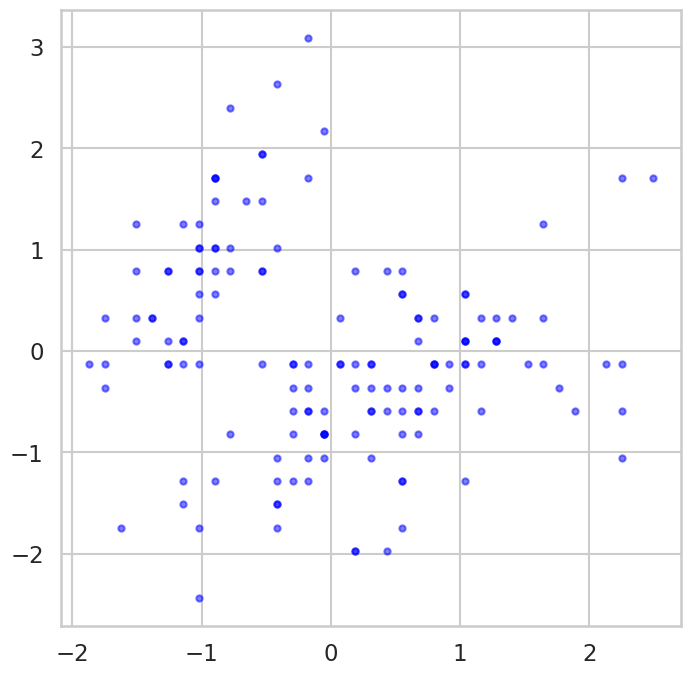

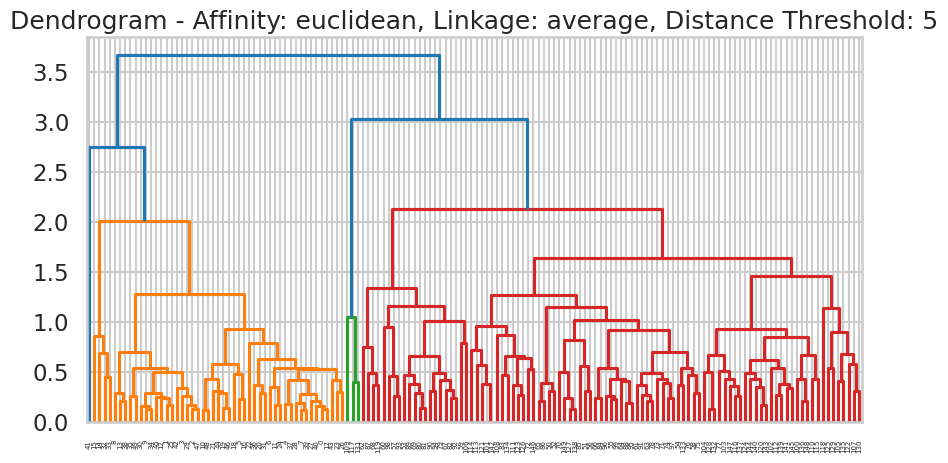

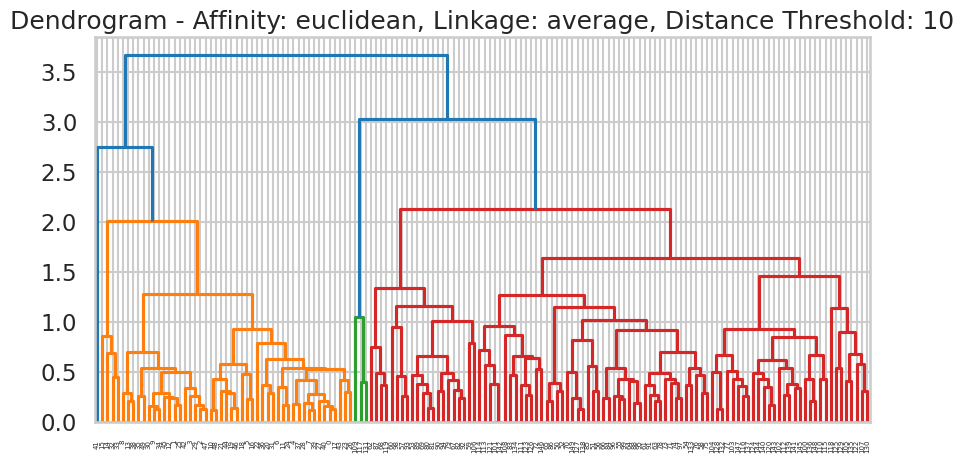

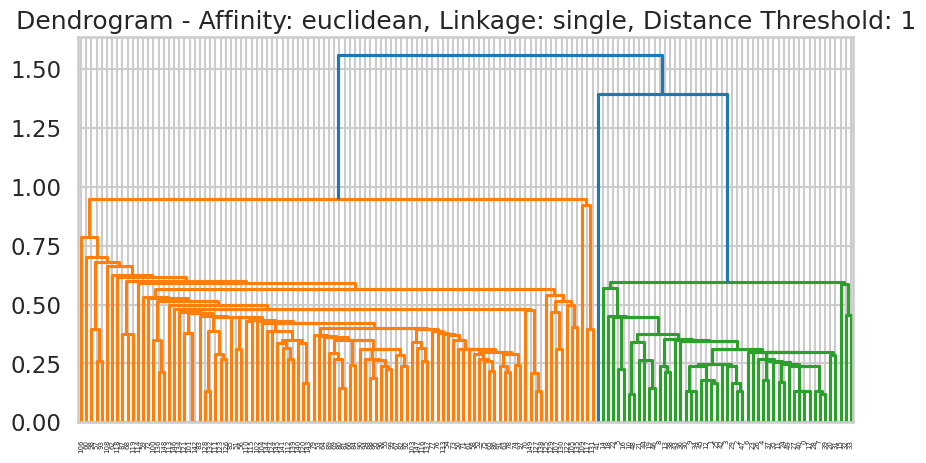

Silhouette score for Affinity: euclidean, Linkage: single, Distance Threshold: 1 is: 0.504645610832545


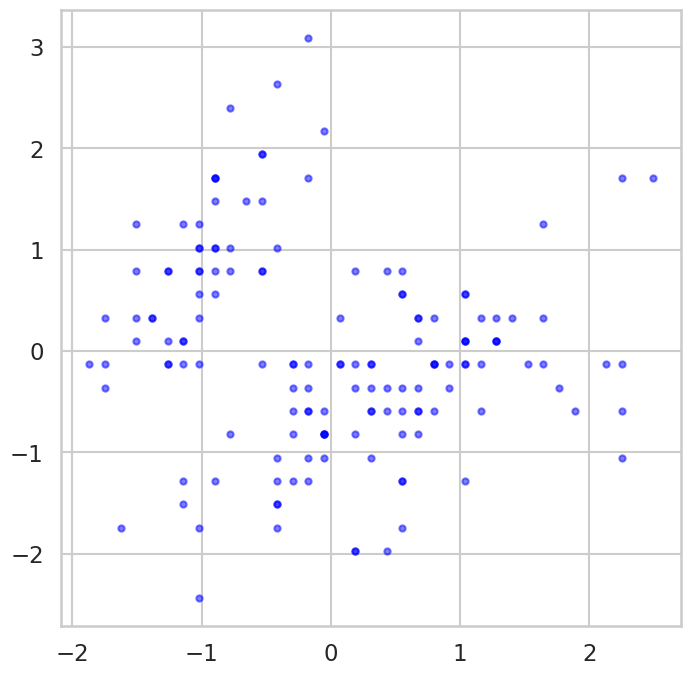

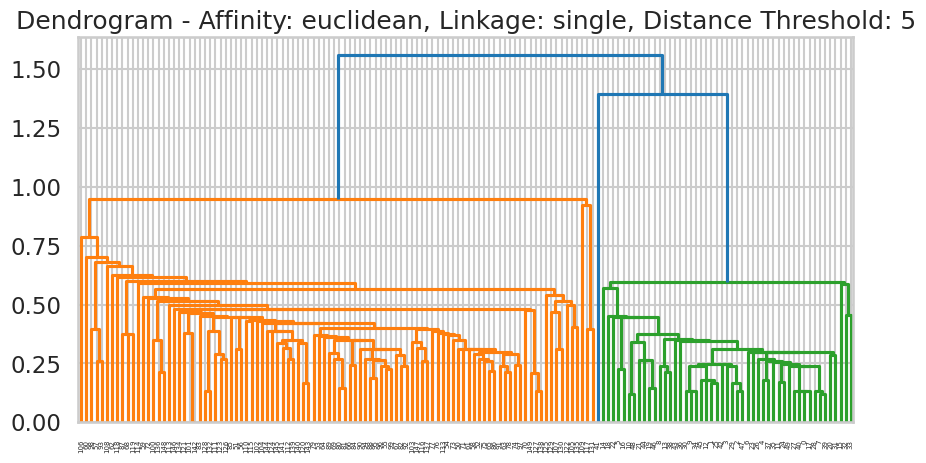

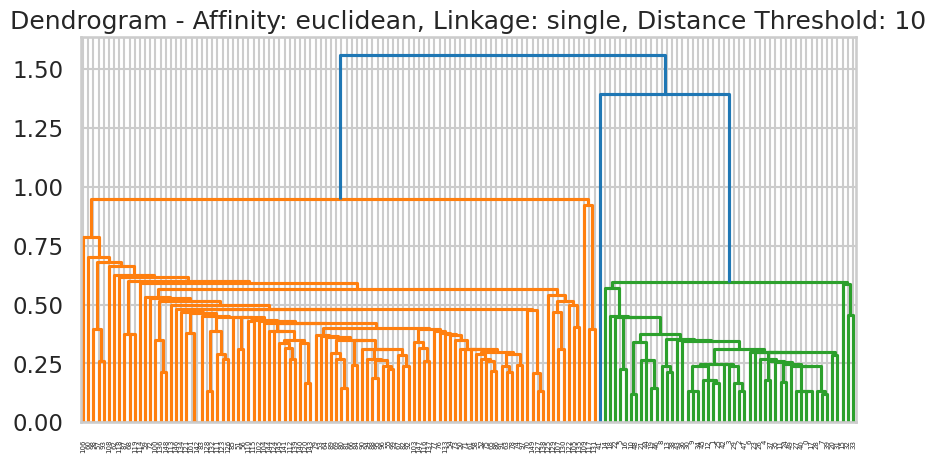

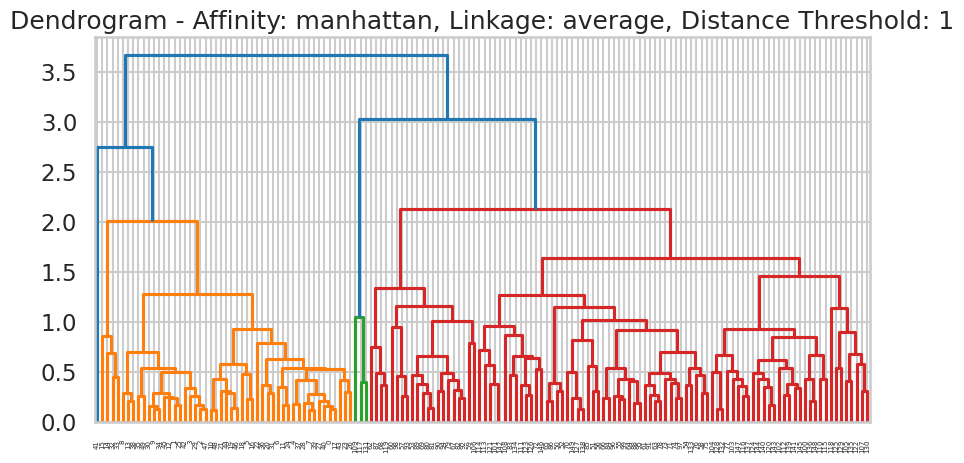

Silhouette score for Affinity: manhattan, Linkage: average, Distance Threshold: 1 is: 0.2732481526741257


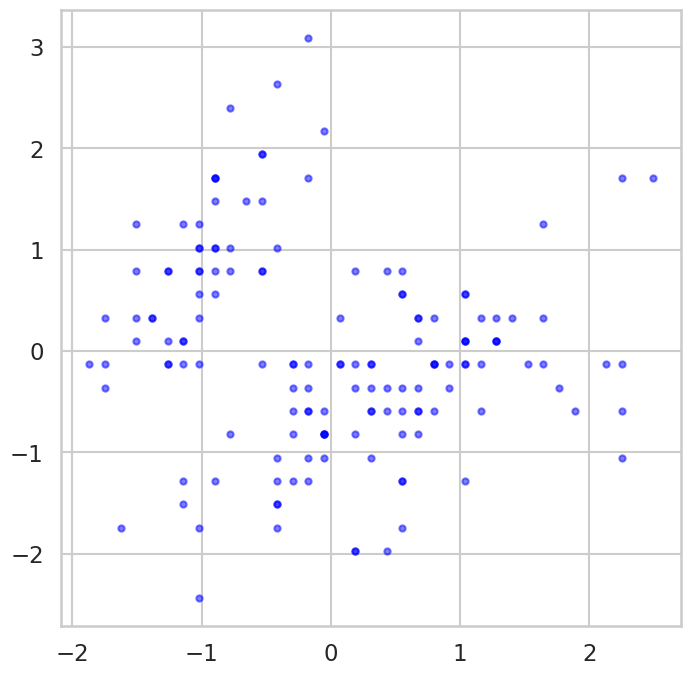

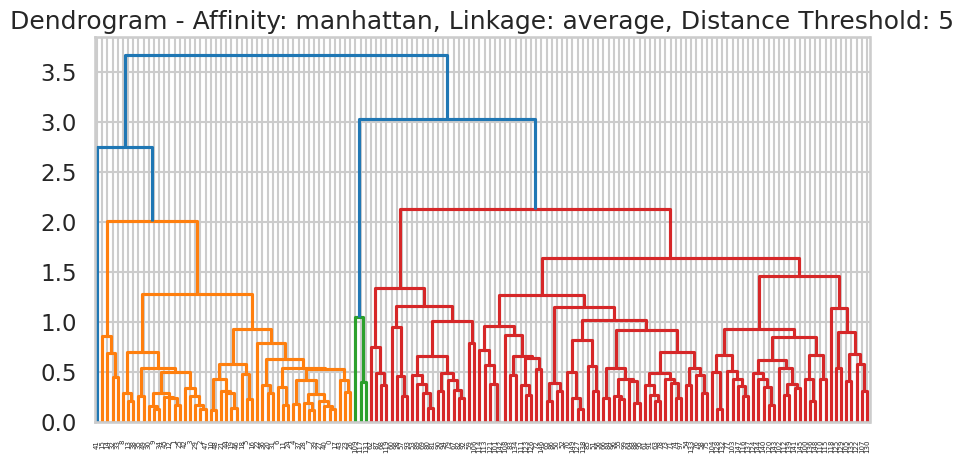

Silhouette score for Affinity: manhattan, Linkage: average, Distance Threshold: 5 is: 0.5817500491982808


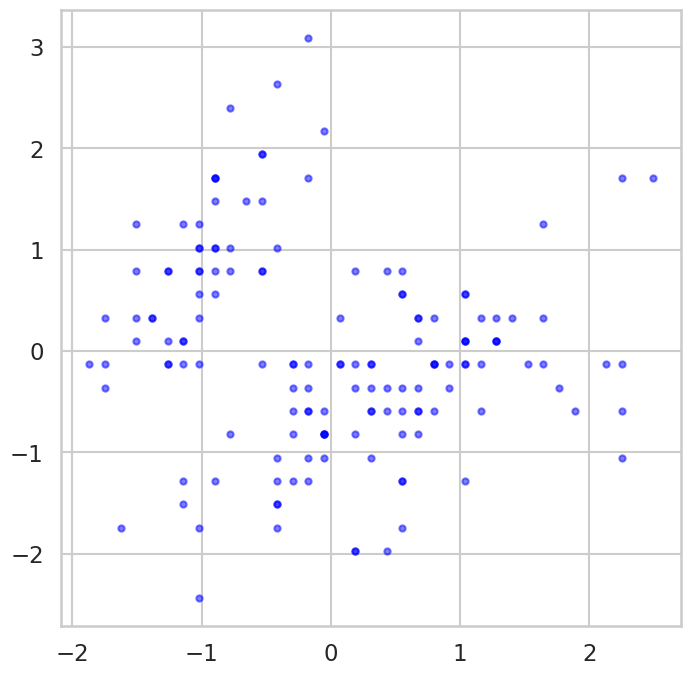

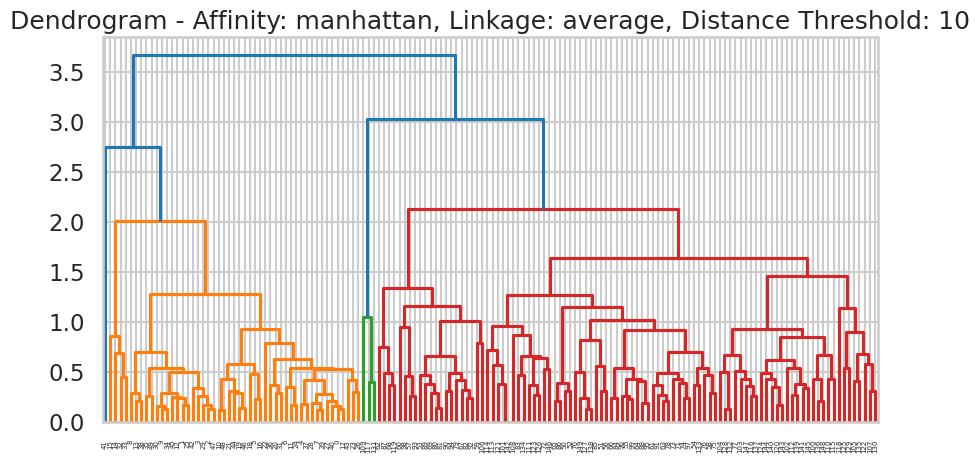

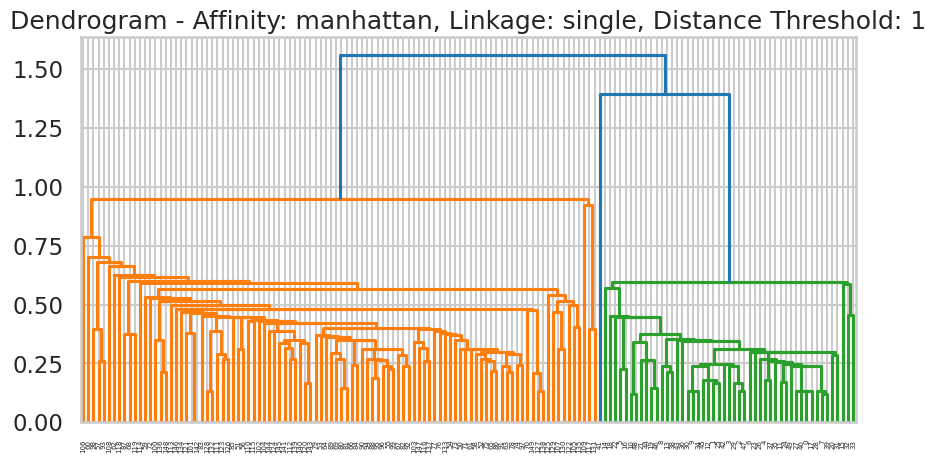

Silhouette score for Affinity: manhattan, Linkage: single, Distance Threshold: 1 is: 0.05331724159191082


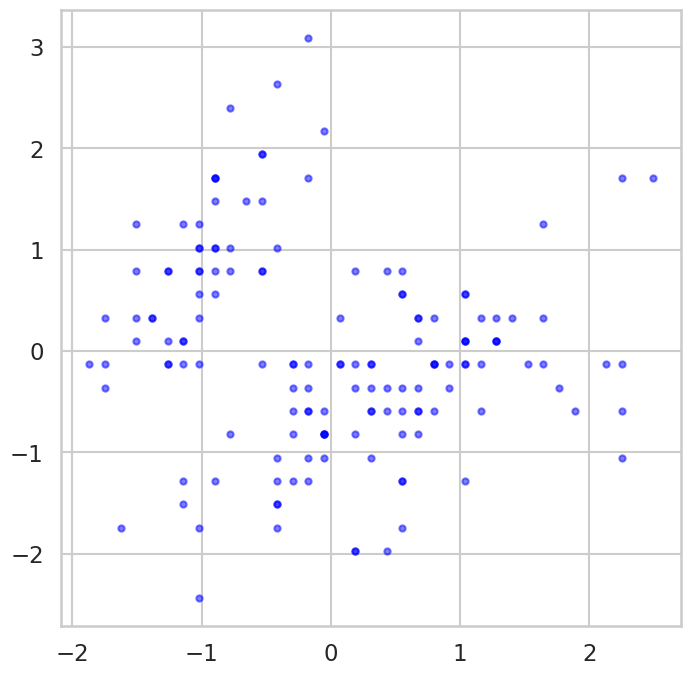

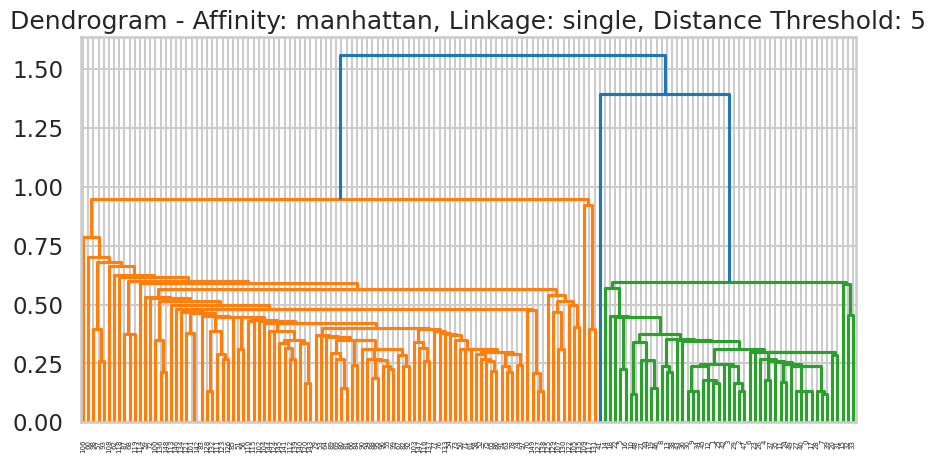

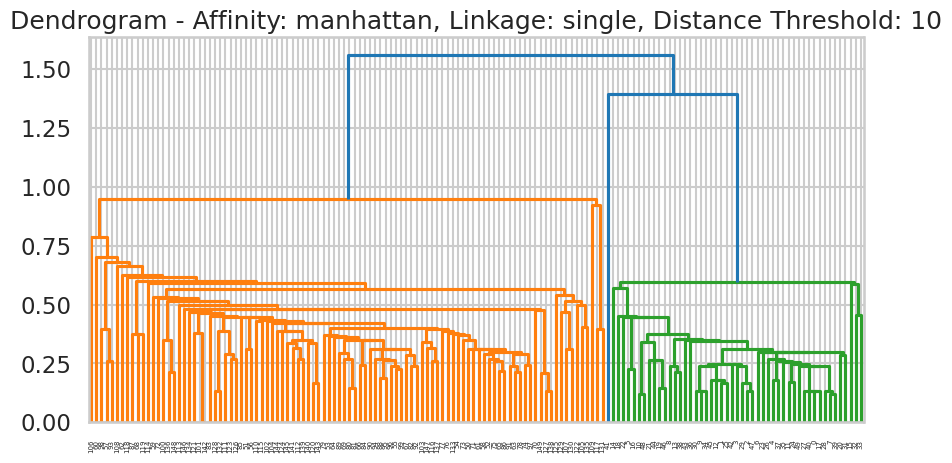

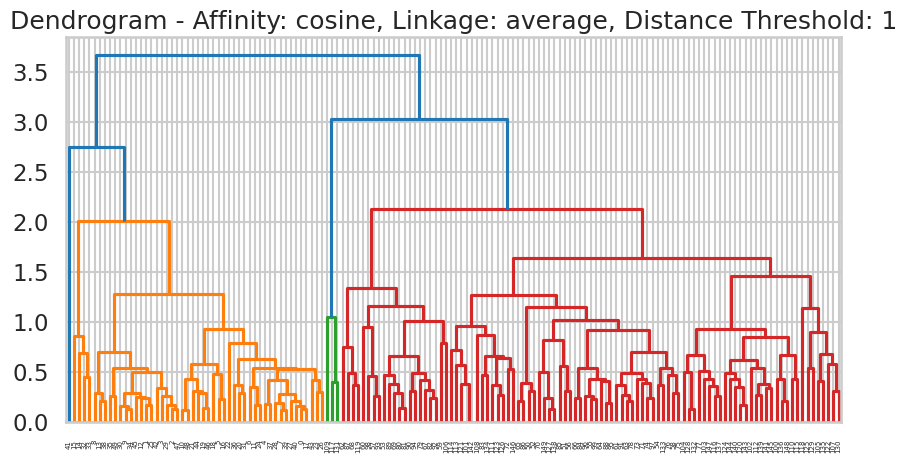

Silhouette score for Affinity: cosine, Linkage: average, Distance Threshold: 1 is: 0.5770346019475988


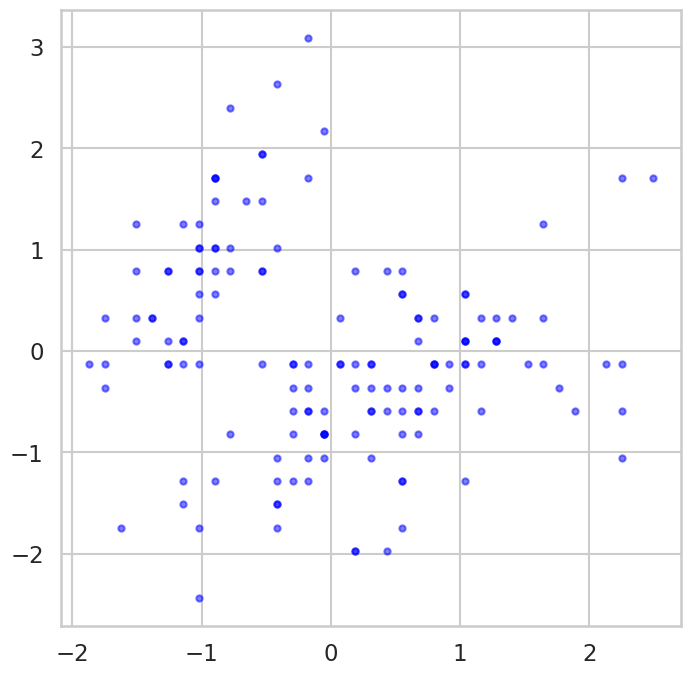

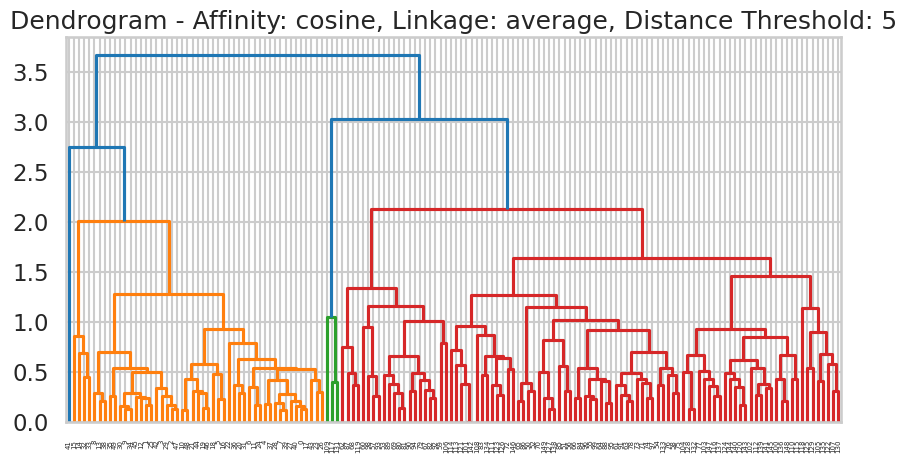

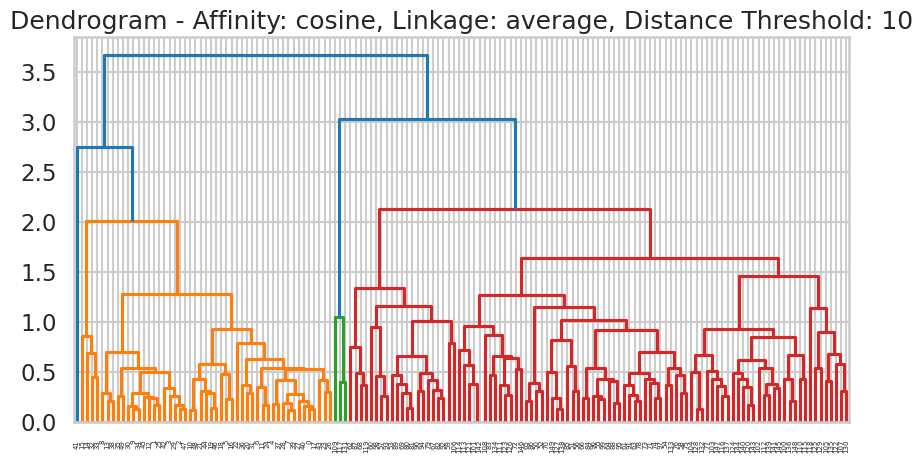

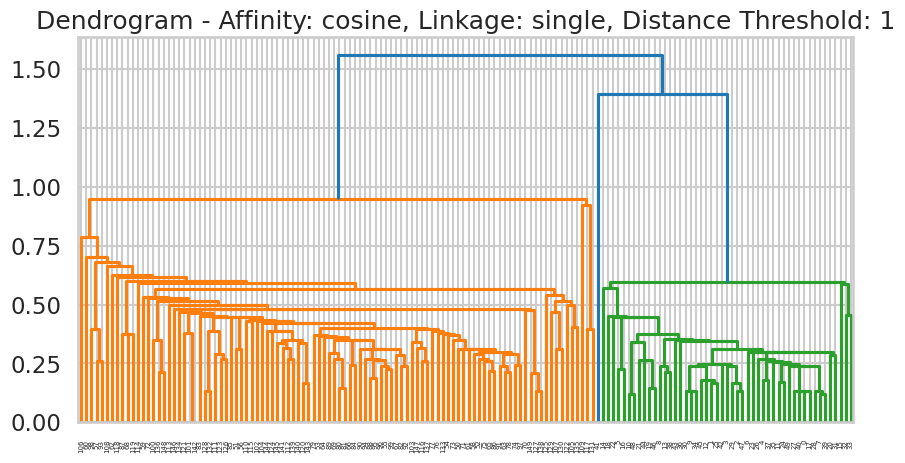

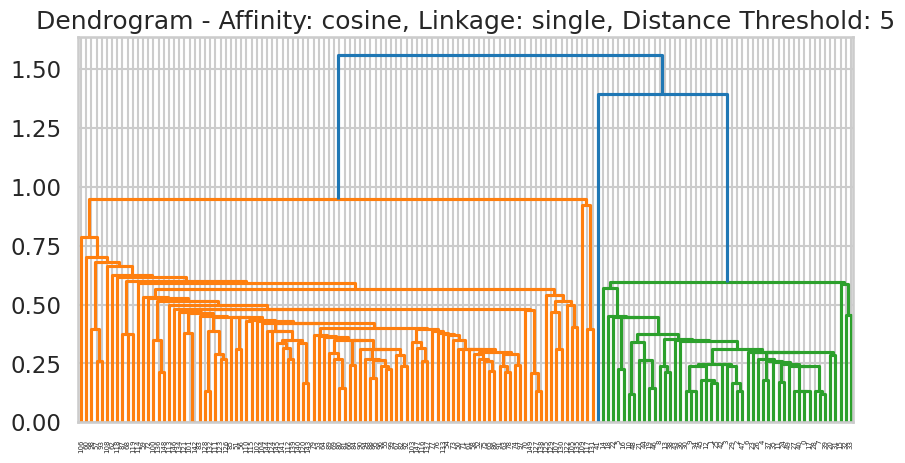

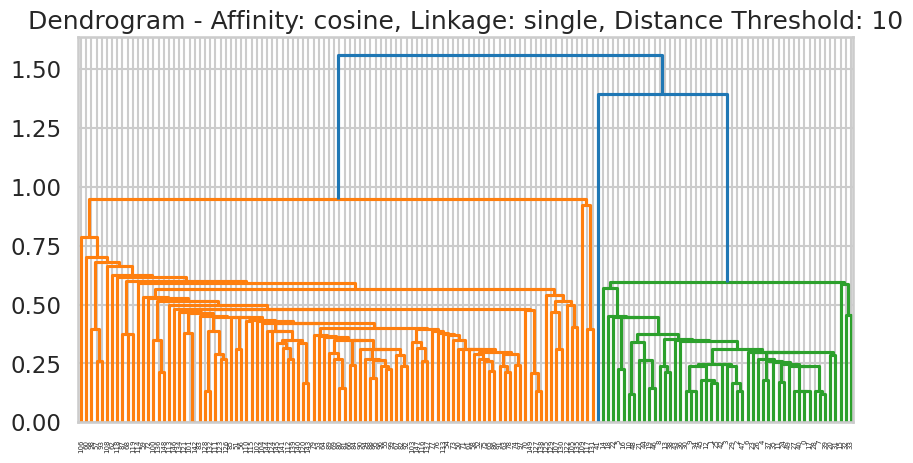


Best Parameters:
{'Affinity': 'manhattan', 'Linkage': 'average', 'Distance_Threshold': 5}
Best Silhouette Score: 0.5817500491982808


In [ ]:
# Parameters to experiment with
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['average', 'single']
distance_thresholds = [1, 5, 10]

best_silhouette_score = float('-inf')
best_params = {}

# Perform Agglomerative Clustering with different parameters
for affinity in affinities:
    for linkage_method in linkages:
        for distance_threshold in distance_thresholds:
            model = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage_method, distance_threshold=distance_threshold)
            labels = model.fit_predict(x_normalized)

            # Plot dendrogram
            plt.figure(figsize=(10, 5))
            dendrogram(linkage(x_normalized, method = linkage_method))
            plt.title(f'Dendrogram - Affinity: {affinity}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold}')
            plt.show()

            # Calculate silhouette score
            unique_labels = np.unique(labels)
            if len(unique_labels) > 1:
              silhouette_avg = silhouette_score(x_normalized, labels)
              print(f"Silhouette score for Affinity: {affinity}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold} is: {silhouette_avg}")

            # Display resulting clusters
              title = f'Agglomerative Clustering - Affinity: {affinity}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold}'
              display_cluster(x_normalized, labels)

            # Update best parameters if silhouette score is higher
              if silhouette_avg > best_silhouette_score:
                  best_silhouette_score = silhouette_avg
                  best_params['Affinity'] = affinity
                  best_params['Linkage'] = linkage_method
                  best_params['Distance_Threshold'] = distance_threshold

# Display the best parameters and silhouette score
print("\nBest Parameters:")
print(best_params)
print(f"Best Silhouette Score: {best_silhouette_score}")

#### DBSCAN

Silhouette score for EPS: 0.30000000000000004, Min_samples: 5 is: -0.1941947686285083
Silhouette score for EPS: 0.30000000000000004, Min_samples: 6 is: 0.17509759538454042
Silhouette score for EPS: 0.30000000000000004, Min_samples: 7 is: 0.17509759538454042
Silhouette score for EPS: 0.30000000000000004, Min_samples: 8 is: 0.1565818060701212
Silhouette score for EPS: 0.30000000000000004, Min_samples: 9 is: 0.09847051223250837
Silhouette score for EPS: 0.4, Min_samples: 5 is: 0.027670001694674724
Silhouette score for EPS: 0.4, Min_samples: 6 is: -0.06622381407091892
Silhouette score for EPS: 0.4, Min_samples: 7 is: -0.15164465716460526
Silhouette score for EPS: 0.4, Min_samples: 8 is: 0.2967063489775823
Silhouette score for EPS: 0.4, Min_samples: 9 is: 0.28823574994029677
Silhouette score for EPS: 0.4, Min_samples: 10 is: 0.28823574994029677
Silhouette score for EPS: 0.4, Min_samples: 11 is: 0.2780838470700254
Silhouette score for EPS: 0.4, Min_samples: 12 is: 0.12894948212986881
Silhoue

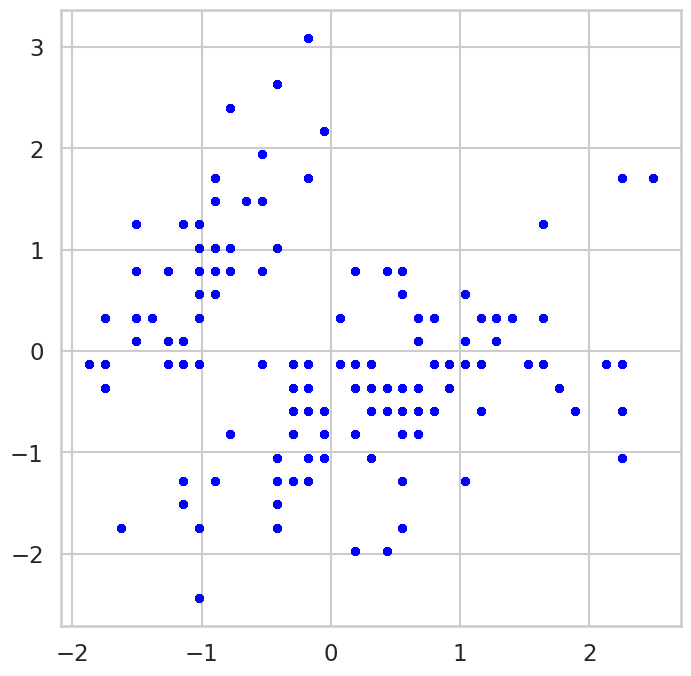

In [ ]:
# Parameters to experiment with
epsilons = np.arange(0.1, 3.1, 0.1)
min_samples_values = range(5, 26)

best_silhouette_score = float('-inf')
best_params = {}

# Perform DBSCAN Clustering with different parameters
for eps in epsilons:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(x_normalized)

        # Check if there are at least two unique labels for silhouette score
        unique_labels = np.unique(labels)
        if len(unique_labels) > 1:
            # Calculate silhouette score
            silhouette_avg = silhouette_score(x_normalized, labels)
            print(f"Silhouette score for EPS: {eps}, Min_samples: {min_samples} is: {silhouette_avg}")

            # Display resulting clusters
            title = f'DBSCAN Clustering - EPS: {eps}, Min_samples: {min_samples}'
            display_cluster(x_normalized, labels)

            # Update best parameters if silhouette score is higher
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_params['EPS'] = eps
                best_params['Min_Samples'] = min_samples

# Display the best parameters and silhouette score
print("\nBest Parameters:")
print(best_params)
print(f"Best Silhouette Score: {best_silhouette_score}")

#### Gaussian Mixture

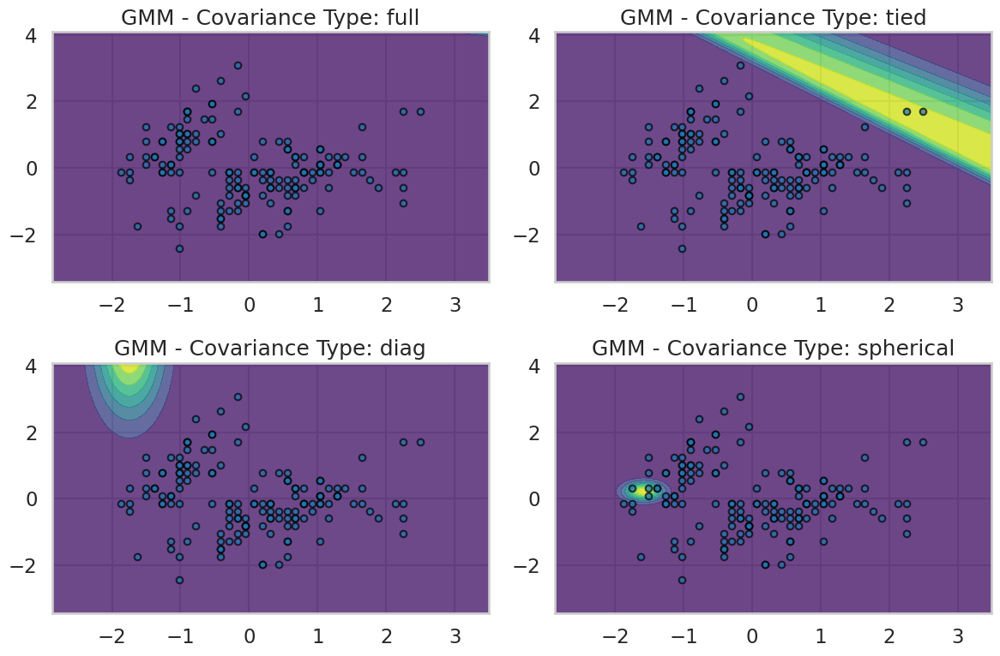

In [25]:
def plot_gmm_probabilities(gmm, X, title, ax):
    # Create a meshgrid for visualization
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

    # Extend the meshgrid for 8 features
    xy = np.column_stack([xx.ravel(), yy.ravel()] + [np.zeros_like(xx.ravel()) for _ in range(X.shape[1] - 2)])

    probabilities = gmm.predict_proba(xy)

    # Reshape the probabilities to match the meshgrid shape
    probabilities = probabilities[:, 1].reshape(xx.shape)

    # Plot the filled contours based on probabilities
    ax.contourf(xx, yy, probabilities, cmap='viridis', alpha=0.8)

    # Scatter plot of the input data points
    ax.scatter(X[:, 0], X[:, 1], s=30, edgecolor='k', alpha=0.7)

    ax.set_title(title)

# Perform Gaussian Mixture Modeling with different covariance_types
plt.figure(figsize=(12, 8))

for i, cov_type in enumerate(covariance_types, 1):
    # Fit Gaussian Mixture Model
    gmm = GaussianMixture(n_components=4, covariance_type=cov_type, random_state=42)
    gmm.fit(x_normalized)

    # Visualize the probability fits
    ax = plt.subplot(2, 2, i)
    plot_gmm_probabilities(gmm, x_normalized, f'GMM - Covariance Type: {cov_type}', ax)

plt.tight_layout()
plt.show()

## Customer dataset
Repeat all the above on the customer data set

In [ ]:
from google.colab import files

uploaded = files.upload()


Saving Customer data.csv to Customer data.csv


In [9]:
customerdata = 'Customer data.csv'
df = pd.read_csv(customerdata)
features = df.columns
customer_data = df[features].values

### Original Data

#### Kmeans:

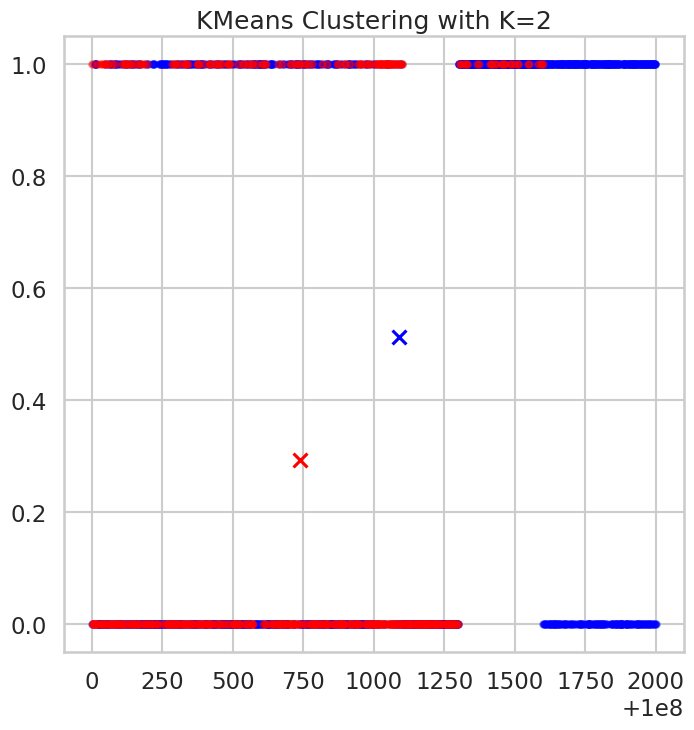

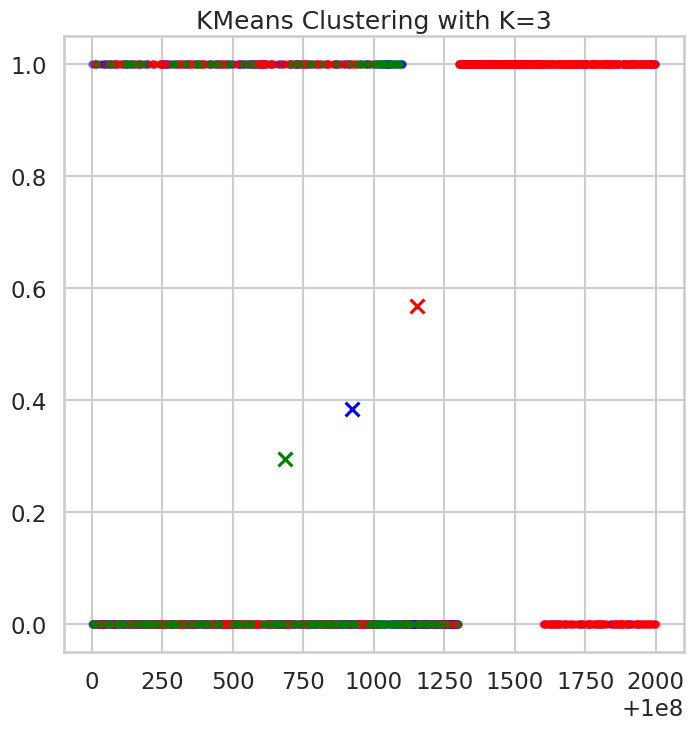

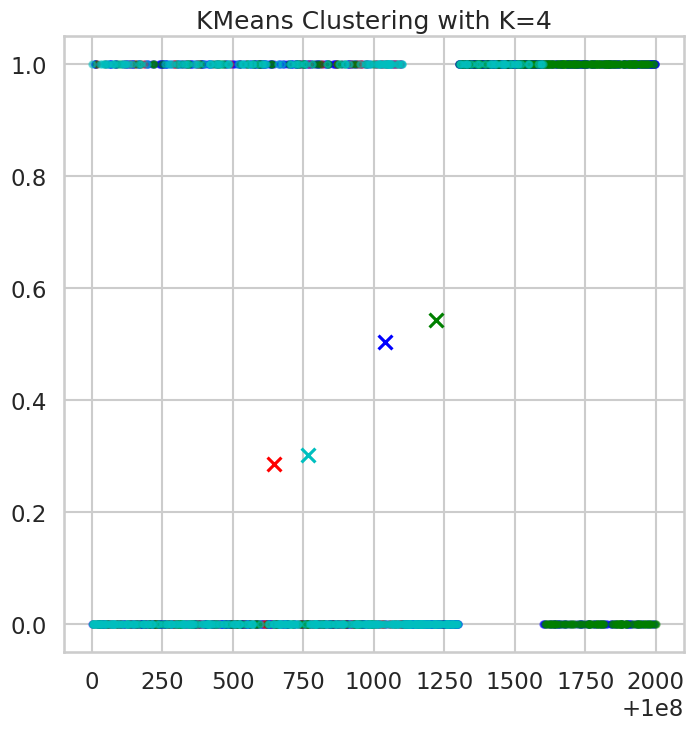

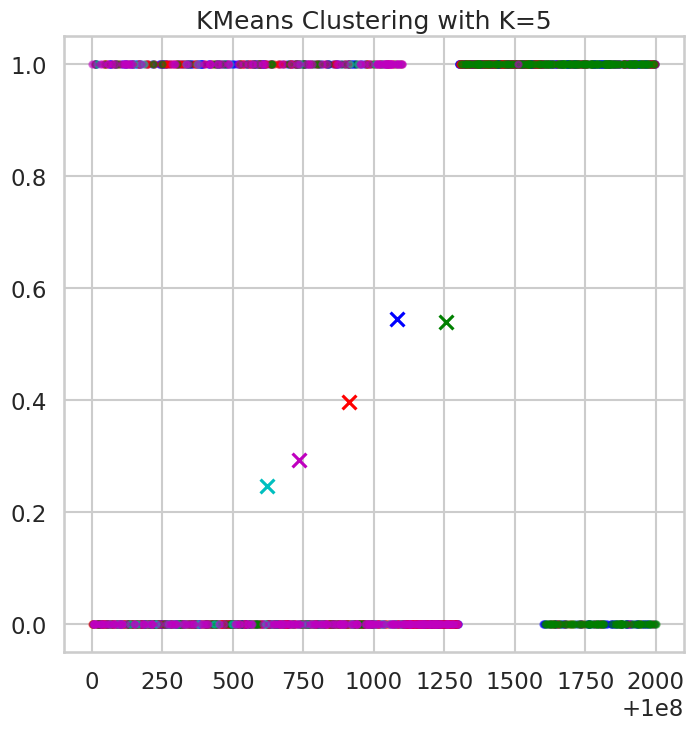

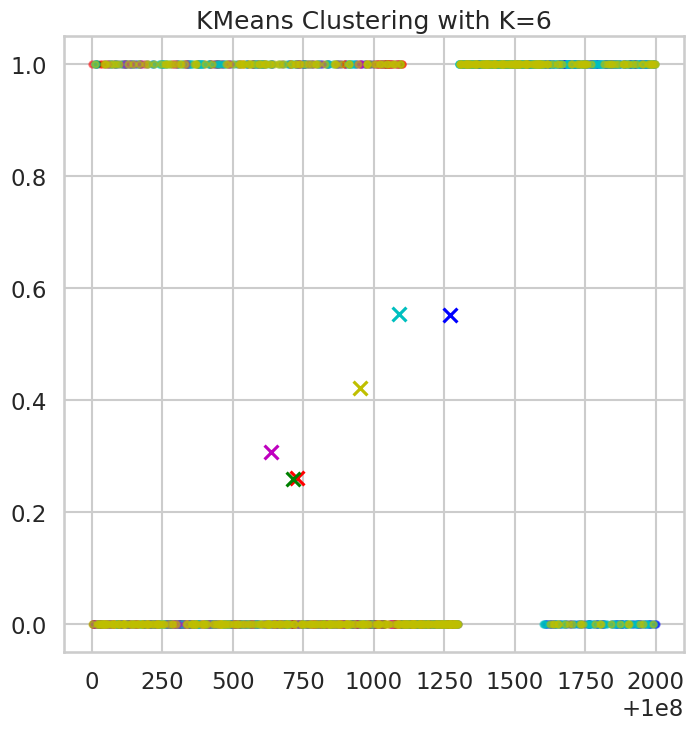

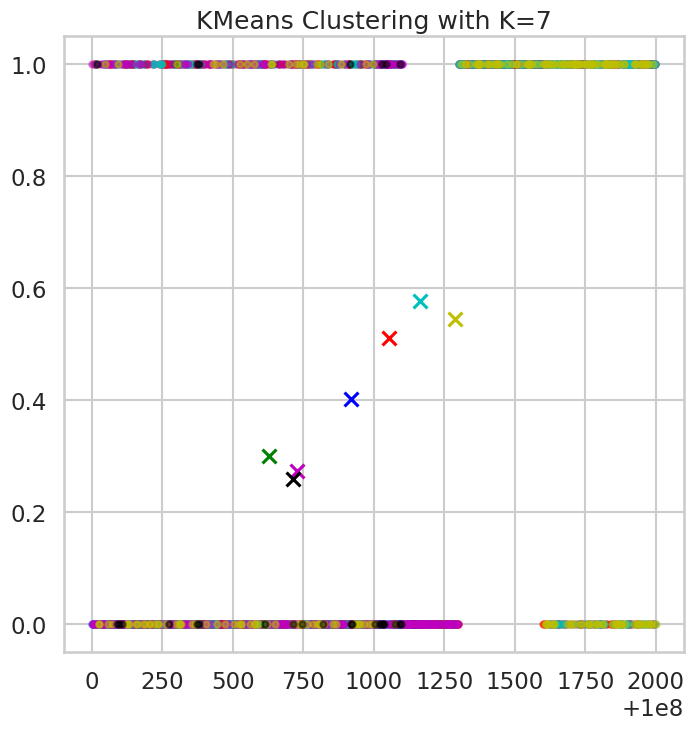

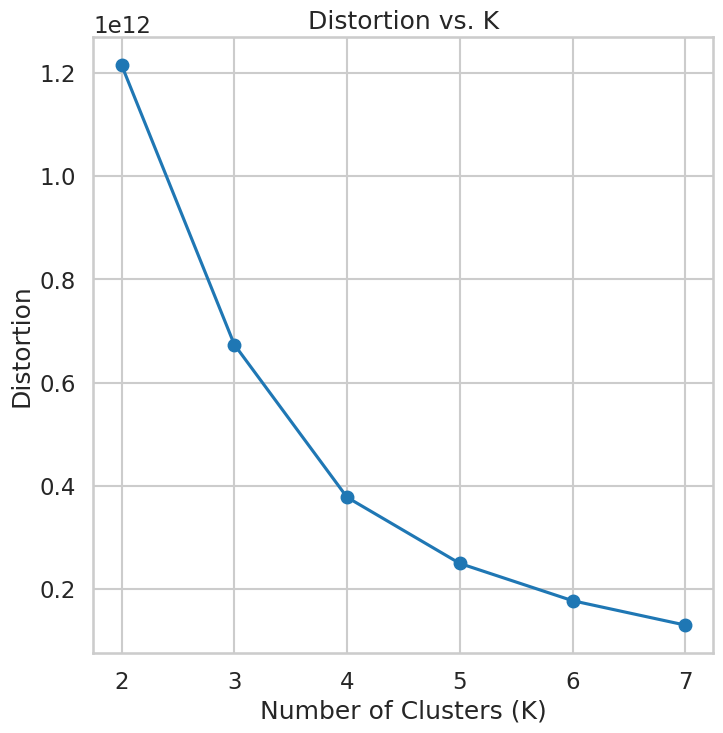

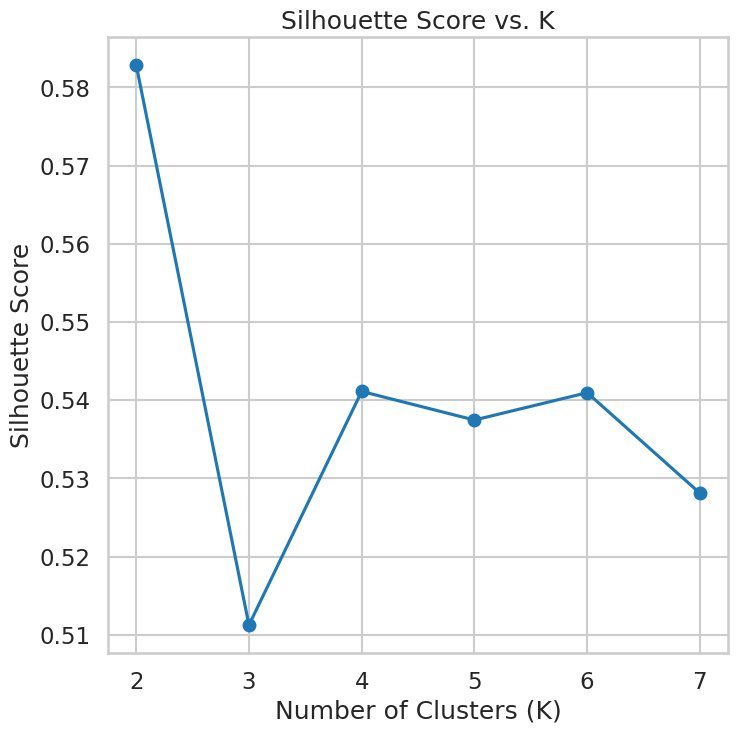

The best K based on silhouette score is: 2
Silhouette score for the best K: 0.5828454744042129


In [ ]:
# Applying KMeans with different values of K
k_values = range(2, 8)
distortions = []
silhouette_scores = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(customer_data)

    # Display clusters for each K
    plt.figure()
    display_cluster(customer_data, km=kmeans, num_clusters=k)
    plt.title(f"KMeans Clustering with K={k}")
    plt.show()

    # Compute distortion (inertia) for each K
    distortions.append(kmeans.inertia_)

    # Compute silhouette score for each K
    silhouette_avg = silhouette_score(customer_data, kmeans.labels_)
    silhouette_scores.append(silhouette_avg)

# Plot the distortion function versus K
plt.figure()
plt.plot(k_values, distortions, marker='o')
plt.title('Distortion vs. K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.show()

# Plot the silhouette_score versus K
plt.figure()
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score vs. K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.show()

# Choose the best K based on silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
print(f"The best K based on silhouette score is: {best_k}")

# Store the silhouette_score for the best K for later comparison
best_k_silhouette_score = max(silhouette_scores)
print(f"Silhouette score for the best K: {best_k_silhouette_score}")

#### Hierarchial Clustering

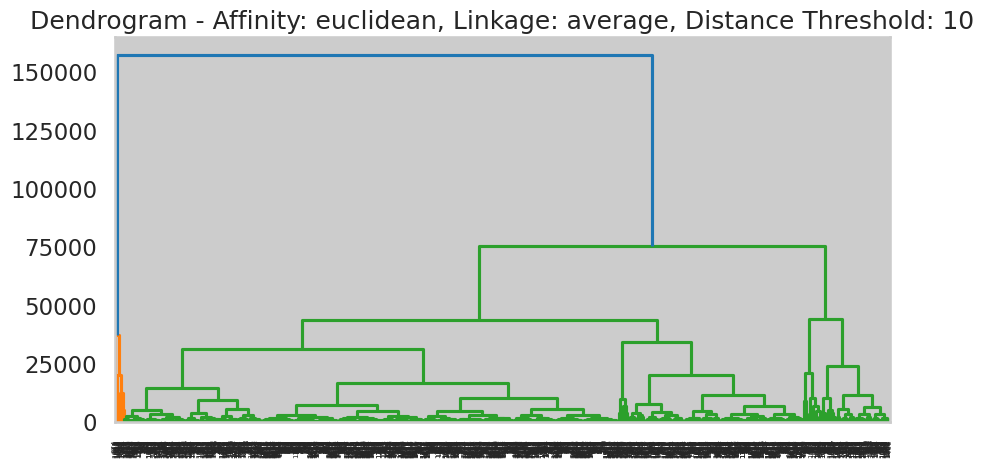

Silhouette score for Affinity: euclidean, Linkage: average, Distance Threshold: 10 is: 0.0009526513211850085


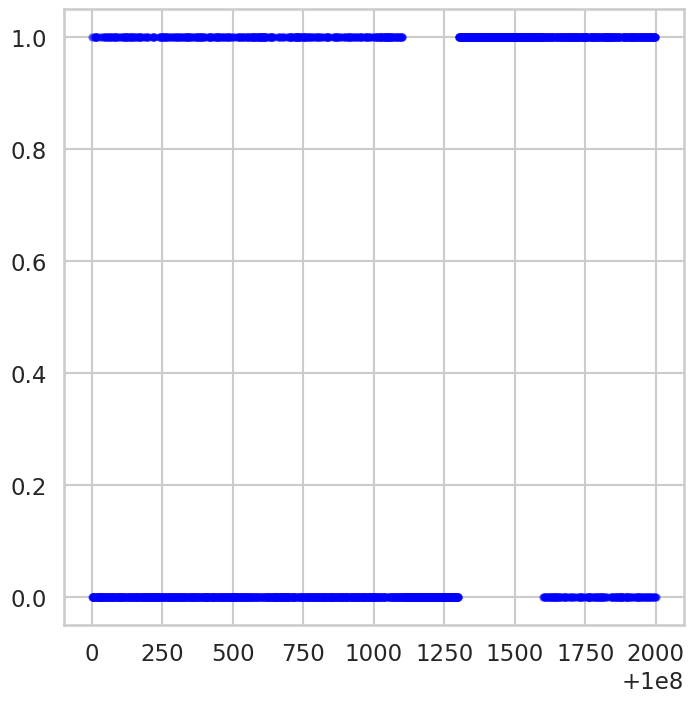

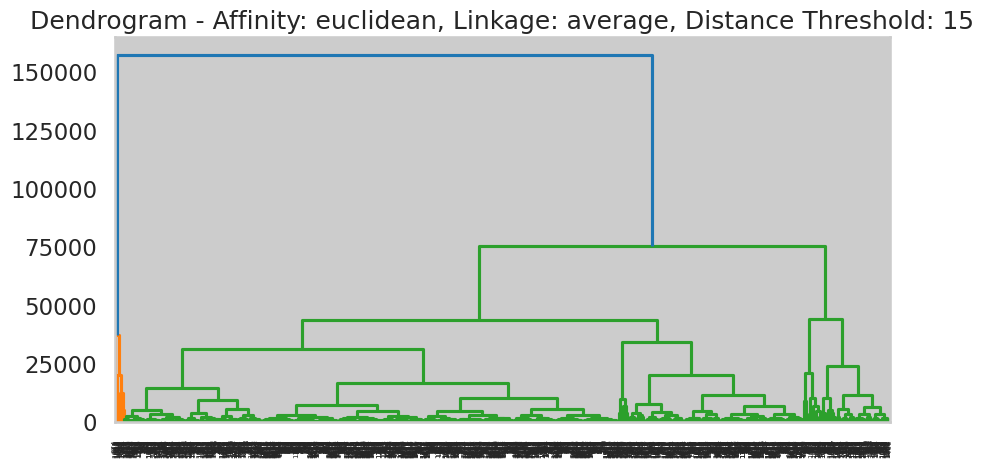

Silhouette score for Affinity: euclidean, Linkage: average, Distance Threshold: 15 is: 0.0018693953211000864


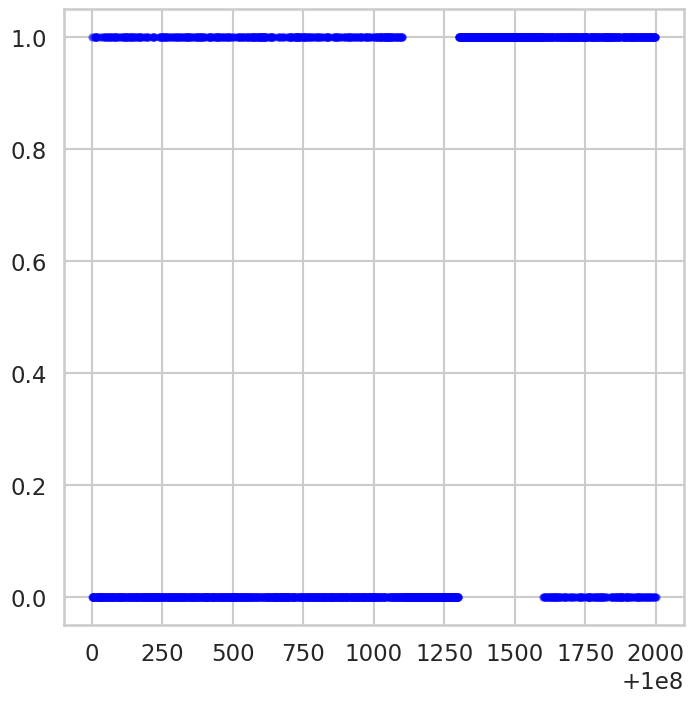

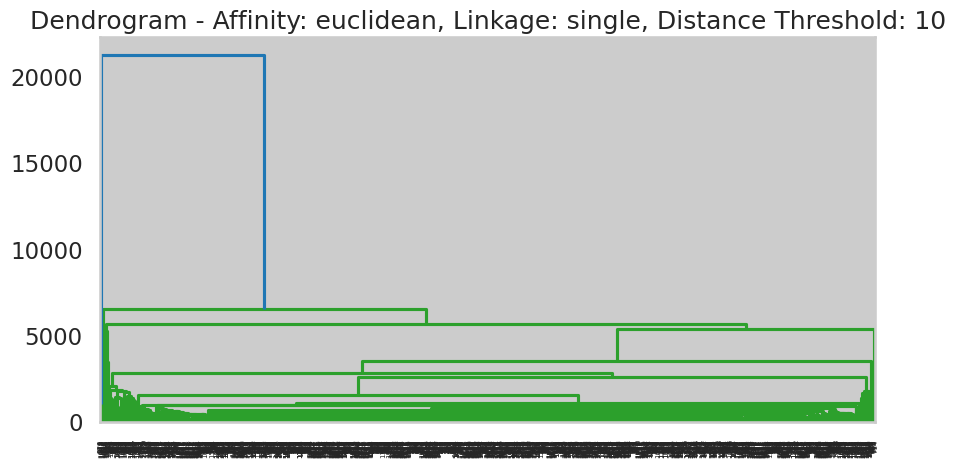

Silhouette score for Affinity: euclidean, Linkage: single, Distance Threshold: 10 is: 0.0009526513211850085


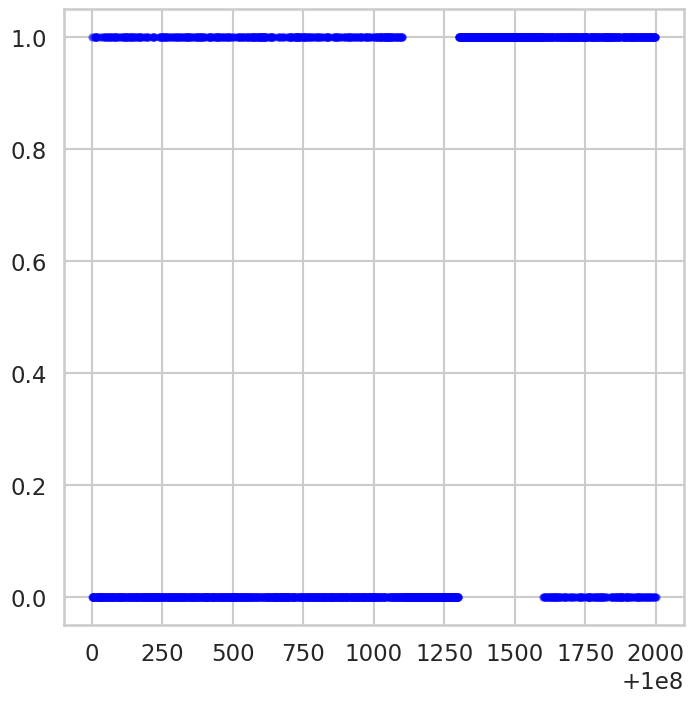

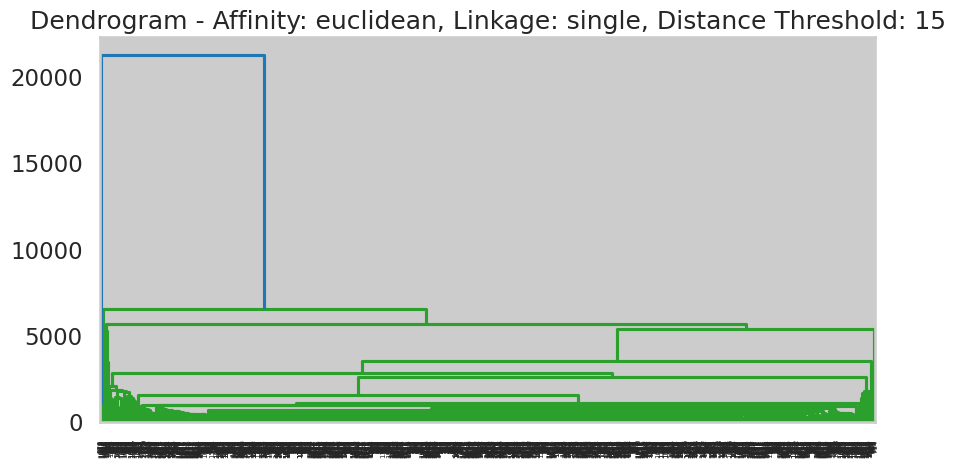

Silhouette score for Affinity: euclidean, Linkage: single, Distance Threshold: 15 is: 0.0018693953211000864


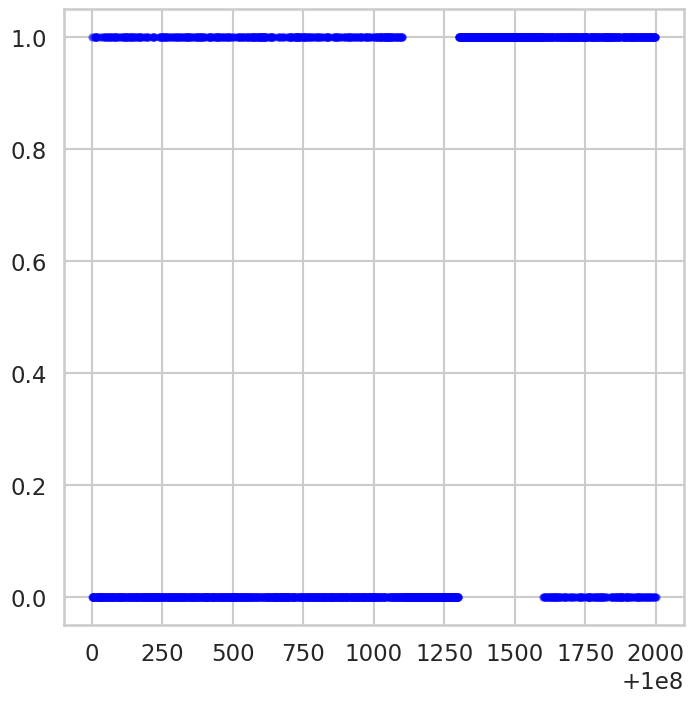

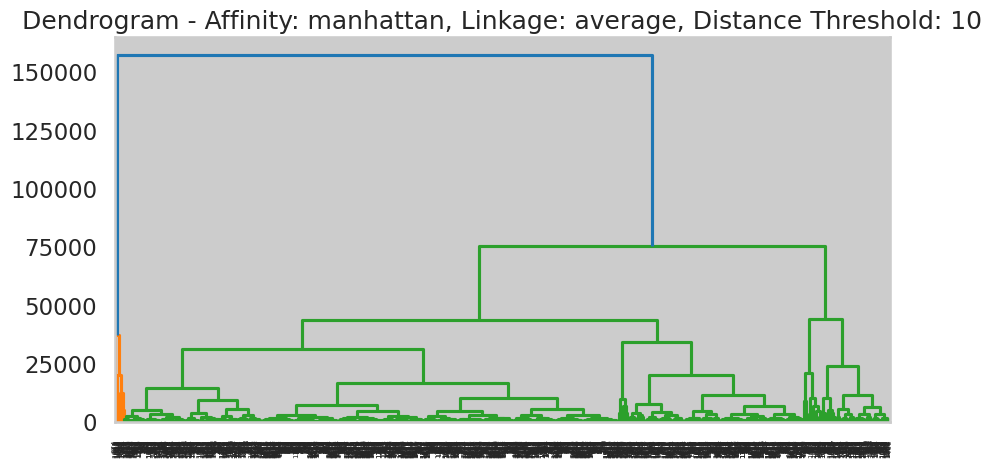

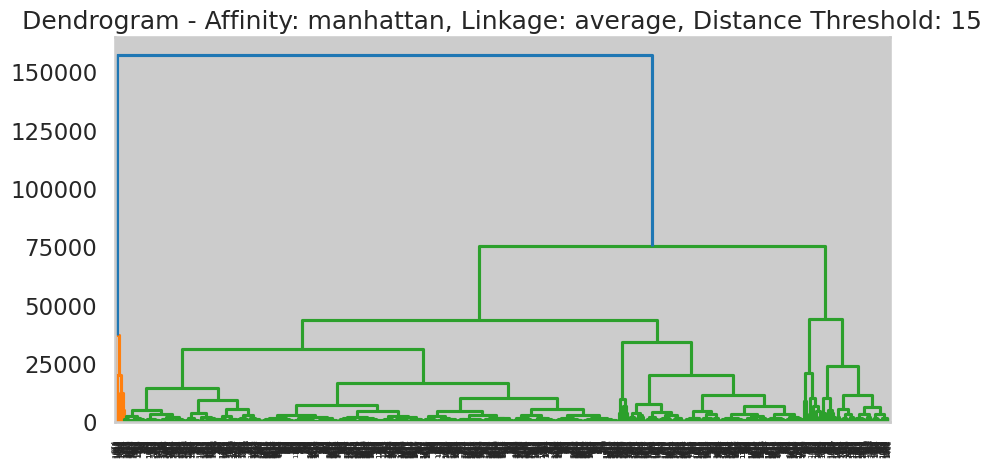

Silhouette score for Affinity: manhattan, Linkage: average, Distance Threshold: 15 is: 0.0009526513211850085


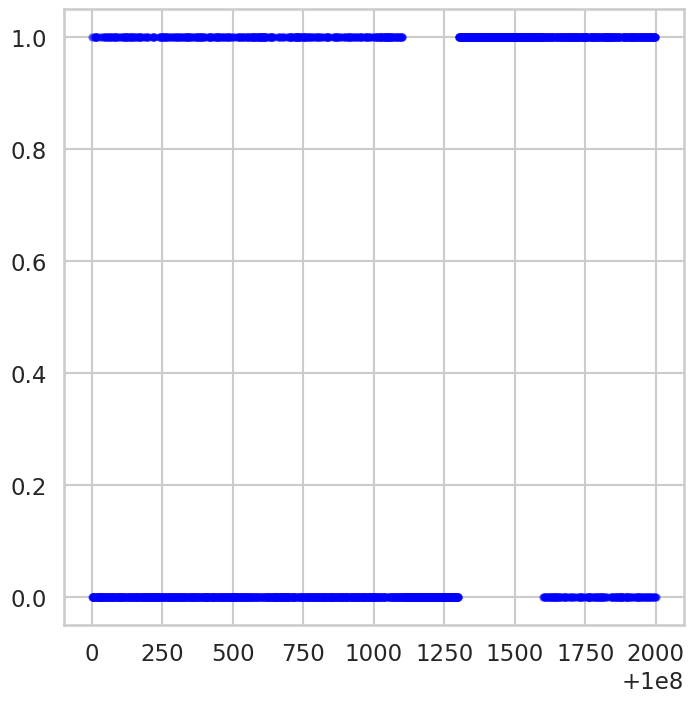

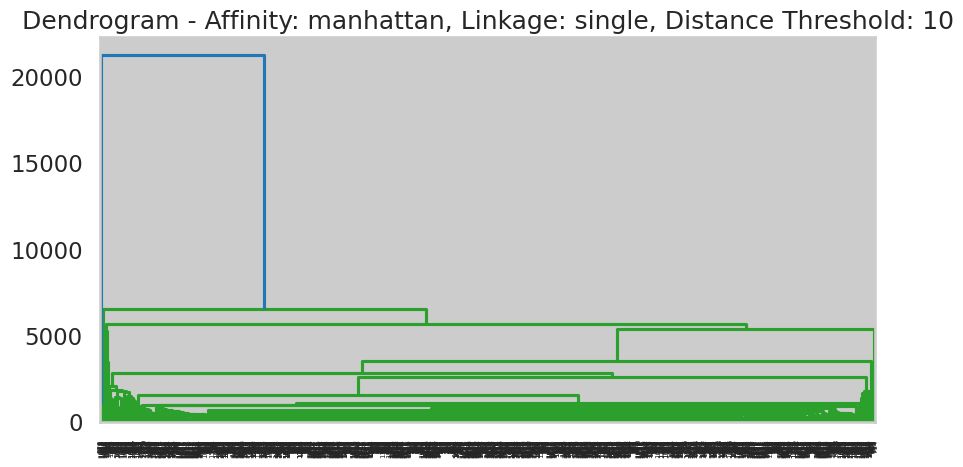

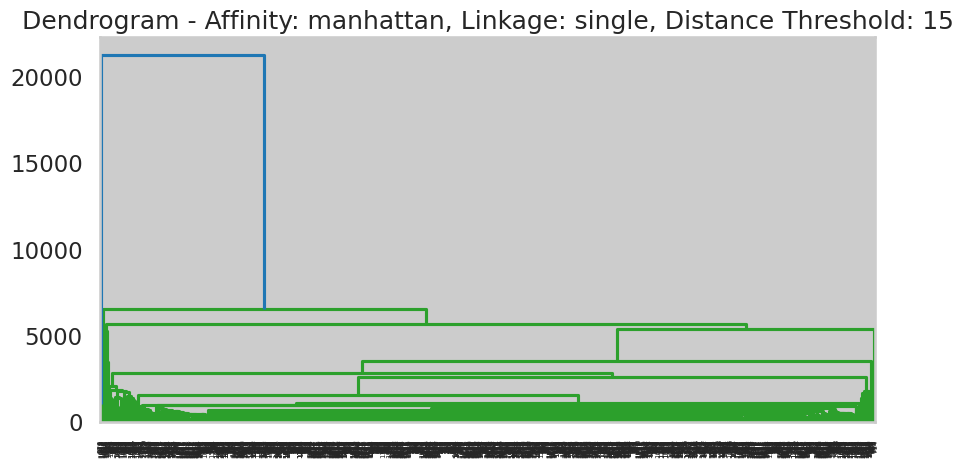

Silhouette score for Affinity: manhattan, Linkage: single, Distance Threshold: 15 is: 0.0009526513211850085


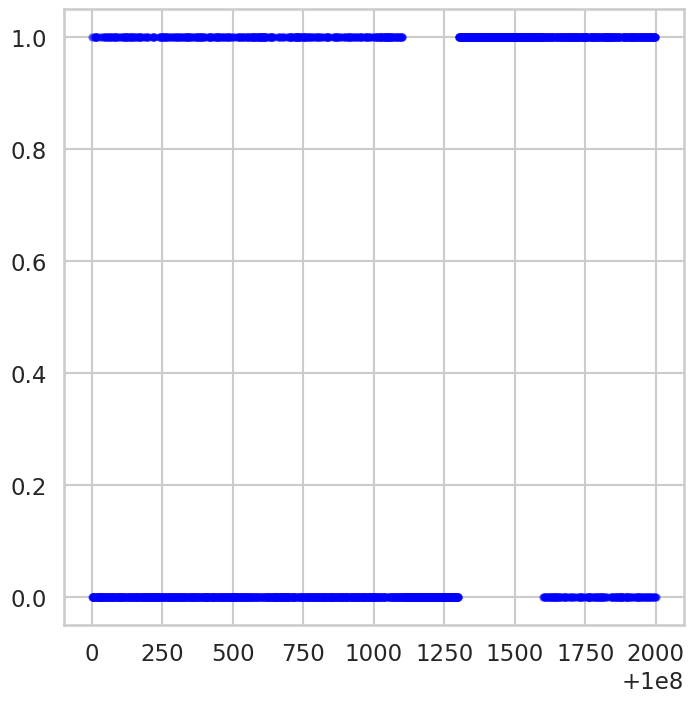

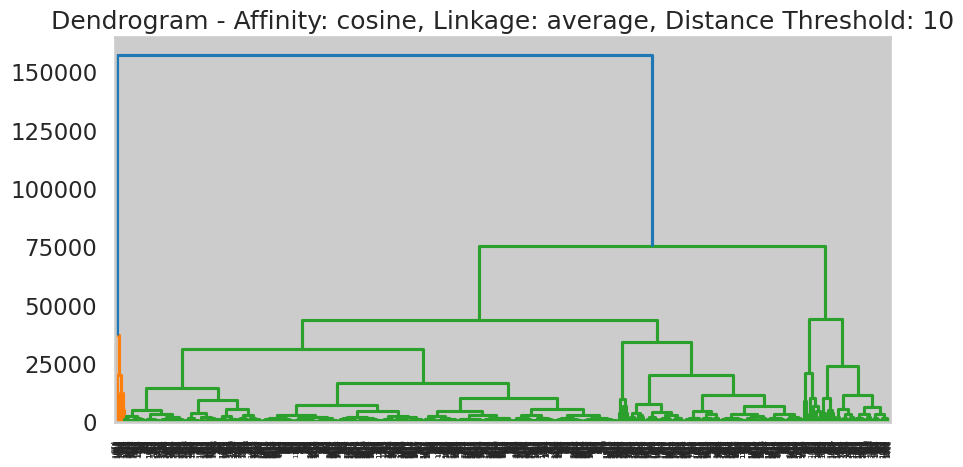

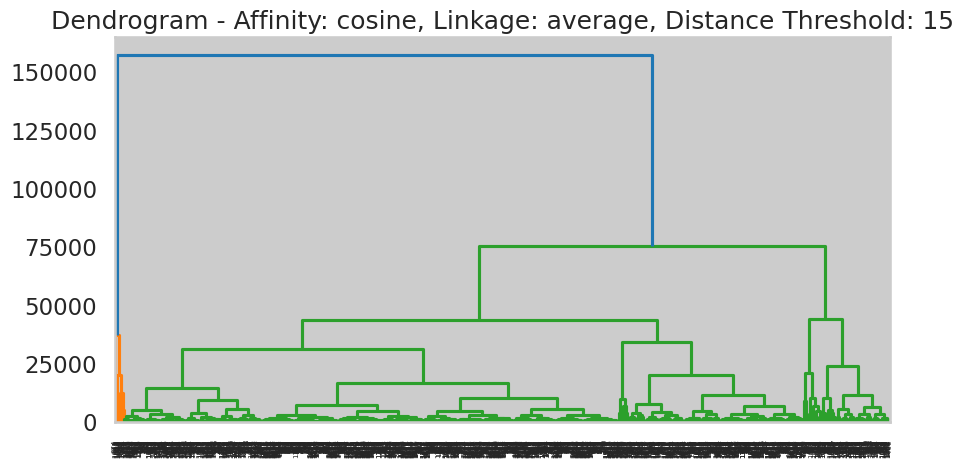

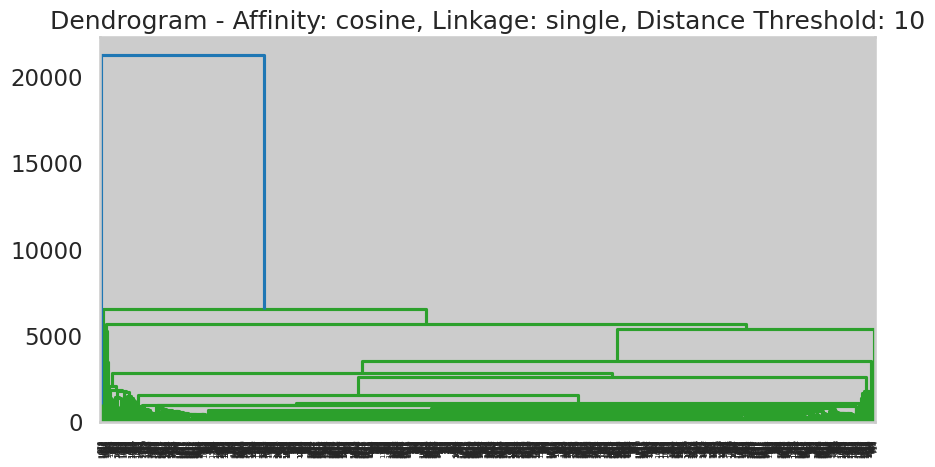

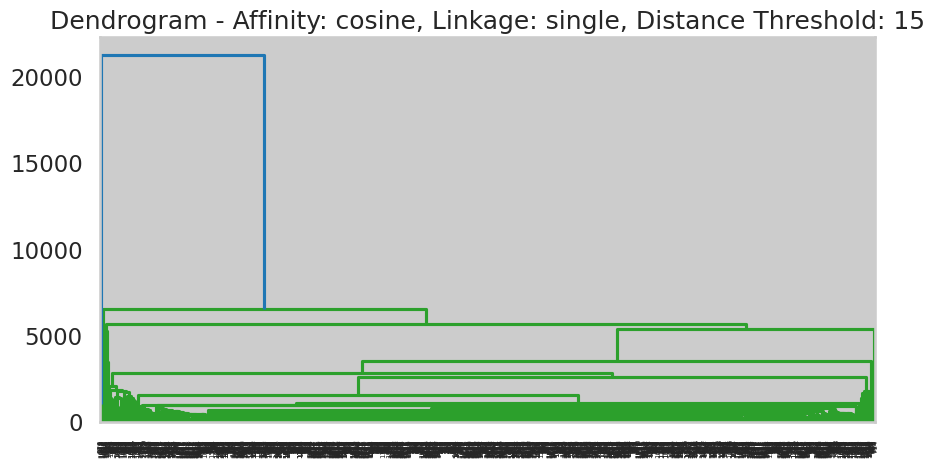


Best Parameters:
{'Affinity': 'euclidean', 'Linkage': 'average', 'Distance_Threshold': 15}
Best Silhouette Score: 0.0018693953211000864


In [ ]:
# Parameters to experiment with
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['average', 'single']
distance_thresholds = [10, 15]

best_silhouette_score = float('-inf')
best_params = {}

# Perform Agglomerative Clustering with different parameters
for affinity in affinities:
    for linkage_method in linkages:
        for distance_threshold in distance_thresholds:
            model = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage_method, distance_threshold=distance_threshold)
            labels = model.fit_predict(customer_data)

            # Plot dendrogram
            plt.figure(figsize=(10, 5))
            dendrogram(linkage(customer_data, method = linkage_method))
            plt.title(f'Dendrogram - Affinity: {affinity}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold}')
            plt.show()

            # Calculate silhouette score
            unique_labels = np.unique(labels)
            if len(unique_labels) >= 2 and len(unique_labels) < 2000:
              silhouette_avg = silhouette_score(customer_data, labels)
              print(f"Silhouette score for Affinity: {affinity}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold} is: {silhouette_avg}")

            # Display resulting clusters
              title = f'Agglomerative Clustering - Affinity: {affinity}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold}'
              display_cluster(customer_data, labels)

            # Update best parameters if silhouette score is higher
              if silhouette_avg > best_silhouette_score:
                  best_silhouette_score = silhouette_avg
                  best_params['Affinity'] = affinity
                  best_params['Linkage'] = linkage_method
                  best_params['Distance_Threshold'] = distance_threshold

# Display the best parameters and silhouette score
print("\nBest Parameters:")
print(best_params)
print(f"Best Silhouette Score: {best_silhouette_score}")

#### DBSCAN:

In [33]:
# Parameters to experiment with
epsilons = np.arange(0.1, 3.1, 0.1)
min_samples_values = range(5, 26)

best_silhouette_score = float('-inf')
best_params = {}

# Perform DBSCAN Clustering with different parameters
for eps in epsilons:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(customer_data)

        # Check if there are at least two unique labels for silhouette score
        unique_labels = np.unique(labels)
        if len(unique_labels) > 1:
            # Calculate silhouette score
            silhouette_avg = silhouette_score(customer_data, labels)
            print(f"Silhouette score for EPS: {eps}, Min_samples: {min_samples} is: {silhouette_avg}")

            # Display resulting clusters
            title = f'DBSCAN Clustering - EPS: {eps}, Min_samples: {min_samples}'
            display_cluster(customer_data, labels)

            # Update best parameters if silhouette score is higher
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_params['EPS'] = eps
                best_params['Min_Samples'] = min_samples

# Display the best parameters and silhouette score
print("\nBest Parameters:")
print(best_params)
print(f"Best Silhouette Score: {best_silhouette_score}")


Best Parameters:
{}
Best Silhouette Score: -inf


#### Gaussian Mixture:

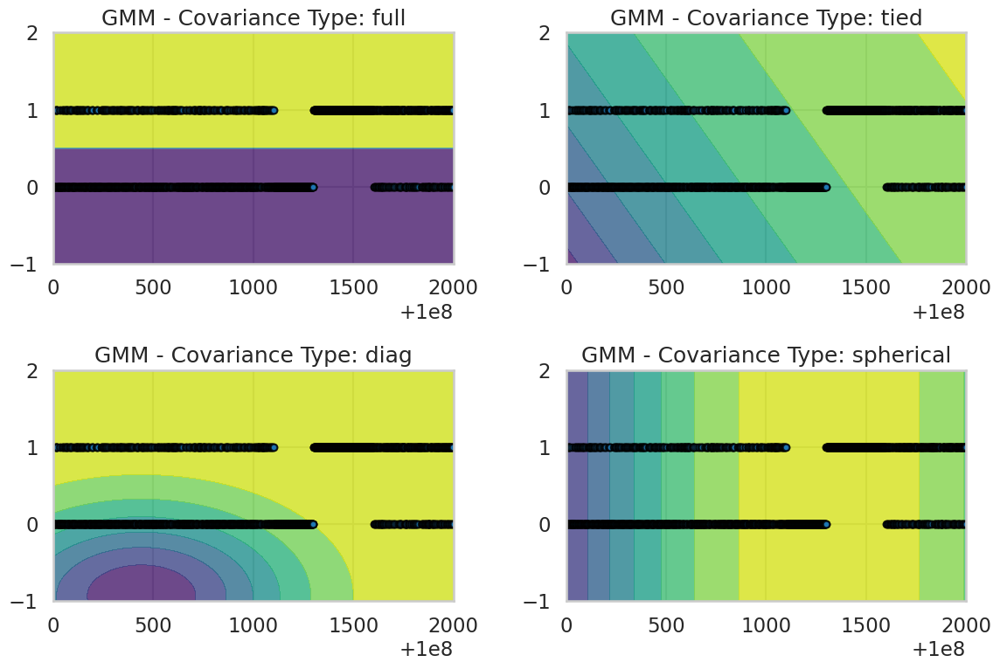

In [29]:
def plot_gmm_probabilities(gmm, X, title, ax):
    # Create a meshgrid for visualization
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

    # Extend the meshgrid for 8 features
    xy = np.column_stack([xx.ravel(), yy.ravel()] + [np.zeros_like(xx.ravel()) for _ in range(X.shape[1] - 2)])

    probabilities = gmm.predict_proba(xy)

    # Reshape the probabilities to match the meshgrid shape
    probabilities = probabilities[:, 1].reshape(xx.shape)

    # Plot the filled contours based on probabilities
    ax.contourf(xx, yy, probabilities, cmap='viridis', alpha=0.8)

    # Scatter plot of the input data points
    ax.scatter(X[:, 0], X[:, 1], s=30, edgecolor='k', alpha=0.7)

    ax.set_title(title)

# Perform Gaussian Mixture Modeling with different covariance_types
plt.figure(figsize=(12, 8))

for i, cov_type in enumerate(covariance_types, 1):
    # Fit Gaussian Mixture Model
    gmm = GaussianMixture(n_components=3, covariance_type=cov_type, random_state=42)
    gmm.fit(customer_data)

    # Visualize the probability fits
    ax = plt.subplot(2, 2, i)
    plot_gmm_probabilities(gmm, customer_data, f'GMM - Covariance Type: {cov_type}', ax)

plt.tight_layout()
plt.show()


### Normalized

In [20]:
scaler = StandardScaler()
customer_normalized = scaler.fit_transform(customer_data)

#### Kmeans:

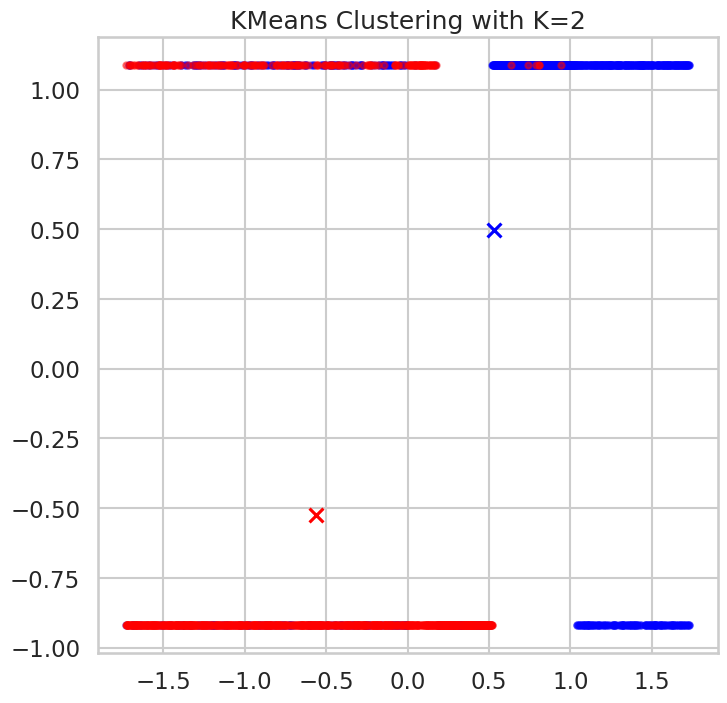

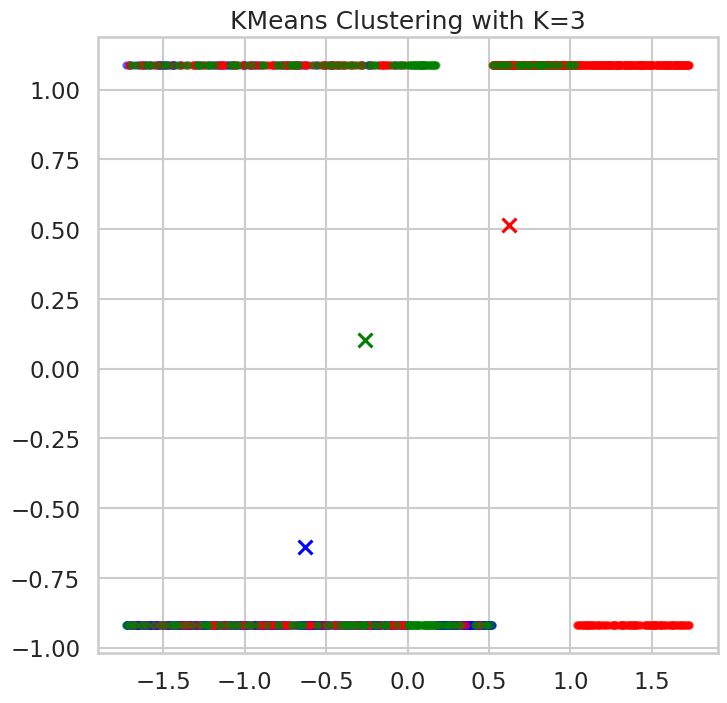

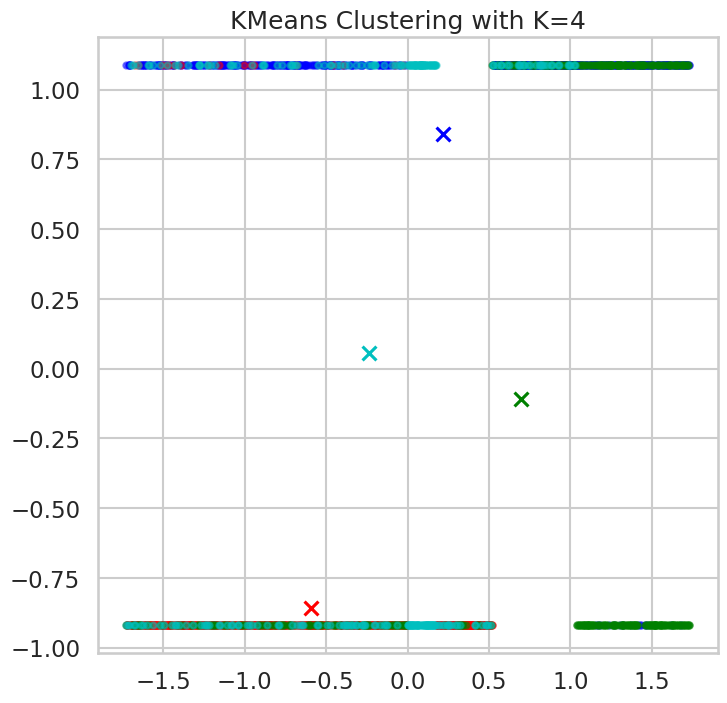

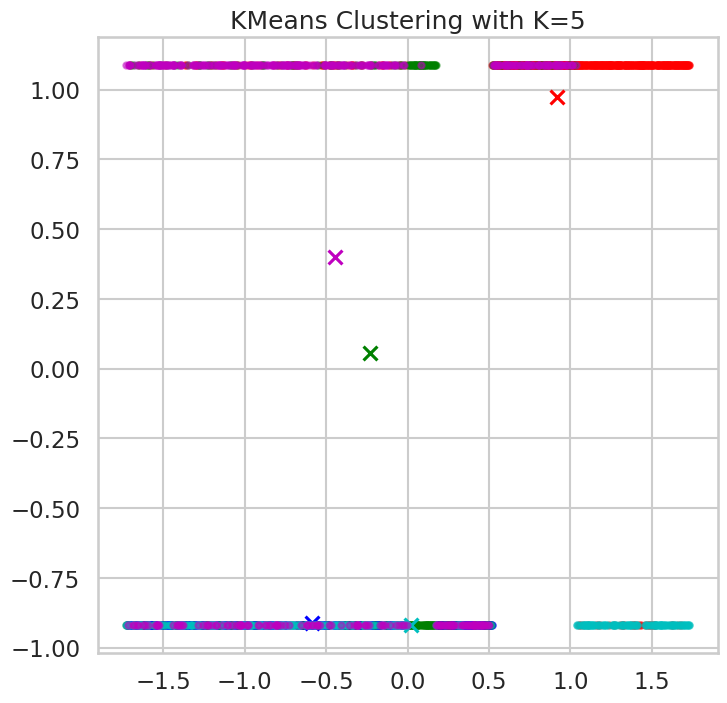

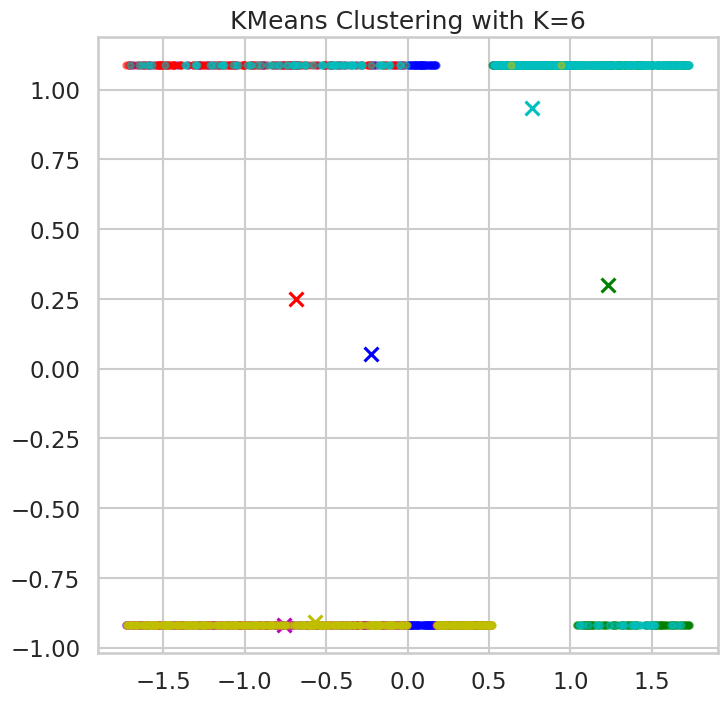

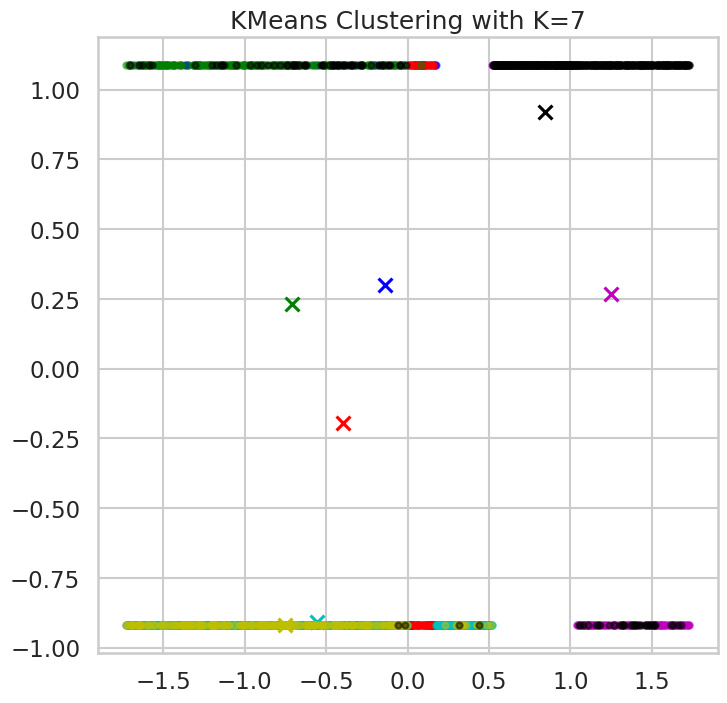

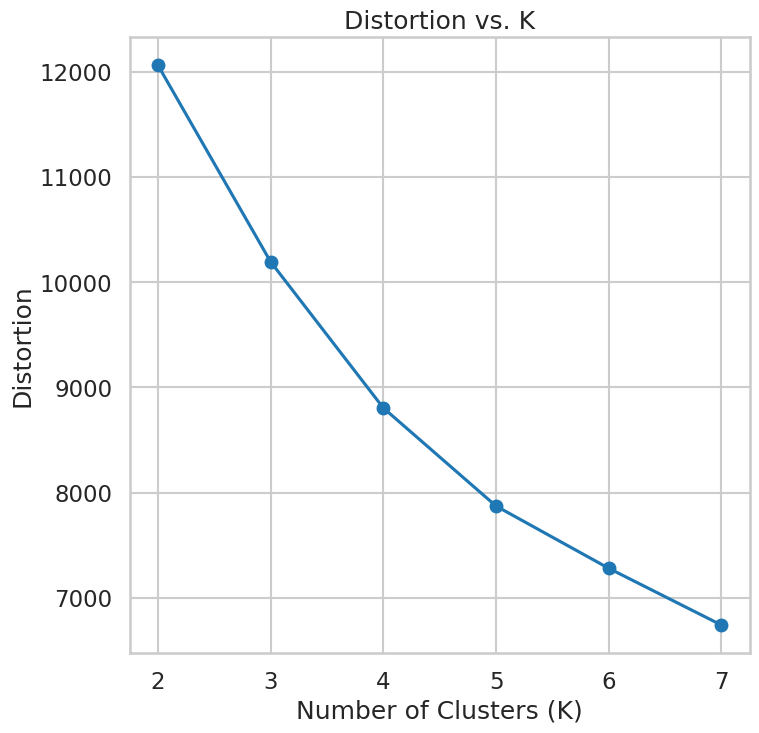

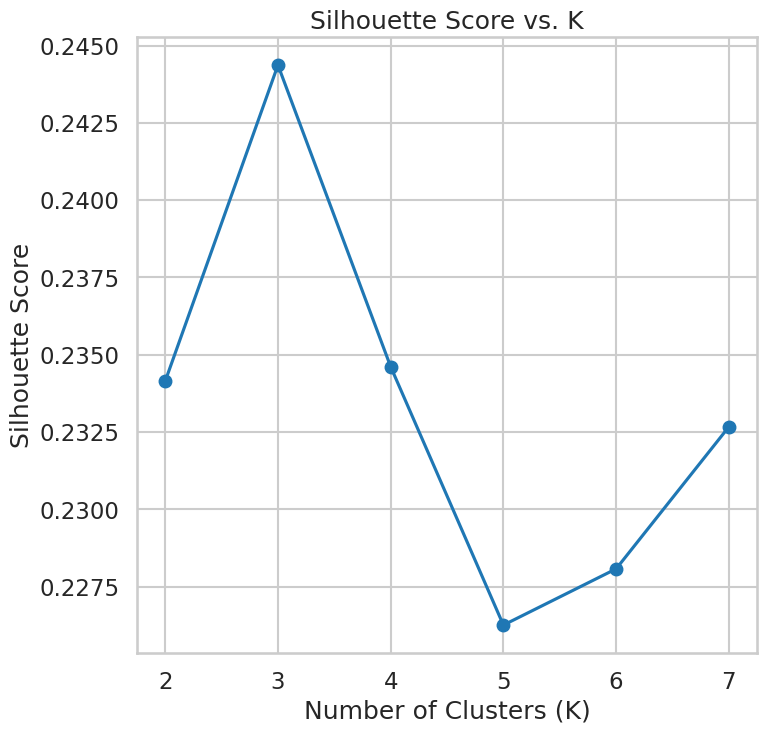

The best K based on silhouette score is: 3
Silhouette score for the best K: 0.24436844393676216


In [ ]:
# Applying KMeans with different values of K
k_values = range(2, 8)
distortions = []
silhouette_scores = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(customer_normalized)

    # Display clusters for each K
    plt.figure()
    display_cluster(customer_normalized, km=kmeans, num_clusters=k)
    plt.title(f"KMeans Clustering with K={k}")
    plt.show()

    # Compute distortion (inertia) for each K
    distortions.append(kmeans.inertia_)

    # Compute silhouette score for each K
    silhouette_avg = silhouette_score(customer_normalized, kmeans.labels_)
    silhouette_scores.append(silhouette_avg)

# Plot the distortion function versus K
plt.figure()
plt.plot(k_values, distortions, marker='o')
plt.title('Distortion vs. K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.show()

# Plot the silhouette_score versus K
plt.figure()
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score vs. K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.show()

# Choose the best K based on silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
print(f"The best K based on silhouette score is: {best_k}")

# Store the silhouette_score for the best K for later comparison
best_k_silhouette_score = max(silhouette_scores)
print(f"Silhouette score for the best K: {best_k_silhouette_score}")

#### Hierarchial Clustering:

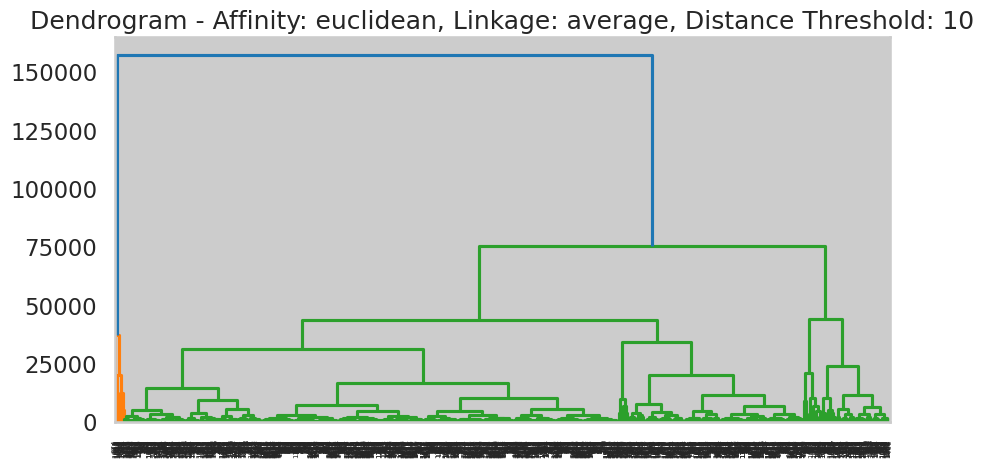

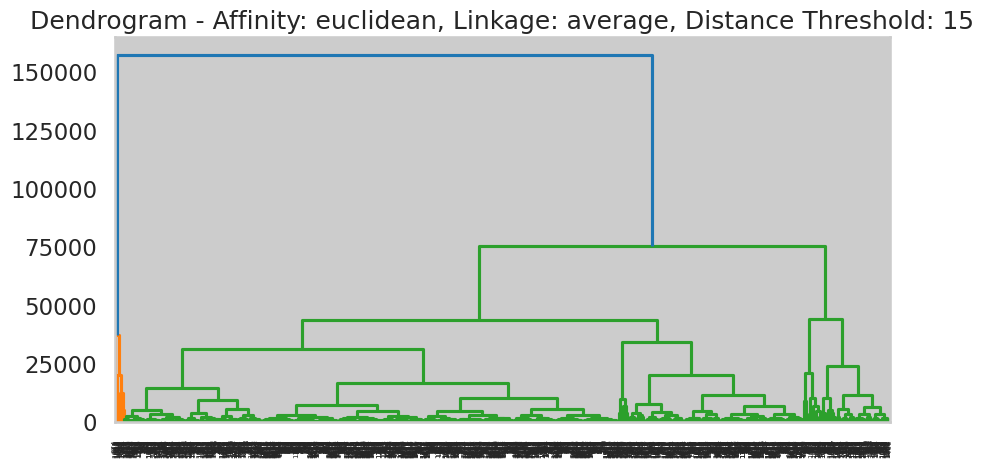

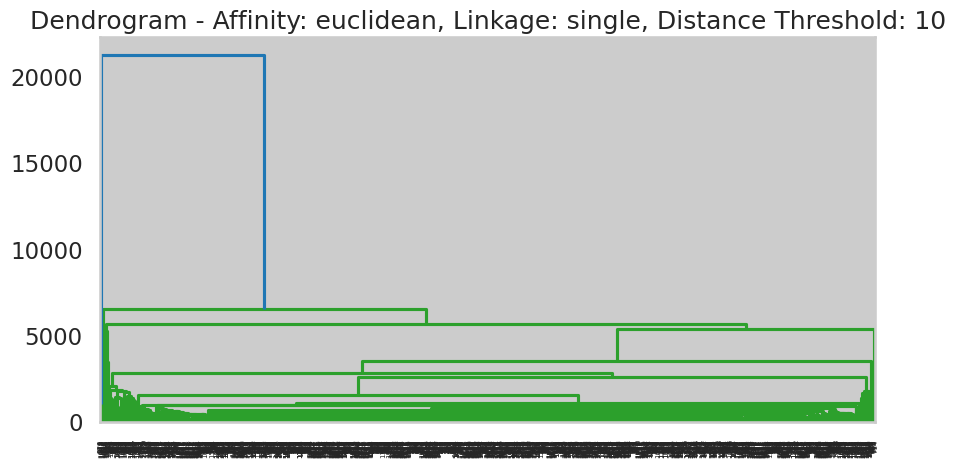

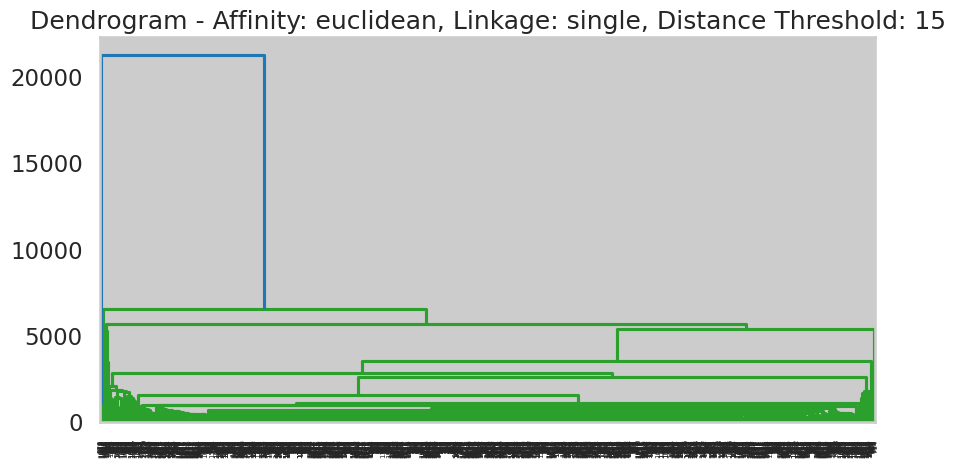

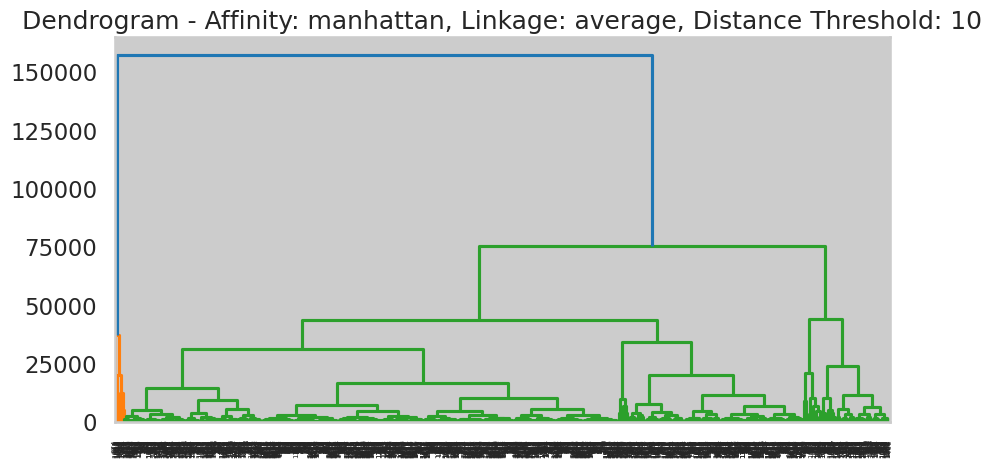

Silhouette score for Affinity: manhattan, Linkage: average, Distance Threshold: 10 is: 0.20536034264399053


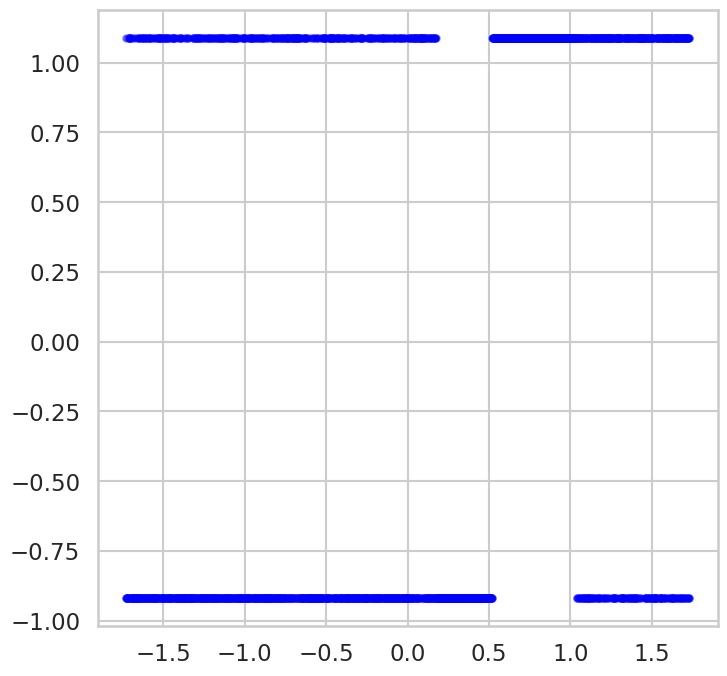

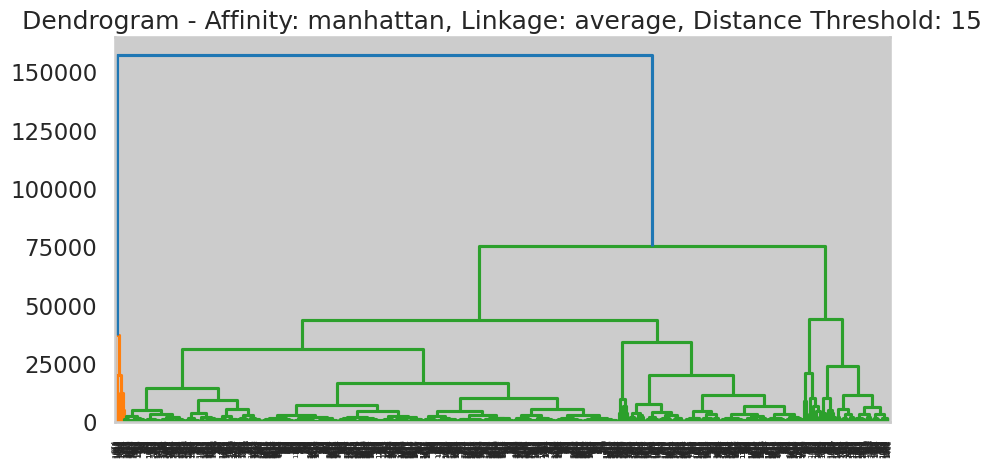

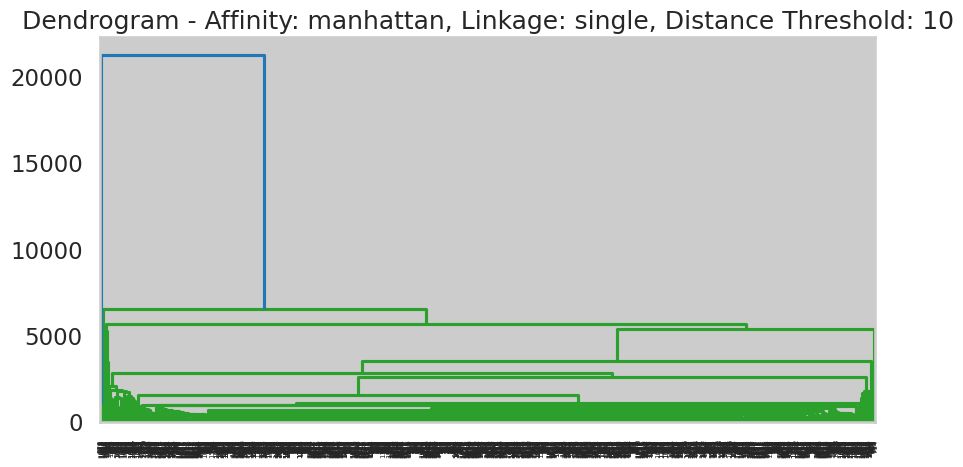

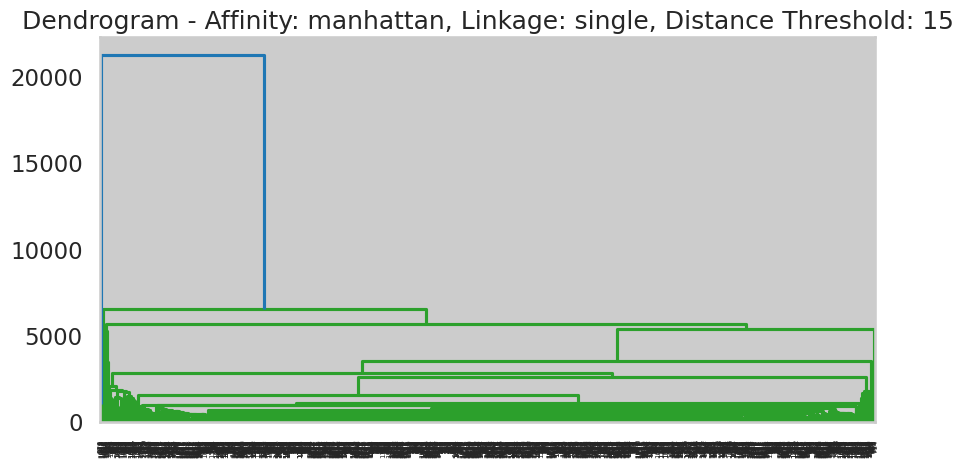

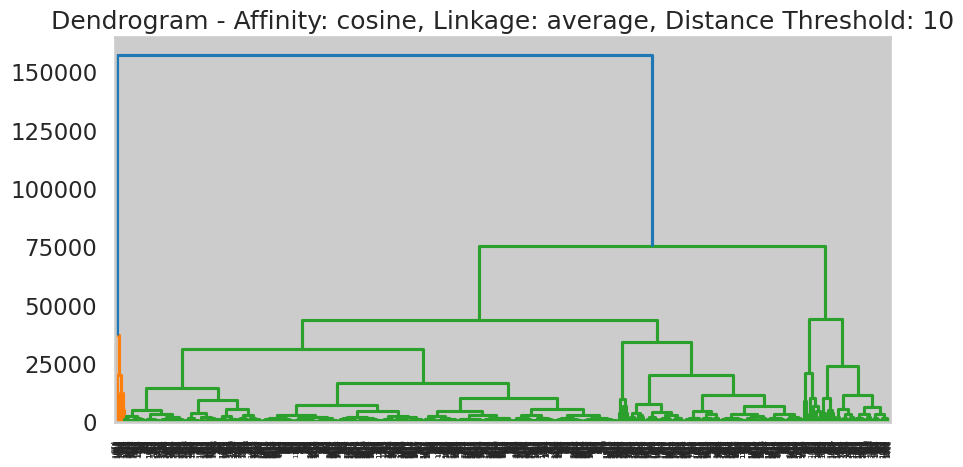

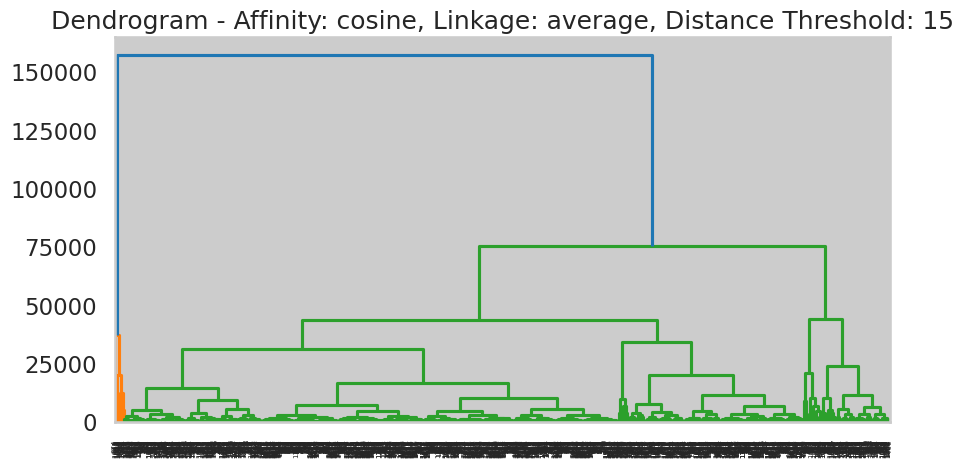

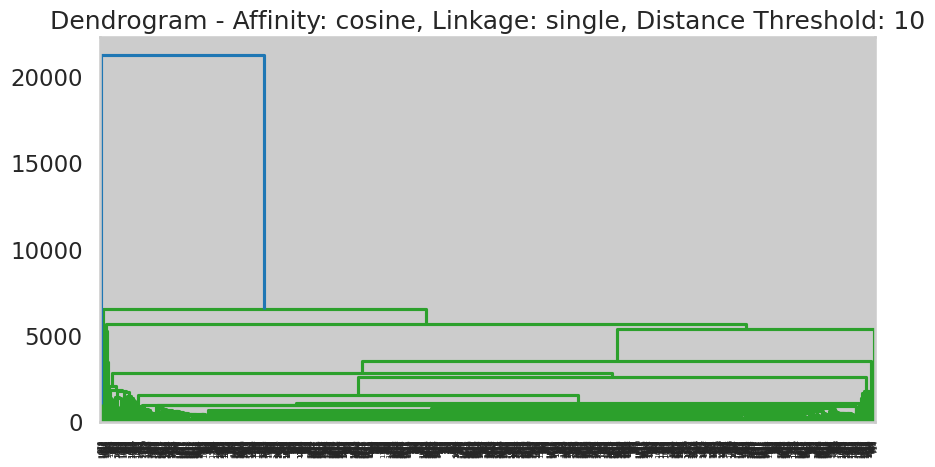

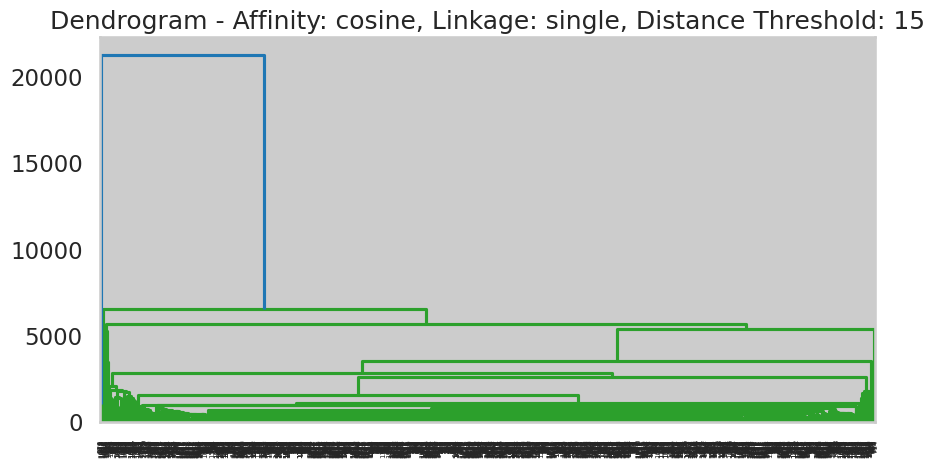


Best Parameters:
{'Affinity': 'manhattan', 'Linkage': 'average', 'Distance_Threshold': 10}
Best Silhouette Score: 0.20536034264399053


In [ ]:
# Parameters to experiment with
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['average', 'single']
distance_thresholds = [10, 15]

best_silhouette_score = float('-inf')
best_params = {}

# Perform Agglomerative Clustering with different parameters
for affinity in affinities:
    for linkage_method in linkages:
        for distance_threshold in distance_thresholds:
            model = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage_method, distance_threshold=distance_threshold)
            labels = model.fit_predict(customer_normalized)

            # Plot dendrogram
            plt.figure(figsize=(10, 5))
            dendrogram(linkage(customer_data, method = linkage_method))
            plt.title(f'Dendrogram - Affinity: {affinity}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold}')
            plt.show()

            # Calculate silhouette score
            unique_labels = np.unique(labels)
            if len(unique_labels) >= 2 and len(unique_labels) < 2000:
              silhouette_avg = silhouette_score(customer_normalized, labels)
              print(f"Silhouette score for Affinity: {affinity}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold} is: {silhouette_avg}")

            # Display resulting clusters
              title = f'Agglomerative Clustering - Affinity: {affinity}, Linkage: {linkage_method}, Distance Threshold: {distance_threshold}'
              display_cluster(customer_normalized, labels)

            # Update best parameters if silhouette score is higher
              if silhouette_avg > best_silhouette_score:
                  best_silhouette_score = silhouette_avg
                  best_params['Affinity'] = affinity
                  best_params['Linkage'] = linkage_method
                  best_params['Distance_Threshold'] = distance_threshold

# Display the best parameters and silhouette score
print("\nBest Parameters:")
print(best_params)
print(f"Best Silhouette Score: {best_silhouette_score}")

#### DBSCAN:

Silhouette score for EPS: 0.2, Min_samples: 5 is: -0.36115936221678757
Silhouette score for EPS: 0.2, Min_samples: 6 is: -0.23130283272654298
Silhouette score for EPS: 0.2, Min_samples: 7 is: -0.2255993020501225
Silhouette score for EPS: 0.2, Min_samples: 8 is: -0.211590657639302
Silhouette score for EPS: 0.30000000000000004, Min_samples: 5 is: -0.30176978018823525
Silhouette score for EPS: 0.30000000000000004, Min_samples: 6 is: -0.32294743989400765
Silhouette score for EPS: 0.30000000000000004, Min_samples: 7 is: -0.32608049514807985
Silhouette score for EPS: 0.30000000000000004, Min_samples: 8 is: -0.28001556995239785
Silhouette score for EPS: 0.30000000000000004, Min_samples: 9 is: -0.14033466124862212
Silhouette score for EPS: 0.30000000000000004, Min_samples: 10 is: -0.15667959151707025
Silhouette score for EPS: 0.30000000000000004, Min_samples: 11 is: -0.17435699569444763
Silhouette score for EPS: 0.30000000000000004, Min_samples: 12 is: -0.16440176283999391
Silhouette score for

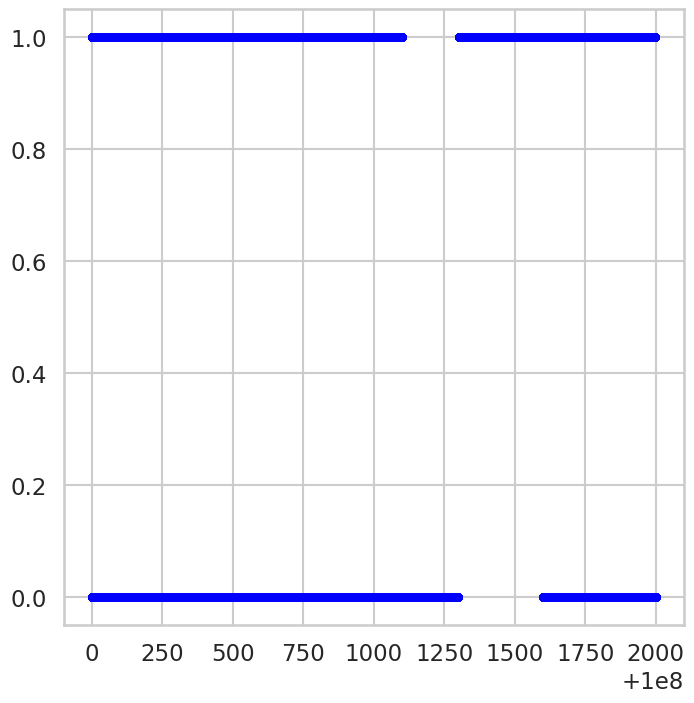

In [ ]:
# Parameters to experiment with
epsilons = np.arange(0.1, 3.1, 0.1)
min_samples_values = range(5, 26)

best_silhouette_score = float('-inf')
best_params = {}

# Perform DBSCAN Clustering with different parameters
for eps in epsilons:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(customer_normalized)

        # Check if there are at least two unique labels for silhouette score
        unique_labels = np.unique(labels)
        if len(unique_labels) > 1:
            # Calculate silhouette score
            silhouette_avg = silhouette_score(customer_normalized, labels)
            print(f"Silhouette score for EPS: {eps}, Min_samples: {min_samples} is: {silhouette_avg}")

            # Display resulting clusters
            title = f'DBSCAN Clustering - EPS: {eps}, Min_samples: {min_samples}'
            display_cluster(customer_data, labels)

            # Update best parameters if silhouette score is higher
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_params['EPS'] = eps
                best_params['Min_Samples'] = min_samples

# Display the best parameters and silhouette score
print("\nBest Parameters:")
print(best_params)
print(f"Best Silhouette Score: {best_silhouette_score}")

#### Gaussian Mixture:

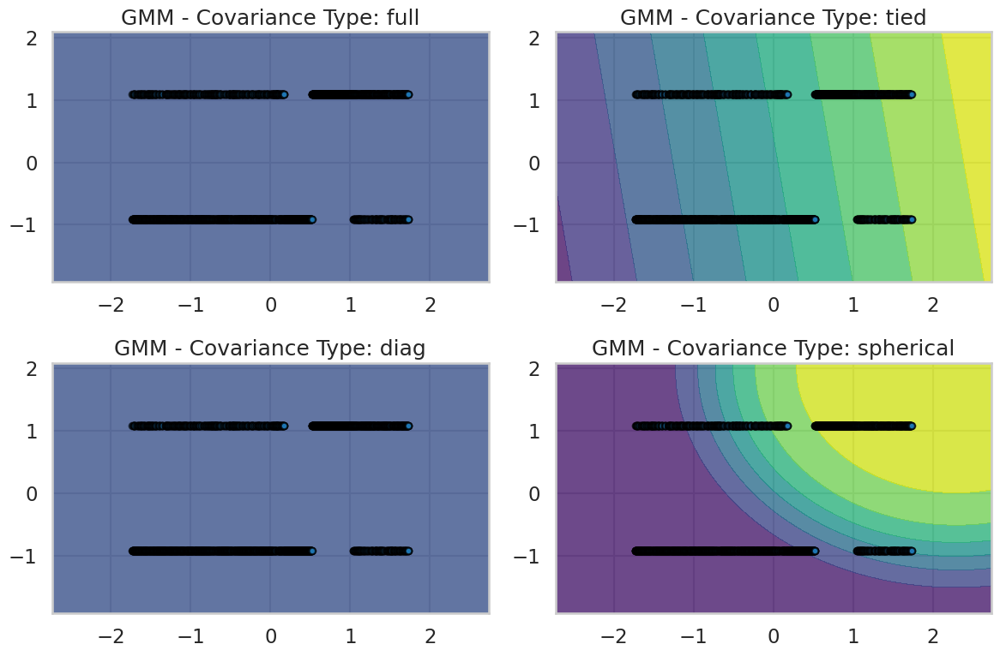

In [21]:
def plot_gmm_probabilities(gmm, X, title, ax):
    # Create a meshgrid for visualization
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

    # Extend the meshgrid for 8 features
    xy = np.column_stack([xx.ravel(), yy.ravel()] + [np.zeros_like(xx.ravel()) for _ in range(X.shape[1] - 2)])

    probabilities = gmm.predict_proba(xy)

    # Reshape the probabilities to match the meshgrid shape
    probabilities = probabilities[:, 1].reshape(xx.shape)

    # Plot the filled contours based on probabilities
    ax.contourf(xx, yy, probabilities, cmap='viridis', alpha=0.8)

    # Scatter plot of the input data points
    ax.scatter(X[:, 0], X[:, 1], s=30, edgecolor='k', alpha=0.7)

    ax.set_title(title)

# Perform Gaussian Mixture Modeling with different covariance_types
plt.figure(figsize=(12, 8))

for i, cov_type in enumerate(covariance_types, 1):
    # Fit Gaussian Mixture Model
    gmm = GaussianMixture(n_components=2, covariance_type=cov_type, random_state=42)
    gmm.fit(customer_normalized)

    # Visualize the probability fits
    ax = plt.subplot(2, 2, i)
    plot_gmm_probabilities(gmm, customer_normalized, f'GMM - Covariance Type: {cov_type}', ax)

plt.tight_layout()
plt.show()

## Comparing

### Multi Blob Dataset

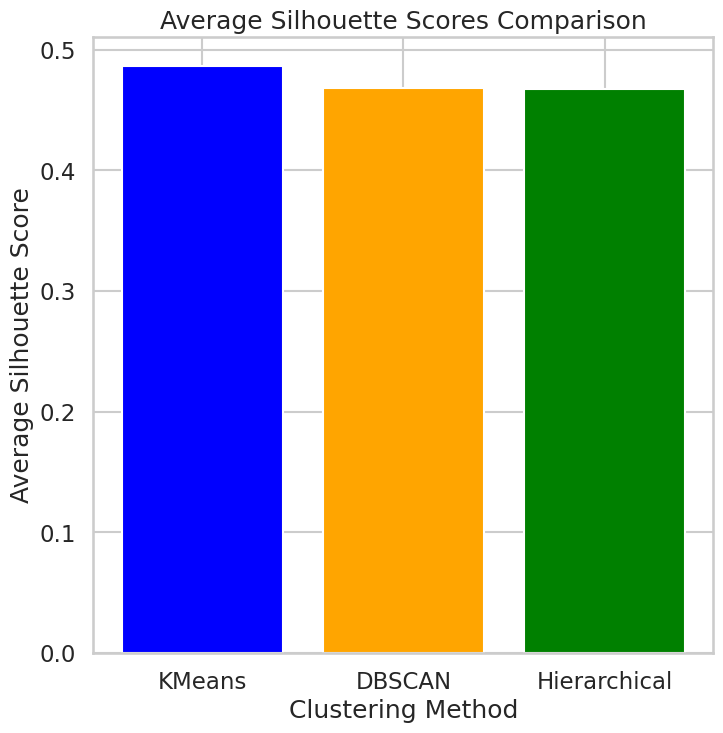


The best clustering method is KMeans with an average silhouette score of 0.48614459735646176


In [27]:

def compare_silhouette_scores(silhouette_scores, methods):
    avg_scores = [np.mean(scores) for scores in silhouette_scores]

    # Plotting bar diagram
    plt.bar(methods, avg_scores, color=['blue', 'orange', 'green'])
    plt.xlabel('Clustering Method')
    plt.ylabel('Average Silhouette Score')
    plt.title('Average Silhouette Scores Comparison')
    plt.show()

    # Find the best method
    best_method = methods[np.argmax(avg_scores)]
    best_score = max(avg_scores)

    print(f"\nThe best clustering method is {best_method} with an average silhouette score of {best_score}")



kmeans_scores = [0.48614459735646176]
dbscan_scores = [0.4685207355522043]
hierarchical_scores = [0.46762361386512785]
silhouette_scores = [kmeans_scores, dbscan_scores, hierarchical_scores]
methods = ['KMeans', 'DBSCAN', 'Hierarchical']
compare_silhouette_scores(silhouette_scores, methods)


### Iris Dataset

#### Original

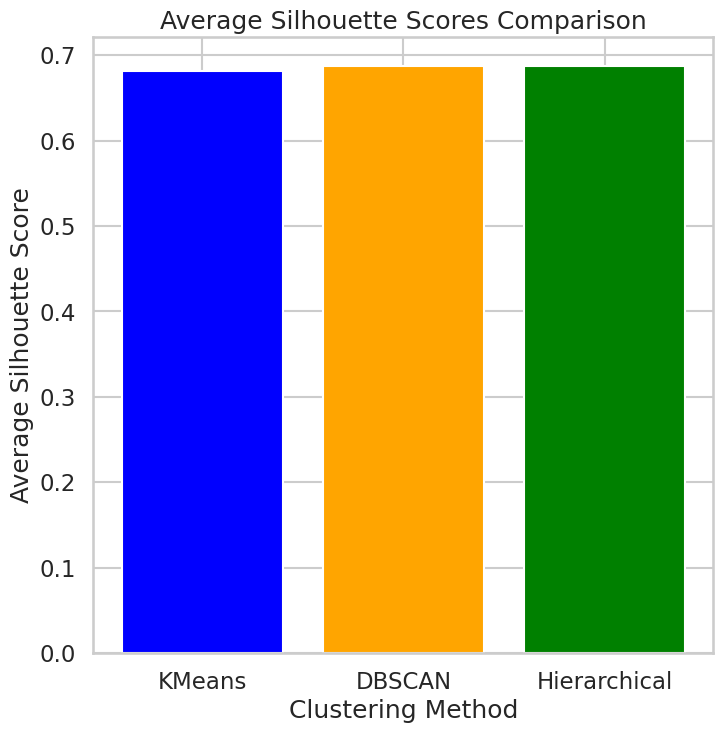


The best clustering method is DBSCAN with an average silhouette score of 0.6867350732769777


In [28]:
kmeans_scores = [0.6810461692117462]
dbscan_scores = [0.6867350732769777]
hierarchical_scores = [0.6867350732769777]
silhouette_scores = [kmeans_scores, dbscan_scores, hierarchical_scores]
methods = ['KMeans', 'DBSCAN', 'Hierarchical']
compare_silhouette_scores(silhouette_scores, methods)

#### Normalized

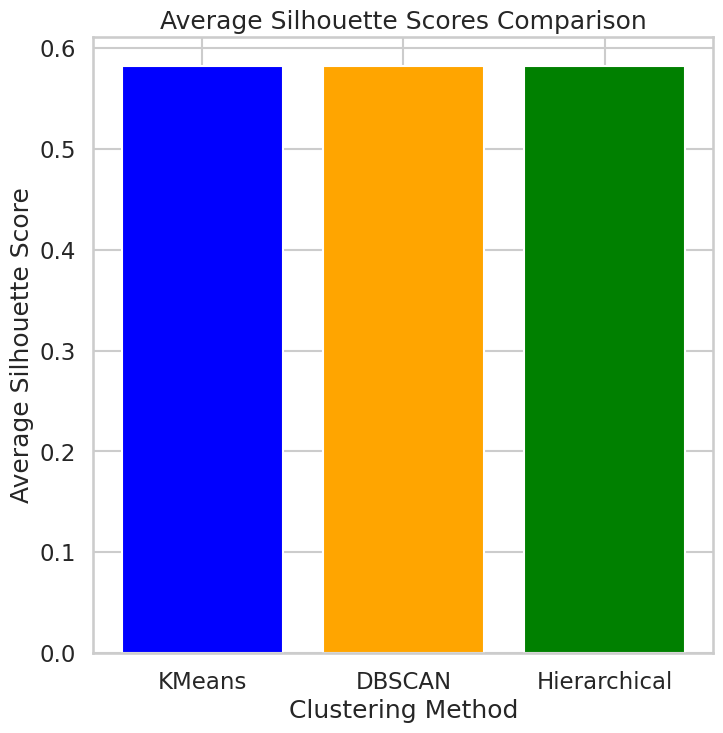


The best clustering method is KMeans with an average silhouette score of 0.5817500491982808


In [35]:
kmeans_scores = [0.5817500491982808]
dbscan_scores = [0.5817500491982808]
hierarchical_scores = [0.5817500491982808]
silhouette_scores = [kmeans_scores, dbscan_scores, hierarchical_scores]
methods = ['KMeans', 'DBSCAN', 'Hierarchical']
compare_silhouette_scores(silhouette_scores, methods)

### Customer Data

#### Original

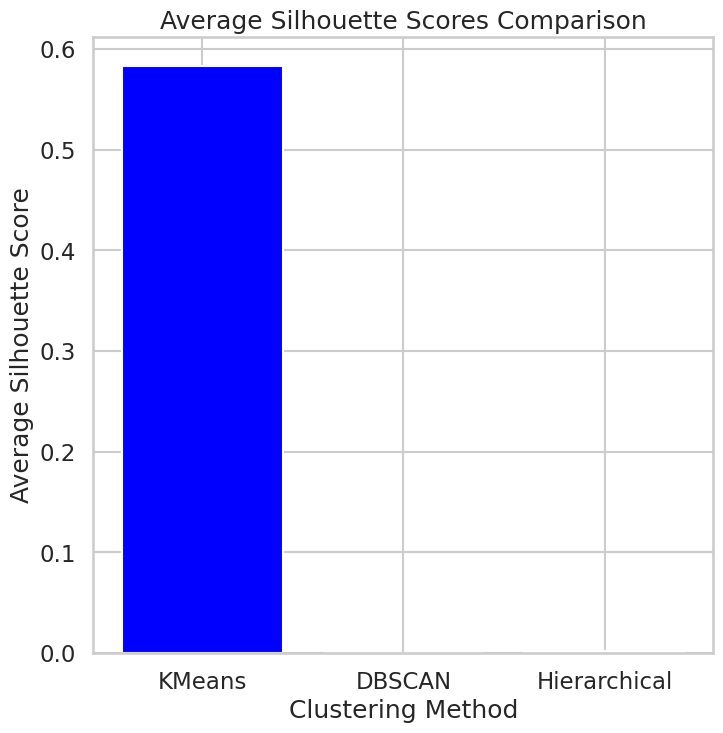


The best clustering method is KMeans with an average silhouette score of 0.5828454744042129


In [34]:
kmeans_scores = [0.5828454744042129]
dbscan_scores = [0]
hierarchical_scores = [0.0018693953211000864]
silhouette_scores = [kmeans_scores, dbscan_scores, hierarchical_scores]
methods = ['KMeans', 'DBSCAN', 'Hierarchical']
compare_silhouette_scores(silhouette_scores, methods)

#### Normalized

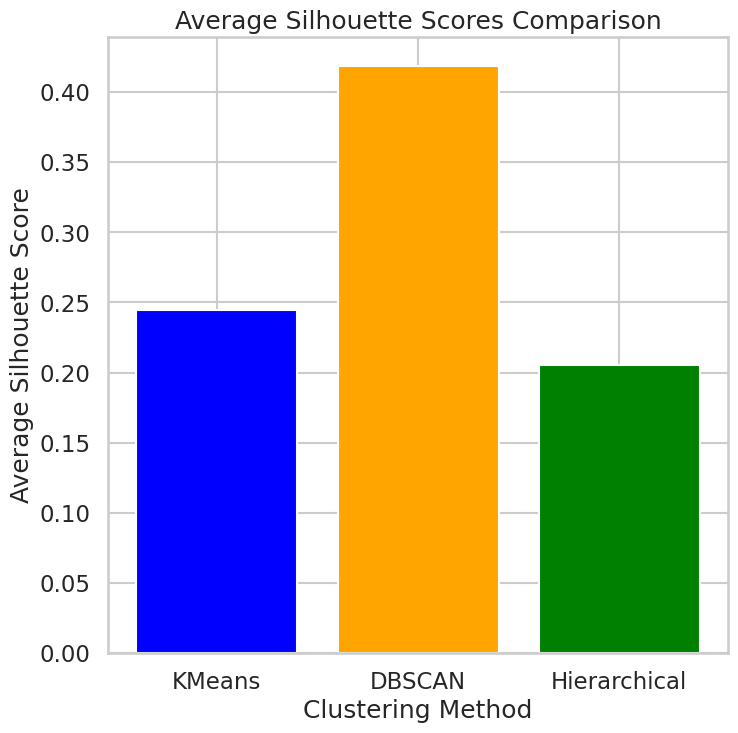


The best clustering method is DBSCAN with an average silhouette score of 0.41831533424851236


In [36]:
kmeans_scores = [0.24436844393676216]
dbscan_scores = [0.41831533424851236]
hierarchical_scores = [0.20536034264399053]
silhouette_scores = [kmeans_scores, dbscan_scores, hierarchical_scores]
methods = ['KMeans', 'DBSCAN', 'Hierarchical']
compare_silhouette_scores(silhouette_scores, methods)